# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
# Fix for displaying error on MNIST dataset
!pip install matplotlib==2.2.0

data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 12.5MB 56kB/s  eta 0:00:01
    100% |████████████████████████████████| 952kB 732kB/s eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

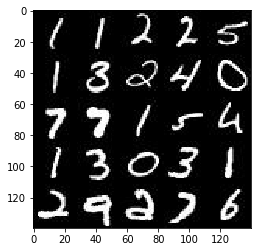

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

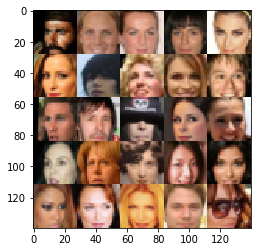

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_images = tf.placeholder(tf.float32, (None, *(image_width, image_height, image_channels)), name='input_real')
    z_data = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return real_images, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/opt/co

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    keep_probability = 0.8
    alpha = 0.2
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # 1st layer
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.nn.dropout(x1, keep_probability)
        leaky_relu1 = tf.maximum(alpha * x1, x1)
        
        # 2nd layer
        x2 = tf.layers.conv2d(leaky_relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.nn.dropout(x2, keep_probability)
        batch_norm2 = tf.layers.batch_normalization(x2, training=True)
        leaky_relu2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        
        # 3rd layer
        x3 = tf.layers.conv2d(leaky_relu2, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.nn.dropout(x3, keep_probability)
        batch_norm3 = tf.layers.batch_normalization(x3, training=True)
        leaky_relu3 = tf.maximum(alpha * batch_norm3, batch_norm3)


        # 4th layer
        flat = tf.reshape(leaky_relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        logits = tf.nn.dropout(logits, keep_probability)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    keep_probability = 0.9 
    alpha = 0.2
    
    with tf.variable_scope('generator', reuse=not is_train):
        
        # 1st layer
        x1 = tf.layers.dense(z, 7*7*512, kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        batch_norm1 = tf.layers.batch_normalization(x1, training=is_train)
        leaky_relu1 = tf.maximum(alpha * batch_norm1, batch_norm1)
        
        # 2nd layer
        x2 = tf.layers.conv2d_transpose(leaky_relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch_norm2 = tf.layers.batch_normalization(x2, training=is_train)
        leaky_relu2 = tf.maximum(alpha * batch_norm2, batch_norm2)
        
        # 3rd layer
        x3 = tf.layers.conv2d_transpose(leaky_relu2, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch_norm3 = tf.layers.batch_normalization(x3, training=is_train)
        leaky_relu3 = tf.maximum(alpha * batch_norm3, batch_norm3)
        
        # 4th layer
        logits = tf.layers.conv2d_transpose(leaky_relu3, out_channel_dim, 5, strides=1, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.tanh(logits)
    
    return out



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    if (data_image_mode == "L"):
        out_channel_dim=1
    else:
        out_channel_dim=3
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    lr = learning_rate
    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    print_every=10
    show_every=100
    samples, losses = [], []
    steps=0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                steps += 1
            
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                
                if steps % print_every == 0:
                    
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f} ...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 9, input_z, data_shape[3], data_image_mode)
            
            show_generator_output(sess, 9, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/8... Discriminator Loss: 0.2496 ... Generator Loss: 6.8563
Epoch 1/8... Discriminator Loss: 0.3466 ... Generator Loss: 9.1524
Epoch 1/8... Discriminator Loss: 0.2606 ... Generator Loss: 7.8776
Epoch 1/8... Discriminator Loss: 0.2384 ... Generator Loss: 8.0710
Epoch 1/8... Discriminator Loss: 0.2713 ... Generator Loss: 8.2445
Epoch 1/8... Discriminator Loss: 0.3359 ... Generator Loss: 8.5655
Epoch 1/8... Discriminator Loss: 0.2443 ... Generator Loss: 7.6271
Epoch 1/8... Discriminator Loss: 1.6052 ... Generator Loss: 13.9077
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 21.9911
Epoch 1/8... Discriminator Loss: 0.2058 ... Generator Loss: 22.1396


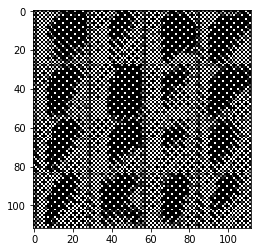

Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 17.9997
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 14.6703
Epoch 1/8... Discriminator Loss: 0.3412 ... Generator Loss: 12.6992
Epoch 1/8... Discriminator Loss: 0.3200 ... Generator Loss: 12.0399
Epoch 1/8... Discriminator Loss: 0.2220 ... Generator Loss: 11.4674
Epoch 1/8... Discriminator Loss: 0.2870 ... Generator Loss: 11.2994
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 11.1643
Epoch 1/8... Discriminator Loss: 0.3088 ... Generator Loss: 11.1860
Epoch 1/8... Discriminator Loss: 0.3143 ... Generator Loss: 11.8829
Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 11.5375


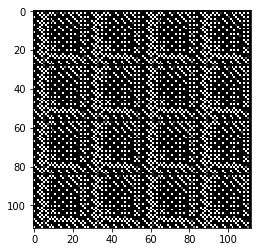

Epoch 1/8... Discriminator Loss: 0.2654 ... Generator Loss: 12.1743
Epoch 1/8... Discriminator Loss: 0.4007 ... Generator Loss: 12.1215
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 9.8792
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 11.4240
Epoch 1/8... Discriminator Loss: 0.2545 ... Generator Loss: 11.4337
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 12.1363
Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 11.3360
Epoch 1/8... Discriminator Loss: 0.2492 ... Generator Loss: 12.6971
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 12.8242
Epoch 1/8... Discriminator Loss: 0.3195 ... Generator Loss: 11.9355


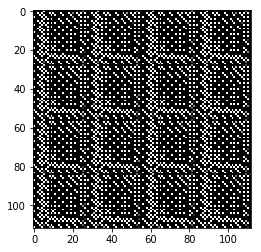

Epoch 1/8... Discriminator Loss: 0.3412 ... Generator Loss: 10.8232
Epoch 1/8... Discriminator Loss: 0.2166 ... Generator Loss: 12.7702
Epoch 1/8... Discriminator Loss: 0.2708 ... Generator Loss: 11.4427
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.2293
Epoch 1/8... Discriminator Loss: 0.1841 ... Generator Loss: 12.7369
Epoch 1/8... Discriminator Loss: 0.2383 ... Generator Loss: 12.0739
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 12.5455
Epoch 1/8... Discriminator Loss: 0.2599 ... Generator Loss: 11.9583
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 11.9725
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 10.7512


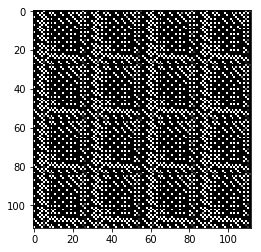

Epoch 1/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.1103
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 12.7221
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.3567
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.8111
Epoch 1/8... Discriminator Loss: 0.2653 ... Generator Loss: 12.8259
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.8810
Epoch 1/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.0019
Epoch 1/8... Discriminator Loss: 0.2223 ... Generator Loss: 13.0785
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.6852
Epoch 1/8... Discriminator Loss: 0.2383 ... Generator Loss: 12.3130


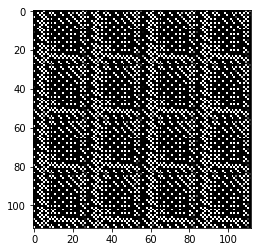

Epoch 1/8... Discriminator Loss: 0.3303 ... Generator Loss: 12.9160
Epoch 1/8... Discriminator Loss: 0.3141 ... Generator Loss: 13.0597
Epoch 1/8... Discriminator Loss: 0.3412 ... Generator Loss: 11.5499
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.2750
Epoch 1/8... Discriminator Loss: 0.3466 ... Generator Loss: 12.3678
Epoch 1/8... Discriminator Loss: 0.3628 ... Generator Loss: 13.4083
Epoch 1/8... Discriminator Loss: 0.2762 ... Generator Loss: 12.2913
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 12.0370
Epoch 1/8... Discriminator Loss: 0.2545 ... Generator Loss: 13.0925
Epoch 1/8... Discriminator Loss: 0.3141 ... Generator Loss: 11.7063


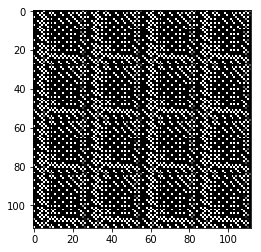

Epoch 1/8... Discriminator Loss: 0.2329 ... Generator Loss: 12.4467
Epoch 1/8... Discriminator Loss: 0.1625 ... Generator Loss: 12.0467
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 11.6978
Epoch 1/8... Discriminator Loss: 0.3141 ... Generator Loss: 12.0931
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 14.4177
Epoch 1/8... Discriminator Loss: 0.3737 ... Generator Loss: 13.0621
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.8957
Epoch 1/8... Discriminator Loss: 0.3249 ... Generator Loss: 11.9035
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 11.9362
Epoch 1/8... Discriminator Loss: 0.2762 ... Generator Loss: 12.4599


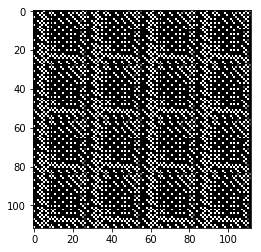

Epoch 1/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.0735
Epoch 1/8... Discriminator Loss: 0.3087 ... Generator Loss: 13.4103
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 12.9214
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 12.7361
Epoch 1/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.1956
Epoch 1/8... Discriminator Loss: 0.3737 ... Generator Loss: 13.9249
Epoch 1/8... Discriminator Loss: 0.2491 ... Generator Loss: 12.3278
Epoch 1/8... Discriminator Loss: 0.2437 ... Generator Loss: 13.9225
Epoch 1/8... Discriminator Loss: 0.3249 ... Generator Loss: 13.2123
Epoch 1/8... Discriminator Loss: 0.2112 ... Generator Loss: 12.6107


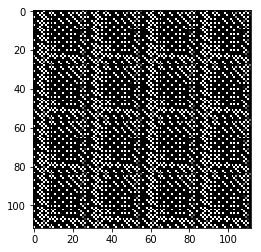

Epoch 1/8... Discriminator Loss: 0.3357 ... Generator Loss: 12.9812
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 13.5350
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.5049
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 13.8729
Epoch 1/8... Discriminator Loss: 0.2816 ... Generator Loss: 13.7045
Epoch 1/8... Discriminator Loss: 0.2653 ... Generator Loss: 13.5882
Epoch 1/8... Discriminator Loss: 0.2599 ... Generator Loss: 13.1367
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.8605
Epoch 1/8... Discriminator Loss: 0.3033 ... Generator Loss: 12.4543
Epoch 1/8... Discriminator Loss: 0.2274 ... Generator Loss: 13.2232


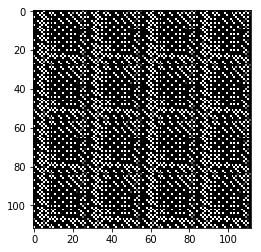

Epoch 1/8... Discriminator Loss: 0.3303 ... Generator Loss: 12.9762
Epoch 1/8... Discriminator Loss: 0.2653 ... Generator Loss: 13.1288
Epoch 1/8... Discriminator Loss: 0.2924 ... Generator Loss: 12.5723


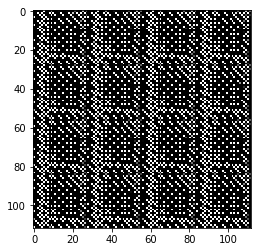

Epoch 2/8... Discriminator Loss: 0.1950 ... Generator Loss: 13.1999
Epoch 2/8... Discriminator Loss: 0.2112 ... Generator Loss: 13.5867
Epoch 2/8... Discriminator Loss: 0.2924 ... Generator Loss: 13.3990
Epoch 2/8... Discriminator Loss: 0.2545 ... Generator Loss: 13.3989
Epoch 2/8... Discriminator Loss: 0.2924 ... Generator Loss: 13.0058
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.9969
Epoch 2/8... Discriminator Loss: 0.3628 ... Generator Loss: 12.9057


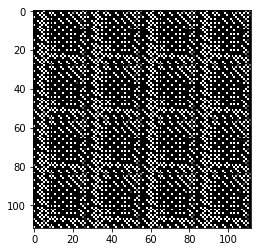

Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.7231
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 12.5337
Epoch 2/8... Discriminator Loss: 0.2545 ... Generator Loss: 14.1785
Epoch 2/8... Discriminator Loss: 0.3357 ... Generator Loss: 13.7706
Epoch 2/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.1261
Epoch 2/8... Discriminator Loss: 0.3195 ... Generator Loss: 13.2657
Epoch 2/8... Discriminator Loss: 0.3195 ... Generator Loss: 13.2139
Epoch 2/8... Discriminator Loss: 0.2437 ... Generator Loss: 13.3745
Epoch 2/8... Discriminator Loss: 0.2599 ... Generator Loss: 13.9469
Epoch 2/8... Discriminator Loss: 0.2329 ... Generator Loss: 13.4025


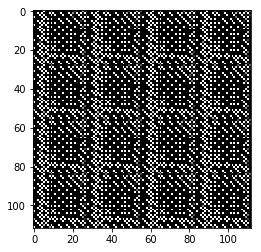

Epoch 2/8... Discriminator Loss: 0.2924 ... Generator Loss: 11.5414
Epoch 2/8... Discriminator Loss: 0.2383 ... Generator Loss: 12.6139
Epoch 2/8... Discriminator Loss: 0.2112 ... Generator Loss: 13.4107
Epoch 2/8... Discriminator Loss: 0.3195 ... Generator Loss: 13.9209
Epoch 2/8... Discriminator Loss: 0.2220 ... Generator Loss: 13.3807
Epoch 2/8... Discriminator Loss: 0.1950 ... Generator Loss: 13.8393
Epoch 2/8... Discriminator Loss: 0.2762 ... Generator Loss: 14.1228
Epoch 2/8... Discriminator Loss: 0.3087 ... Generator Loss: 13.2463
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.4829
Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 13.6476


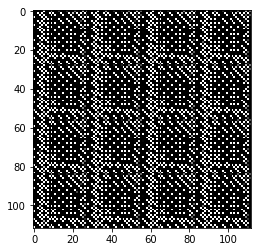

Epoch 2/8... Discriminator Loss: 0.2979 ... Generator Loss: 13.7966
Epoch 2/8... Discriminator Loss: 0.2816 ... Generator Loss: 13.8846
Epoch 2/8... Discriminator Loss: 0.3899 ... Generator Loss: 13.4248
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.5845
Epoch 2/8... Discriminator Loss: 0.3466 ... Generator Loss: 13.3228
Epoch 2/8... Discriminator Loss: 0.2653 ... Generator Loss: 13.3092
Epoch 2/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.9441
Epoch 2/8... Discriminator Loss: 0.2329 ... Generator Loss: 13.9205
Epoch 2/8... Discriminator Loss: 0.2816 ... Generator Loss: 14.1736
Epoch 2/8... Discriminator Loss: 0.3953 ... Generator Loss: 14.5912


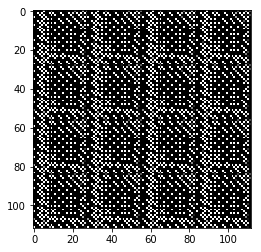

Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.4148
Epoch 2/8... Discriminator Loss: 0.3628 ... Generator Loss: 13.6614
Epoch 2/8... Discriminator Loss: 0.3087 ... Generator Loss: 14.4838
Epoch 2/8... Discriminator Loss: 0.2653 ... Generator Loss: 14.1898
Epoch 2/8... Discriminator Loss: 0.2978 ... Generator Loss: 13.9814
Epoch 2/8... Discriminator Loss: 0.2762 ... Generator Loss: 13.9692
Epoch 2/8... Discriminator Loss: 0.3087 ... Generator Loss: 15.1589
Epoch 2/8... Discriminator Loss: 0.2329 ... Generator Loss: 14.3872
Epoch 2/8... Discriminator Loss: 0.3520 ... Generator Loss: 13.8466
Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 14.1391


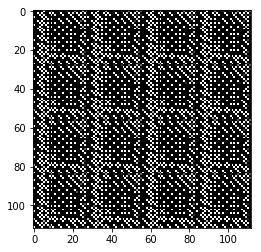

Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 15.3479
Epoch 2/8... Discriminator Loss: 0.2491 ... Generator Loss: 14.2603
Epoch 2/8... Discriminator Loss: 0.2870 ... Generator Loss: 13.8705
Epoch 2/8... Discriminator Loss: 0.2708 ... Generator Loss: 14.2501
Epoch 2/8... Discriminator Loss: 0.8437 ... Generator Loss: 8.9909
Epoch 2/8... Discriminator Loss: 6.7180 ... Generator Loss: 4.8022
Epoch 2/8... Discriminator Loss: 1.6522 ... Generator Loss: 3.4777
Epoch 2/8... Discriminator Loss: 3.0685 ... Generator Loss: 8.0399
Epoch 2/8... Discriminator Loss: 1.1653 ... Generator Loss: 6.7333
Epoch 2/8... Discriminator Loss: 4.9251 ... Generator Loss: 0.1600


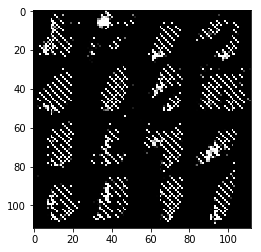

Epoch 2/8... Discriminator Loss: 4.3289 ... Generator Loss: 0.3246
Epoch 2/8... Discriminator Loss: 2.7181 ... Generator Loss: 0.4903
Epoch 2/8... Discriminator Loss: 0.8537 ... Generator Loss: 2.0164
Epoch 2/8... Discriminator Loss: 2.3483 ... Generator Loss: 0.7902
Epoch 2/8... Discriminator Loss: 1.5699 ... Generator Loss: 2.7455
Epoch 2/8... Discriminator Loss: 1.0479 ... Generator Loss: 2.3510
Epoch 2/8... Discriminator Loss: 1.1465 ... Generator Loss: 1.5072
Epoch 2/8... Discriminator Loss: 1.9529 ... Generator Loss: 2.7006
Epoch 2/8... Discriminator Loss: 1.5745 ... Generator Loss: 2.1448
Epoch 2/8... Discriminator Loss: 1.4338 ... Generator Loss: 2.5656


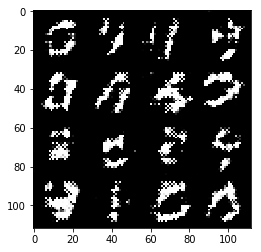

Epoch 2/8... Discriminator Loss: 1.3557 ... Generator Loss: 0.6377
Epoch 2/8... Discriminator Loss: 2.0476 ... Generator Loss: 0.2926
Epoch 2/8... Discriminator Loss: 1.1923 ... Generator Loss: 3.2373
Epoch 2/8... Discriminator Loss: 1.2859 ... Generator Loss: 2.3991
Epoch 2/8... Discriminator Loss: 0.8092 ... Generator Loss: 2.2033
Epoch 2/8... Discriminator Loss: 0.9596 ... Generator Loss: 0.9964
Epoch 2/8... Discriminator Loss: 1.5404 ... Generator Loss: 3.2458
Epoch 2/8... Discriminator Loss: 0.9862 ... Generator Loss: 0.7039
Epoch 2/8... Discriminator Loss: 1.0269 ... Generator Loss: 3.0147
Epoch 2/8... Discriminator Loss: 0.6754 ... Generator Loss: 1.6456


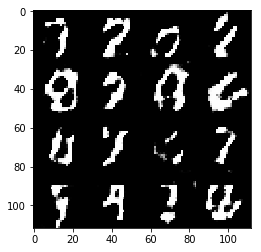

Epoch 2/8... Discriminator Loss: 0.6432 ... Generator Loss: 2.0462
Epoch 2/8... Discriminator Loss: 0.8126 ... Generator Loss: 1.5656
Epoch 2/8... Discriminator Loss: 1.0514 ... Generator Loss: 2.1291
Epoch 2/8... Discriminator Loss: 1.8639 ... Generator Loss: 0.3519
Epoch 2/8... Discriminator Loss: 1.1556 ... Generator Loss: 0.7275
Epoch 2/8... Discriminator Loss: 1.0439 ... Generator Loss: 0.8080
Epoch 2/8... Discriminator Loss: 0.8541 ... Generator Loss: 1.2552
Epoch 2/8... Discriminator Loss: 0.8307 ... Generator Loss: 2.0217
Epoch 2/8... Discriminator Loss: 2.6424 ... Generator Loss: 5.7774
Epoch 2/8... Discriminator Loss: 0.9961 ... Generator Loss: 2.9433


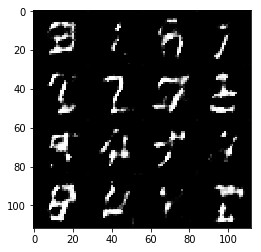

Epoch 2/8... Discriminator Loss: 1.6119 ... Generator Loss: 0.3830
Epoch 2/8... Discriminator Loss: 1.0548 ... Generator Loss: 1.1235
Epoch 2/8... Discriminator Loss: 1.3877 ... Generator Loss: 0.7242
Epoch 2/8... Discriminator Loss: 1.4698 ... Generator Loss: 1.2524
Epoch 2/8... Discriminator Loss: 1.9909 ... Generator Loss: 3.3520
Epoch 2/8... Discriminator Loss: 1.1826 ... Generator Loss: 1.1427
Epoch 2/8... Discriminator Loss: 1.8862 ... Generator Loss: 0.3482


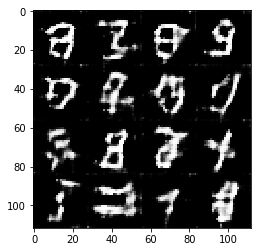

Epoch 3/8... Discriminator Loss: 1.2638 ... Generator Loss: 0.5828
Epoch 3/8... Discriminator Loss: 1.0309 ... Generator Loss: 1.1827
Epoch 3/8... Discriminator Loss: 1.0893 ... Generator Loss: 0.7385


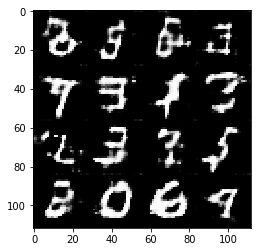

Epoch 3/8... Discriminator Loss: 1.3623 ... Generator Loss: 0.6632
Epoch 3/8... Discriminator Loss: 1.3332 ... Generator Loss: 2.2498
Epoch 3/8... Discriminator Loss: 1.2169 ... Generator Loss: 1.0028
Epoch 3/8... Discriminator Loss: 0.8800 ... Generator Loss: 1.4935
Epoch 3/8... Discriminator Loss: 1.7953 ... Generator Loss: 0.2698
Epoch 3/8... Discriminator Loss: 1.1366 ... Generator Loss: 2.1972
Epoch 3/8... Discriminator Loss: 1.3834 ... Generator Loss: 1.0950
Epoch 3/8... Discriminator Loss: 1.1728 ... Generator Loss: 1.9867
Epoch 3/8... Discriminator Loss: 1.4132 ... Generator Loss: 0.5865
Epoch 3/8... Discriminator Loss: 1.0960 ... Generator Loss: 0.9347


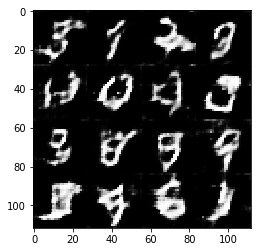

Epoch 3/8... Discriminator Loss: 1.2711 ... Generator Loss: 0.7018
Epoch 3/8... Discriminator Loss: 1.4968 ... Generator Loss: 0.4492
Epoch 3/8... Discriminator Loss: 0.9875 ... Generator Loss: 0.8992
Epoch 3/8... Discriminator Loss: 1.4193 ... Generator Loss: 0.6299
Epoch 3/8... Discriminator Loss: 0.9932 ... Generator Loss: 1.4505
Epoch 3/8... Discriminator Loss: 1.6083 ... Generator Loss: 2.5270
Epoch 3/8... Discriminator Loss: 1.3926 ... Generator Loss: 1.3211
Epoch 3/8... Discriminator Loss: 1.2242 ... Generator Loss: 1.1251
Epoch 3/8... Discriminator Loss: 1.4401 ... Generator Loss: 1.4510
Epoch 3/8... Discriminator Loss: 1.3217 ... Generator Loss: 1.3401


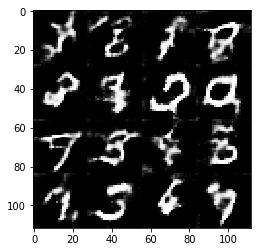

Epoch 3/8... Discriminator Loss: 1.1221 ... Generator Loss: 1.0619
Epoch 3/8... Discriminator Loss: 1.5637 ... Generator Loss: 2.1123
Epoch 3/8... Discriminator Loss: 1.0615 ... Generator Loss: 1.3937
Epoch 3/8... Discriminator Loss: 1.2022 ... Generator Loss: 1.0962
Epoch 3/8... Discriminator Loss: 1.6193 ... Generator Loss: 0.4225
Epoch 3/8... Discriminator Loss: 1.2607 ... Generator Loss: 0.6493
Epoch 3/8... Discriminator Loss: 1.4720 ... Generator Loss: 0.4407
Epoch 3/8... Discriminator Loss: 1.6067 ... Generator Loss: 0.4186
Epoch 3/8... Discriminator Loss: 1.2429 ... Generator Loss: 0.6830
Epoch 3/8... Discriminator Loss: 1.3641 ... Generator Loss: 1.2117


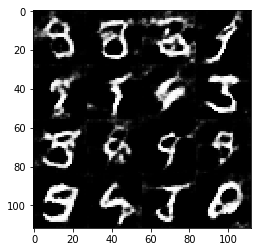

Epoch 3/8... Discriminator Loss: 1.1968 ... Generator Loss: 0.9451
Epoch 3/8... Discriminator Loss: 1.2031 ... Generator Loss: 0.8072
Epoch 3/8... Discriminator Loss: 1.2094 ... Generator Loss: 0.6535
Epoch 3/8... Discriminator Loss: 1.4318 ... Generator Loss: 0.4728
Epoch 3/8... Discriminator Loss: 1.5002 ... Generator Loss: 0.4996
Epoch 3/8... Discriminator Loss: 1.1992 ... Generator Loss: 0.7689
Epoch 3/8... Discriminator Loss: 1.2023 ... Generator Loss: 0.6674
Epoch 3/8... Discriminator Loss: 1.0767 ... Generator Loss: 0.7800
Epoch 3/8... Discriminator Loss: 1.2629 ... Generator Loss: 0.5621
Epoch 3/8... Discriminator Loss: 1.2941 ... Generator Loss: 0.5534


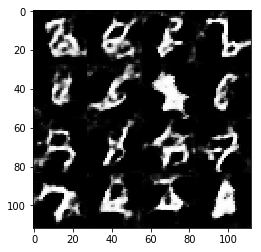

Epoch 3/8... Discriminator Loss: 1.2037 ... Generator Loss: 0.7420
Epoch 3/8... Discriminator Loss: 1.7432 ... Generator Loss: 1.6308
Epoch 3/8... Discriminator Loss: 1.1688 ... Generator Loss: 1.0832
Epoch 3/8... Discriminator Loss: 1.3772 ... Generator Loss: 1.3329
Epoch 3/8... Discriminator Loss: 1.2572 ... Generator Loss: 1.1298
Epoch 3/8... Discriminator Loss: 1.3350 ... Generator Loss: 1.1756
Epoch 3/8... Discriminator Loss: 1.5600 ... Generator Loss: 0.4948
Epoch 3/8... Discriminator Loss: 1.4868 ... Generator Loss: 0.4264
Epoch 3/8... Discriminator Loss: 1.2200 ... Generator Loss: 1.1828
Epoch 3/8... Discriminator Loss: 1.4983 ... Generator Loss: 1.6398


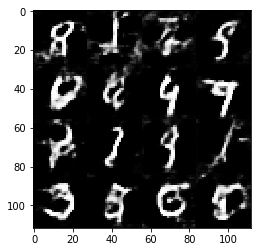

Epoch 3/8... Discriminator Loss: 1.2262 ... Generator Loss: 0.6312
Epoch 3/8... Discriminator Loss: 1.3871 ... Generator Loss: 0.6353
Epoch 3/8... Discriminator Loss: 1.3686 ... Generator Loss: 0.7660
Epoch 3/8... Discriminator Loss: 1.5965 ... Generator Loss: 0.4384
Epoch 3/8... Discriminator Loss: 1.1415 ... Generator Loss: 0.6406
Epoch 3/8... Discriminator Loss: 1.2297 ... Generator Loss: 1.3986
Epoch 3/8... Discriminator Loss: 1.2303 ... Generator Loss: 0.8492
Epoch 3/8... Discriminator Loss: 1.4626 ... Generator Loss: 1.4197
Epoch 3/8... Discriminator Loss: 1.1549 ... Generator Loss: 1.0583
Epoch 3/8... Discriminator Loss: 1.4435 ... Generator Loss: 0.5436


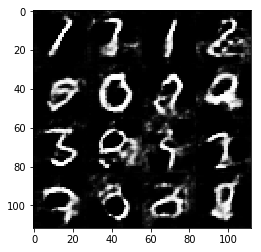

Epoch 3/8... Discriminator Loss: 1.0490 ... Generator Loss: 0.8835
Epoch 3/8... Discriminator Loss: 1.6726 ... Generator Loss: 0.4219
Epoch 3/8... Discriminator Loss: 1.1332 ... Generator Loss: 0.8968
Epoch 3/8... Discriminator Loss: 1.0853 ... Generator Loss: 0.9581
Epoch 3/8... Discriminator Loss: 1.4288 ... Generator Loss: 1.4531
Epoch 3/8... Discriminator Loss: 1.1781 ... Generator Loss: 0.7800
Epoch 3/8... Discriminator Loss: 1.4823 ... Generator Loss: 0.5365
Epoch 3/8... Discriminator Loss: 1.2636 ... Generator Loss: 0.6752
Epoch 3/8... Discriminator Loss: 1.4050 ... Generator Loss: 0.4746
Epoch 3/8... Discriminator Loss: 1.2524 ... Generator Loss: 0.7320


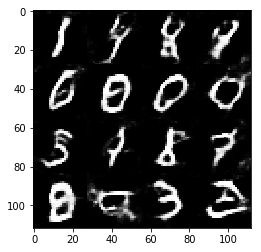

Epoch 3/8... Discriminator Loss: 1.1485 ... Generator Loss: 1.2375
Epoch 3/8... Discriminator Loss: 1.2498 ... Generator Loss: 0.7904
Epoch 3/8... Discriminator Loss: 1.3962 ... Generator Loss: 1.3850
Epoch 3/8... Discriminator Loss: 1.2044 ... Generator Loss: 1.3357
Epoch 3/8... Discriminator Loss: 1.1890 ... Generator Loss: 0.8649
Epoch 3/8... Discriminator Loss: 1.2089 ... Generator Loss: 1.2949
Epoch 3/8... Discriminator Loss: 1.2627 ... Generator Loss: 1.3628
Epoch 3/8... Discriminator Loss: 1.3689 ... Generator Loss: 1.3305
Epoch 3/8... Discriminator Loss: 1.4270 ... Generator Loss: 1.1670
Epoch 3/8... Discriminator Loss: 1.3768 ... Generator Loss: 1.4842


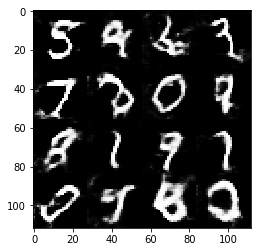

Epoch 3/8... Discriminator Loss: 1.4154 ... Generator Loss: 0.5475
Epoch 3/8... Discriminator Loss: 1.2023 ... Generator Loss: 0.9994
Epoch 3/8... Discriminator Loss: 1.3118 ... Generator Loss: 0.9460
Epoch 3/8... Discriminator Loss: 1.5460 ... Generator Loss: 0.4687
Epoch 3/8... Discriminator Loss: 1.3549 ... Generator Loss: 0.5939
Epoch 3/8... Discriminator Loss: 1.4410 ... Generator Loss: 0.5030
Epoch 3/8... Discriminator Loss: 1.2817 ... Generator Loss: 0.6252
Epoch 3/8... Discriminator Loss: 1.3011 ... Generator Loss: 0.6183
Epoch 3/8... Discriminator Loss: 1.2899 ... Generator Loss: 1.0178
Epoch 3/8... Discriminator Loss: 1.2730 ... Generator Loss: 1.1734


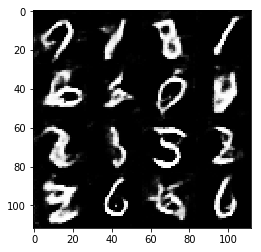

Epoch 3/8... Discriminator Loss: 1.3119 ... Generator Loss: 1.4820


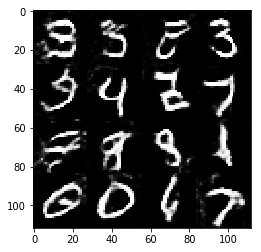

Epoch 4/8... Discriminator Loss: 1.1502 ... Generator Loss: 1.1412
Epoch 4/8... Discriminator Loss: 1.6890 ... Generator Loss: 1.7135
Epoch 4/8... Discriminator Loss: 1.1722 ... Generator Loss: 0.8038
Epoch 4/8... Discriminator Loss: 1.1398 ... Generator Loss: 0.8527
Epoch 4/8... Discriminator Loss: 1.0424 ... Generator Loss: 1.4969
Epoch 4/8... Discriminator Loss: 1.3395 ... Generator Loss: 1.5973
Epoch 4/8... Discriminator Loss: 1.1601 ... Generator Loss: 1.1112
Epoch 4/8... Discriminator Loss: 1.1726 ... Generator Loss: 0.9189
Epoch 4/8... Discriminator Loss: 1.2678 ... Generator Loss: 1.3075


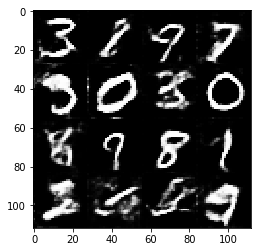

Epoch 4/8... Discriminator Loss: 1.2589 ... Generator Loss: 1.2765
Epoch 4/8... Discriminator Loss: 1.3131 ... Generator Loss: 1.2409
Epoch 4/8... Discriminator Loss: 1.2779 ... Generator Loss: 1.1343
Epoch 4/8... Discriminator Loss: 1.1784 ... Generator Loss: 0.8966
Epoch 4/8... Discriminator Loss: 1.5442 ... Generator Loss: 0.3894
Epoch 4/8... Discriminator Loss: 1.2190 ... Generator Loss: 0.7859
Epoch 4/8... Discriminator Loss: 1.1258 ... Generator Loss: 1.1811
Epoch 4/8... Discriminator Loss: 1.1186 ... Generator Loss: 1.1446
Epoch 4/8... Discriminator Loss: 1.2267 ... Generator Loss: 0.9627
Epoch 4/8... Discriminator Loss: 1.2186 ... Generator Loss: 1.0568


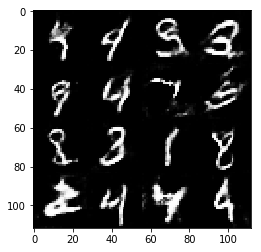

Epoch 4/8... Discriminator Loss: 1.3553 ... Generator Loss: 1.2469
Epoch 4/8... Discriminator Loss: 1.5264 ... Generator Loss: 0.4285
Epoch 4/8... Discriminator Loss: 1.2801 ... Generator Loss: 0.5876
Epoch 4/8... Discriminator Loss: 1.2404 ... Generator Loss: 0.6293
Epoch 4/8... Discriminator Loss: 1.4480 ... Generator Loss: 0.4891
Epoch 4/8... Discriminator Loss: 1.2152 ... Generator Loss: 0.7155
Epoch 4/8... Discriminator Loss: 1.8117 ... Generator Loss: 1.5099
Epoch 4/8... Discriminator Loss: 1.1986 ... Generator Loss: 1.0275
Epoch 4/8... Discriminator Loss: 1.1745 ... Generator Loss: 0.8079
Epoch 4/8... Discriminator Loss: 1.2518 ... Generator Loss: 0.7951


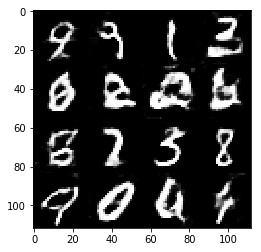

Epoch 4/8... Discriminator Loss: 1.2296 ... Generator Loss: 0.9791
Epoch 4/8... Discriminator Loss: 1.2033 ... Generator Loss: 0.9078
Epoch 4/8... Discriminator Loss: 1.5682 ... Generator Loss: 0.4124
Epoch 4/8... Discriminator Loss: 1.3757 ... Generator Loss: 0.6761
Epoch 4/8... Discriminator Loss: 1.1630 ... Generator Loss: 0.7704
Epoch 4/8... Discriminator Loss: 1.0764 ... Generator Loss: 0.9174
Epoch 4/8... Discriminator Loss: 1.2560 ... Generator Loss: 1.2118
Epoch 4/8... Discriminator Loss: 1.2388 ... Generator Loss: 1.2725
Epoch 4/8... Discriminator Loss: 1.5281 ... Generator Loss: 0.4831
Epoch 4/8... Discriminator Loss: 1.3716 ... Generator Loss: 0.5047


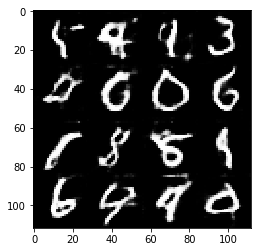

Epoch 4/8... Discriminator Loss: 1.1169 ... Generator Loss: 0.8271
Epoch 4/8... Discriminator Loss: 1.7122 ... Generator Loss: 0.4142
Epoch 4/8... Discriminator Loss: 1.2890 ... Generator Loss: 0.6289
Epoch 4/8... Discriminator Loss: 1.5166 ... Generator Loss: 0.4414
Epoch 4/8... Discriminator Loss: 1.1425 ... Generator Loss: 1.0012
Epoch 4/8... Discriminator Loss: 1.6302 ... Generator Loss: 1.3485
Epoch 4/8... Discriminator Loss: 1.3433 ... Generator Loss: 0.7122
Epoch 4/8... Discriminator Loss: 1.2530 ... Generator Loss: 1.1140
Epoch 4/8... Discriminator Loss: 1.2117 ... Generator Loss: 0.6581
Epoch 4/8... Discriminator Loss: 1.4003 ... Generator Loss: 0.4799


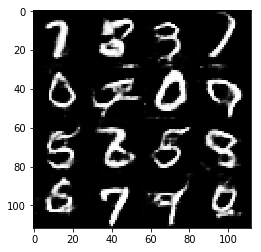

Epoch 4/8... Discriminator Loss: 1.1804 ... Generator Loss: 0.6651
Epoch 4/8... Discriminator Loss: 1.3925 ... Generator Loss: 0.5433
Epoch 4/8... Discriminator Loss: 1.4609 ... Generator Loss: 0.4164
Epoch 4/8... Discriminator Loss: 1.3875 ... Generator Loss: 0.4968
Epoch 4/8... Discriminator Loss: 1.2224 ... Generator Loss: 0.6143
Epoch 4/8... Discriminator Loss: 1.4877 ... Generator Loss: 0.4960
Epoch 4/8... Discriminator Loss: 1.2227 ... Generator Loss: 0.6328
Epoch 4/8... Discriminator Loss: 1.4117 ... Generator Loss: 1.2345
Epoch 4/8... Discriminator Loss: 1.0970 ... Generator Loss: 1.1017
Epoch 4/8... Discriminator Loss: 1.1263 ... Generator Loss: 1.0583


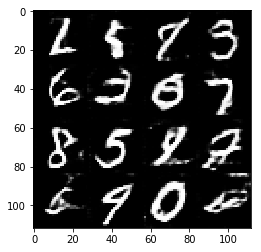

Epoch 4/8... Discriminator Loss: 1.5484 ... Generator Loss: 1.5369
Epoch 4/8... Discriminator Loss: 1.3559 ... Generator Loss: 0.7279
Epoch 4/8... Discriminator Loss: 1.1714 ... Generator Loss: 0.7394
Epoch 4/8... Discriminator Loss: 0.9523 ... Generator Loss: 0.9240
Epoch 4/8... Discriminator Loss: 1.2280 ... Generator Loss: 1.3203
Epoch 4/8... Discriminator Loss: 1.1233 ... Generator Loss: 0.9409
Epoch 4/8... Discriminator Loss: 1.5920 ... Generator Loss: 1.5399
Epoch 4/8... Discriminator Loss: 1.1495 ... Generator Loss: 0.8709
Epoch 4/8... Discriminator Loss: 1.2367 ... Generator Loss: 0.8197
Epoch 4/8... Discriminator Loss: 1.3387 ... Generator Loss: 1.1755


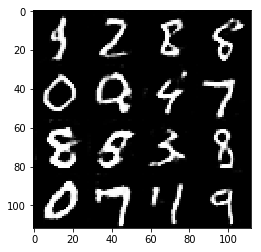

Epoch 4/8... Discriminator Loss: 1.2399 ... Generator Loss: 0.8395
Epoch 4/8... Discriminator Loss: 1.2374 ... Generator Loss: 0.9357
Epoch 4/8... Discriminator Loss: 1.2024 ... Generator Loss: 1.0024
Epoch 4/8... Discriminator Loss: 1.1651 ... Generator Loss: 1.0052
Epoch 4/8... Discriminator Loss: 1.6015 ... Generator Loss: 0.4553
Epoch 4/8... Discriminator Loss: 0.9540 ... Generator Loss: 0.9616
Epoch 4/8... Discriminator Loss: 1.2749 ... Generator Loss: 0.7018
Epoch 4/8... Discriminator Loss: 1.0656 ... Generator Loss: 1.1917
Epoch 4/8... Discriminator Loss: 1.4707 ... Generator Loss: 1.3228
Epoch 4/8... Discriminator Loss: 1.3645 ... Generator Loss: 0.7056


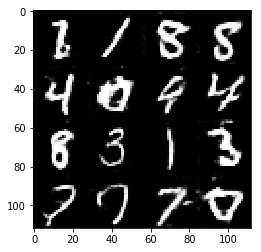

Epoch 4/8... Discriminator Loss: 1.4833 ... Generator Loss: 1.3923
Epoch 4/8... Discriminator Loss: 1.3026 ... Generator Loss: 1.0715
Epoch 4/8... Discriminator Loss: 1.1922 ... Generator Loss: 1.0278
Epoch 4/8... Discriminator Loss: 1.2737 ... Generator Loss: 0.6425
Epoch 4/8... Discriminator Loss: 1.4995 ... Generator Loss: 1.3019
Epoch 4/8... Discriminator Loss: 1.2748 ... Generator Loss: 0.5541
Epoch 4/8... Discriminator Loss: 1.1583 ... Generator Loss: 0.7666
Epoch 4/8... Discriminator Loss: 1.3215 ... Generator Loss: 1.0187
Epoch 4/8... Discriminator Loss: 1.1048 ... Generator Loss: 1.5078
Epoch 4/8... Discriminator Loss: 1.2308 ... Generator Loss: 0.7051


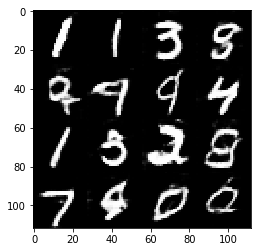

Epoch 4/8... Discriminator Loss: 1.2462 ... Generator Loss: 0.5815
Epoch 4/8... Discriminator Loss: 1.1238 ... Generator Loss: 0.8513
Epoch 4/8... Discriminator Loss: 1.2064 ... Generator Loss: 0.8281
Epoch 4/8... Discriminator Loss: 1.3806 ... Generator Loss: 0.4647


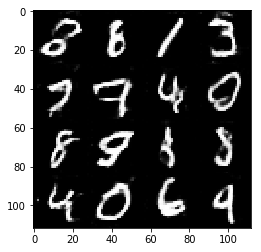

Epoch 5/8... Discriminator Loss: 1.4366 ... Generator Loss: 0.5231
Epoch 5/8... Discriminator Loss: 1.2712 ... Generator Loss: 0.5816
Epoch 5/8... Discriminator Loss: 1.2953 ... Generator Loss: 0.6747
Epoch 5/8... Discriminator Loss: 1.1751 ... Generator Loss: 0.7003
Epoch 5/8... Discriminator Loss: 1.2152 ... Generator Loss: 0.8204
Epoch 5/8... Discriminator Loss: 1.0484 ... Generator Loss: 1.1661


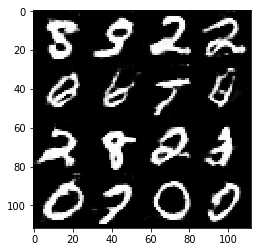

Epoch 5/8... Discriminator Loss: 1.2217 ... Generator Loss: 1.1179
Epoch 5/8... Discriminator Loss: 1.2621 ... Generator Loss: 1.0731
Epoch 5/8... Discriminator Loss: 1.1186 ... Generator Loss: 0.7041
Epoch 5/8... Discriminator Loss: 1.2781 ... Generator Loss: 1.0713
Epoch 5/8... Discriminator Loss: 1.2102 ... Generator Loss: 1.0608
Epoch 5/8... Discriminator Loss: 1.3048 ... Generator Loss: 1.0381
Epoch 5/8... Discriminator Loss: 1.3406 ... Generator Loss: 1.2594
Epoch 5/8... Discriminator Loss: 1.2010 ... Generator Loss: 0.8983
Epoch 5/8... Discriminator Loss: 1.3863 ... Generator Loss: 1.2871
Epoch 5/8... Discriminator Loss: 1.2460 ... Generator Loss: 0.6057


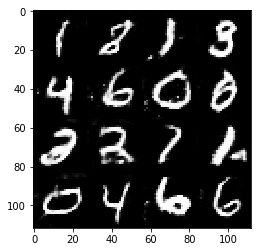

Epoch 5/8... Discriminator Loss: 1.6897 ... Generator Loss: 0.3959
Epoch 5/8... Discriminator Loss: 1.3444 ... Generator Loss: 0.5513
Epoch 5/8... Discriminator Loss: 1.1872 ... Generator Loss: 0.7573
Epoch 5/8... Discriminator Loss: 1.1697 ... Generator Loss: 1.0274
Epoch 5/8... Discriminator Loss: 1.1872 ... Generator Loss: 0.7207
Epoch 5/8... Discriminator Loss: 1.2666 ... Generator Loss: 0.7561
Epoch 5/8... Discriminator Loss: 1.2239 ... Generator Loss: 0.6633
Epoch 5/8... Discriminator Loss: 0.9432 ... Generator Loss: 1.0411
Epoch 5/8... Discriminator Loss: 1.1731 ... Generator Loss: 0.7605
Epoch 5/8... Discriminator Loss: 1.6116 ... Generator Loss: 0.4135


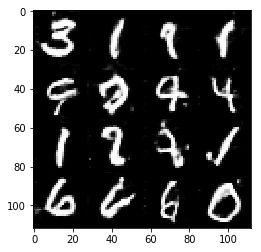

Epoch 5/8... Discriminator Loss: 1.1892 ... Generator Loss: 0.9080
Epoch 5/8... Discriminator Loss: 1.1965 ... Generator Loss: 1.1118
Epoch 5/8... Discriminator Loss: 1.2122 ... Generator Loss: 0.9004
Epoch 5/8... Discriminator Loss: 1.2014 ... Generator Loss: 1.2500
Epoch 5/8... Discriminator Loss: 1.3130 ... Generator Loss: 0.6711
Epoch 5/8... Discriminator Loss: 1.3780 ... Generator Loss: 0.5823
Epoch 5/8... Discriminator Loss: 1.5340 ... Generator Loss: 0.4460
Epoch 5/8... Discriminator Loss: 1.2795 ... Generator Loss: 0.5216
Epoch 5/8... Discriminator Loss: 1.1894 ... Generator Loss: 0.6220
Epoch 5/8... Discriminator Loss: 1.4406 ... Generator Loss: 0.6172


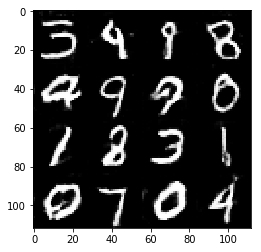

Epoch 5/8... Discriminator Loss: 0.9947 ... Generator Loss: 0.8451
Epoch 5/8... Discriminator Loss: 1.2082 ... Generator Loss: 0.6331
Epoch 5/8... Discriminator Loss: 1.1714 ... Generator Loss: 0.7217
Epoch 5/8... Discriminator Loss: 1.3236 ... Generator Loss: 0.5446
Epoch 5/8... Discriminator Loss: 1.4838 ... Generator Loss: 0.4700
Epoch 5/8... Discriminator Loss: 1.2756 ... Generator Loss: 0.7394
Epoch 5/8... Discriminator Loss: 1.2819 ... Generator Loss: 0.7691
Epoch 5/8... Discriminator Loss: 1.2363 ... Generator Loss: 0.5342
Epoch 5/8... Discriminator Loss: 1.3361 ... Generator Loss: 0.5604
Epoch 5/8... Discriminator Loss: 1.4377 ... Generator Loss: 0.5246


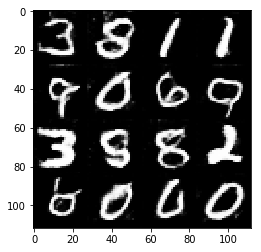

Epoch 5/8... Discriminator Loss: 1.2511 ... Generator Loss: 0.6819
Epoch 5/8... Discriminator Loss: 1.2564 ... Generator Loss: 0.8868
Epoch 5/8... Discriminator Loss: 1.2751 ... Generator Loss: 0.5477
Epoch 5/8... Discriminator Loss: 1.2159 ... Generator Loss: 0.6743
Epoch 5/8... Discriminator Loss: 1.1756 ... Generator Loss: 1.1426
Epoch 5/8... Discriminator Loss: 1.3544 ... Generator Loss: 0.9907
Epoch 5/8... Discriminator Loss: 1.3027 ... Generator Loss: 1.1051
Epoch 5/8... Discriminator Loss: 1.1042 ... Generator Loss: 0.9949
Epoch 5/8... Discriminator Loss: 1.2507 ... Generator Loss: 0.8332
Epoch 5/8... Discriminator Loss: 1.1941 ... Generator Loss: 0.6055


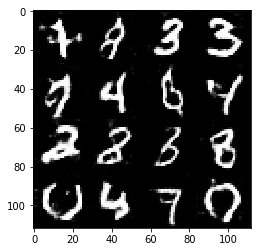

Epoch 5/8... Discriminator Loss: 1.3736 ... Generator Loss: 1.4771
Epoch 5/8... Discriminator Loss: 1.2615 ... Generator Loss: 0.8940
Epoch 5/8... Discriminator Loss: 1.3923 ... Generator Loss: 1.2816
Epoch 5/8... Discriminator Loss: 1.2797 ... Generator Loss: 0.9811
Epoch 5/8... Discriminator Loss: 1.2925 ... Generator Loss: 1.2546
Epoch 5/8... Discriminator Loss: 1.3814 ... Generator Loss: 1.1272
Epoch 5/8... Discriminator Loss: 1.0931 ... Generator Loss: 0.9525
Epoch 5/8... Discriminator Loss: 1.1834 ... Generator Loss: 0.6291
Epoch 5/8... Discriminator Loss: 1.0533 ... Generator Loss: 0.6691
Epoch 5/8... Discriminator Loss: 1.3634 ... Generator Loss: 0.7547


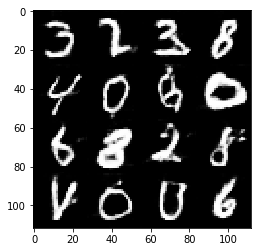

Epoch 5/8... Discriminator Loss: 1.2918 ... Generator Loss: 0.9005
Epoch 5/8... Discriminator Loss: 1.3764 ... Generator Loss: 1.0091
Epoch 5/8... Discriminator Loss: 1.1196 ... Generator Loss: 1.0220
Epoch 5/8... Discriminator Loss: 1.5902 ... Generator Loss: 0.4249
Epoch 5/8... Discriminator Loss: 1.4216 ... Generator Loss: 0.9160
Epoch 5/8... Discriminator Loss: 1.2168 ... Generator Loss: 0.8788
Epoch 5/8... Discriminator Loss: 1.1536 ... Generator Loss: 0.9077
Epoch 5/8... Discriminator Loss: 1.1502 ... Generator Loss: 0.9279
Epoch 5/8... Discriminator Loss: 1.2179 ... Generator Loss: 0.6822
Epoch 5/8... Discriminator Loss: 1.7150 ... Generator Loss: 0.3771


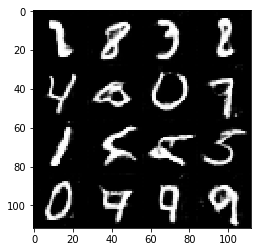

Epoch 5/8... Discriminator Loss: 1.4029 ... Generator Loss: 0.5623
Epoch 5/8... Discriminator Loss: 1.2607 ... Generator Loss: 1.1892
Epoch 5/8... Discriminator Loss: 1.3101 ... Generator Loss: 0.7929
Epoch 5/8... Discriminator Loss: 1.5726 ... Generator Loss: 0.4310
Epoch 5/8... Discriminator Loss: 1.4243 ... Generator Loss: 0.5282
Epoch 5/8... Discriminator Loss: 1.0969 ... Generator Loss: 0.7990
Epoch 5/8... Discriminator Loss: 1.5828 ... Generator Loss: 0.4334
Epoch 5/8... Discriminator Loss: 1.1897 ... Generator Loss: 0.9897
Epoch 5/8... Discriminator Loss: 1.1340 ... Generator Loss: 0.6872
Epoch 5/8... Discriminator Loss: 1.0558 ... Generator Loss: 0.7988


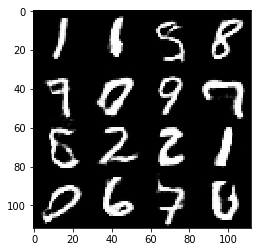

Epoch 5/8... Discriminator Loss: 1.2493 ... Generator Loss: 0.6968
Epoch 5/8... Discriminator Loss: 1.1565 ... Generator Loss: 0.6860
Epoch 5/8... Discriminator Loss: 1.4733 ... Generator Loss: 0.4512
Epoch 5/8... Discriminator Loss: 1.3229 ... Generator Loss: 0.6271
Epoch 5/8... Discriminator Loss: 1.2235 ... Generator Loss: 1.1783
Epoch 5/8... Discriminator Loss: 1.3280 ... Generator Loss: 1.2800
Epoch 5/8... Discriminator Loss: 1.2012 ... Generator Loss: 0.6470
Epoch 5/8... Discriminator Loss: 1.2005 ... Generator Loss: 0.6636


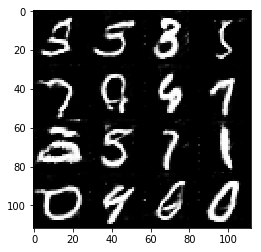

Epoch 6/8... Discriminator Loss: 1.2385 ... Generator Loss: 0.7124
Epoch 6/8... Discriminator Loss: 1.2681 ... Generator Loss: 1.0211


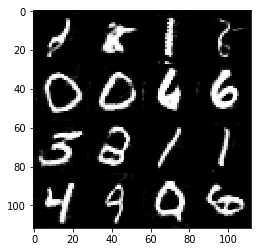

Epoch 6/8... Discriminator Loss: 1.1466 ... Generator Loss: 1.2886
Epoch 6/8... Discriminator Loss: 1.0143 ... Generator Loss: 0.9447
Epoch 6/8... Discriminator Loss: 1.3547 ... Generator Loss: 0.6447
Epoch 6/8... Discriminator Loss: 1.2368 ... Generator Loss: 0.5822
Epoch 6/8... Discriminator Loss: 1.6599 ... Generator Loss: 0.3537
Epoch 6/8... Discriminator Loss: 1.2975 ... Generator Loss: 0.6310
Epoch 6/8... Discriminator Loss: 1.3787 ... Generator Loss: 0.4811
Epoch 6/8... Discriminator Loss: 1.0802 ... Generator Loss: 0.9129
Epoch 6/8... Discriminator Loss: 0.9820 ... Generator Loss: 1.4230
Epoch 6/8... Discriminator Loss: 1.3880 ... Generator Loss: 0.4853


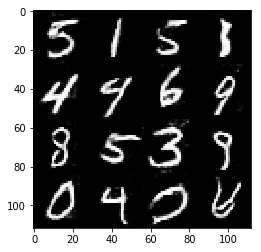

Epoch 6/8... Discriminator Loss: 1.2332 ... Generator Loss: 1.2184
Epoch 6/8... Discriminator Loss: 1.2247 ... Generator Loss: 1.1610
Epoch 6/8... Discriminator Loss: 1.1277 ... Generator Loss: 0.6920
Epoch 6/8... Discriminator Loss: 1.6131 ... Generator Loss: 0.4301
Epoch 6/8... Discriminator Loss: 1.2641 ... Generator Loss: 0.8126
Epoch 6/8... Discriminator Loss: 1.1697 ... Generator Loss: 0.8524
Epoch 6/8... Discriminator Loss: 1.0872 ... Generator Loss: 0.8573
Epoch 6/8... Discriminator Loss: 1.0318 ... Generator Loss: 0.9069
Epoch 6/8... Discriminator Loss: 1.5205 ... Generator Loss: 0.4045
Epoch 6/8... Discriminator Loss: 1.1377 ... Generator Loss: 0.7174


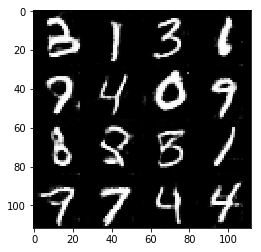

Epoch 6/8... Discriminator Loss: 1.1165 ... Generator Loss: 0.9112
Epoch 6/8... Discriminator Loss: 1.3986 ... Generator Loss: 1.3395
Epoch 6/8... Discriminator Loss: 1.4551 ... Generator Loss: 0.5093
Epoch 6/8... Discriminator Loss: 1.3105 ... Generator Loss: 0.7403
Epoch 6/8... Discriminator Loss: 1.1877 ... Generator Loss: 0.6586
Epoch 6/8... Discriminator Loss: 1.1912 ... Generator Loss: 0.6460
Epoch 6/8... Discriminator Loss: 1.0860 ... Generator Loss: 0.9499
Epoch 6/8... Discriminator Loss: 1.3384 ... Generator Loss: 1.3845
Epoch 6/8... Discriminator Loss: 1.1494 ... Generator Loss: 0.6701
Epoch 6/8... Discriminator Loss: 1.2713 ... Generator Loss: 0.5612


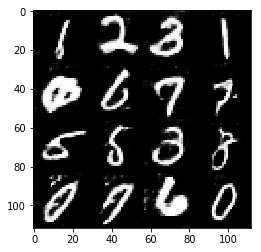

Epoch 6/8... Discriminator Loss: 1.3979 ... Generator Loss: 0.4712
Epoch 6/8... Discriminator Loss: 1.2881 ... Generator Loss: 0.5889
Epoch 6/8... Discriminator Loss: 1.3862 ... Generator Loss: 0.4854
Epoch 6/8... Discriminator Loss: 1.2788 ... Generator Loss: 1.0097
Epoch 6/8... Discriminator Loss: 1.2712 ... Generator Loss: 0.9141
Epoch 6/8... Discriminator Loss: 1.3351 ... Generator Loss: 0.8896
Epoch 6/8... Discriminator Loss: 1.5734 ... Generator Loss: 0.4396
Epoch 6/8... Discriminator Loss: 1.3127 ... Generator Loss: 0.5468
Epoch 6/8... Discriminator Loss: 1.1003 ... Generator Loss: 0.9407
Epoch 6/8... Discriminator Loss: 1.2067 ... Generator Loss: 0.9235


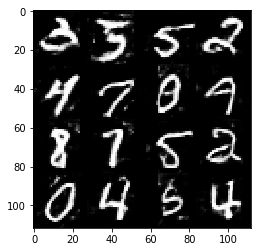

Epoch 6/8... Discriminator Loss: 1.2483 ... Generator Loss: 1.1859
Epoch 6/8... Discriminator Loss: 1.0879 ... Generator Loss: 0.8970
Epoch 6/8... Discriminator Loss: 1.3648 ... Generator Loss: 1.4159
Epoch 6/8... Discriminator Loss: 1.1268 ... Generator Loss: 1.2666
Epoch 6/8... Discriminator Loss: 1.2986 ... Generator Loss: 0.6423
Epoch 6/8... Discriminator Loss: 1.3408 ... Generator Loss: 1.2596
Epoch 6/8... Discriminator Loss: 1.3637 ... Generator Loss: 1.6649
Epoch 6/8... Discriminator Loss: 1.4277 ... Generator Loss: 1.0750
Epoch 6/8... Discriminator Loss: 1.2165 ... Generator Loss: 0.8084
Epoch 6/8... Discriminator Loss: 1.3813 ... Generator Loss: 1.2474


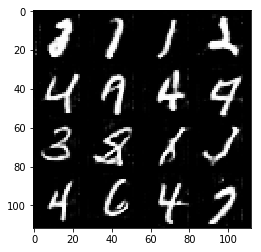

Epoch 6/8... Discriminator Loss: 1.2197 ... Generator Loss: 0.8890
Epoch 6/8... Discriminator Loss: 1.4204 ... Generator Loss: 1.2994
Epoch 6/8... Discriminator Loss: 1.3216 ... Generator Loss: 1.2150
Epoch 6/8... Discriminator Loss: 1.1818 ... Generator Loss: 0.7501
Epoch 6/8... Discriminator Loss: 1.3448 ... Generator Loss: 0.5555
Epoch 6/8... Discriminator Loss: 1.2754 ... Generator Loss: 0.8050
Epoch 6/8... Discriminator Loss: 1.3325 ... Generator Loss: 0.5680
Epoch 6/8... Discriminator Loss: 1.9495 ... Generator Loss: 0.2851
Epoch 6/8... Discriminator Loss: 1.2754 ... Generator Loss: 0.6191
Epoch 6/8... Discriminator Loss: 1.1936 ... Generator Loss: 0.8550


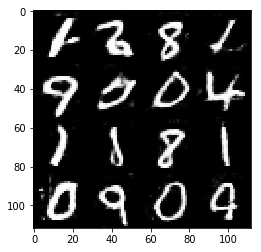

Epoch 6/8... Discriminator Loss: 1.2569 ... Generator Loss: 0.6349
Epoch 6/8... Discriminator Loss: 1.2094 ... Generator Loss: 1.0126
Epoch 6/8... Discriminator Loss: 1.2775 ... Generator Loss: 1.1297
Epoch 6/8... Discriminator Loss: 1.2564 ... Generator Loss: 0.5533
Epoch 6/8... Discriminator Loss: 1.2036 ... Generator Loss: 0.7822
Epoch 6/8... Discriminator Loss: 1.1014 ... Generator Loss: 1.2145
Epoch 6/8... Discriminator Loss: 1.5955 ... Generator Loss: 1.2472
Epoch 6/8... Discriminator Loss: 1.2400 ... Generator Loss: 0.8691
Epoch 6/8... Discriminator Loss: 1.1632 ... Generator Loss: 0.6548
Epoch 6/8... Discriminator Loss: 1.3281 ... Generator Loss: 0.5325


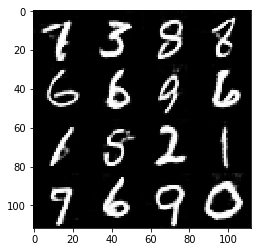

Epoch 6/8... Discriminator Loss: 1.3097 ... Generator Loss: 0.6630
Epoch 6/8... Discriminator Loss: 1.1493 ... Generator Loss: 1.0443
Epoch 6/8... Discriminator Loss: 1.1144 ... Generator Loss: 1.1234
Epoch 6/8... Discriminator Loss: 1.2112 ... Generator Loss: 1.1268
Epoch 6/8... Discriminator Loss: 1.5007 ... Generator Loss: 0.4330
Epoch 6/8... Discriminator Loss: 1.3934 ... Generator Loss: 0.5469
Epoch 6/8... Discriminator Loss: 1.2805 ... Generator Loss: 0.8942
Epoch 6/8... Discriminator Loss: 1.3769 ... Generator Loss: 1.1771
Epoch 6/8... Discriminator Loss: 1.3433 ... Generator Loss: 0.4827
Epoch 6/8... Discriminator Loss: 1.4165 ... Generator Loss: 0.5378


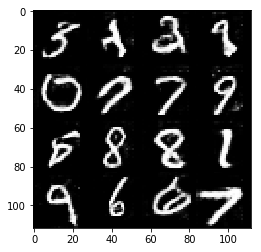

Epoch 6/8... Discriminator Loss: 1.2104 ... Generator Loss: 0.8821
Epoch 6/8... Discriminator Loss: 1.2350 ... Generator Loss: 1.3144
Epoch 6/8... Discriminator Loss: 1.1399 ... Generator Loss: 0.6883
Epoch 6/8... Discriminator Loss: 1.1569 ... Generator Loss: 0.7619
Epoch 6/8... Discriminator Loss: 1.3433 ... Generator Loss: 0.5189
Epoch 6/8... Discriminator Loss: 1.2659 ... Generator Loss: 1.0617
Epoch 6/8... Discriminator Loss: 1.2478 ... Generator Loss: 0.7870
Epoch 6/8... Discriminator Loss: 1.1850 ... Generator Loss: 0.8219
Epoch 6/8... Discriminator Loss: 1.3592 ... Generator Loss: 1.1762
Epoch 6/8... Discriminator Loss: 1.2831 ... Generator Loss: 0.8837


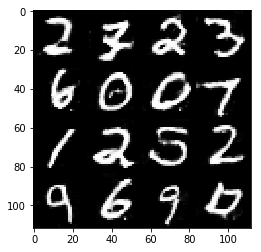

Epoch 6/8... Discriminator Loss: 1.2919 ... Generator Loss: 1.0438
Epoch 6/8... Discriminator Loss: 1.3836 ... Generator Loss: 1.0911
Epoch 7/8... Discriminator Loss: 1.5135 ... Generator Loss: 0.4711
Epoch 7/8... Discriminator Loss: 1.1179 ... Generator Loss: 0.6737
Epoch 7/8... Discriminator Loss: 1.2632 ... Generator Loss: 0.5567
Epoch 7/8... Discriminator Loss: 0.9958 ... Generator Loss: 0.7726
Epoch 7/8... Discriminator Loss: 1.2118 ... Generator Loss: 0.7489
Epoch 7/8... Discriminator Loss: 1.1225 ... Generator Loss: 0.8707
Epoch 7/8... Discriminator Loss: 1.2833 ... Generator Loss: 0.5354
Epoch 7/8... Discriminator Loss: 1.1081 ... Generator Loss: 0.9850
Epoch 7/8... Discriminator Loss: 1.2801 ... Generator Loss: 0.8073
Epoch 7/8... Discriminator Loss: 1.0584 ... Generator Loss: 0.9671


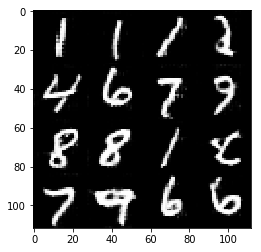

Epoch 7/8... Discriminator Loss: 1.1950 ... Generator Loss: 0.7634
Epoch 7/8... Discriminator Loss: 1.1435 ... Generator Loss: 0.7177
Epoch 7/8... Discriminator Loss: 1.5791 ... Generator Loss: 0.4264
Epoch 7/8... Discriminator Loss: 1.1862 ... Generator Loss: 0.6700
Epoch 7/8... Discriminator Loss: 1.4369 ... Generator Loss: 0.4622
Epoch 7/8... Discriminator Loss: 1.3871 ... Generator Loss: 0.5291
Epoch 7/8... Discriminator Loss: 1.3381 ... Generator Loss: 1.0477
Epoch 7/8... Discriminator Loss: 1.2956 ... Generator Loss: 1.2093
Epoch 7/8... Discriminator Loss: 1.2667 ... Generator Loss: 0.5700
Epoch 7/8... Discriminator Loss: 1.2194 ... Generator Loss: 1.2077


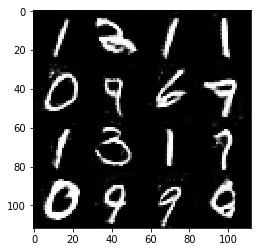

Epoch 7/8... Discriminator Loss: 1.3701 ... Generator Loss: 1.3535
Epoch 7/8... Discriminator Loss: 1.2990 ... Generator Loss: 0.5266
Epoch 7/8... Discriminator Loss: 1.5612 ... Generator Loss: 0.4481
Epoch 7/8... Discriminator Loss: 1.4527 ... Generator Loss: 0.4956
Epoch 7/8... Discriminator Loss: 1.0957 ... Generator Loss: 1.0887
Epoch 7/8... Discriminator Loss: 1.3987 ... Generator Loss: 0.4678
Epoch 7/8... Discriminator Loss: 1.1542 ... Generator Loss: 0.7355
Epoch 7/8... Discriminator Loss: 1.2418 ... Generator Loss: 0.6173
Epoch 7/8... Discriminator Loss: 2.0352 ... Generator Loss: 0.3200
Epoch 7/8... Discriminator Loss: 1.2472 ... Generator Loss: 0.6465


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.05


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/8... Discriminator Loss: 0.6838 ... Generator Loss: 2.7892
Epoch 1/8... Discriminator Loss: 8.2901 ... Generator Loss: 0.1695
Epoch 1/8... Discriminator Loss: 2.9486 ... Generator Loss: 0.4482
Epoch 1/8... Discriminator Loss: 1.2678 ... Generator Loss: 1.0674
Epoch 1/8... Discriminator Loss: 0.7298 ... Generator Loss: 1.4809
Epoch 1/8... Discriminator Loss: 0.3760 ... Generator Loss: 2.8919
Epoch 1/8... Discriminator Loss: 0.4633 ... Generator Loss: 2.0661
Epoch 1/8... Discriminator Loss: 0.7535 ... Generator Loss: 5.2446
Epoch 1/8... Discriminator Loss: 4.5272 ... Generator Loss: 9.9493
Epoch 1/8... Discriminator Loss: 4.1691 ... Generator Loss: 8.9039


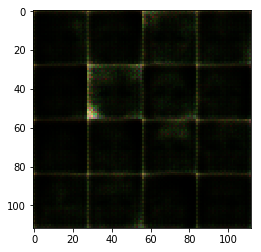

Epoch 1/8... Discriminator Loss: 2.6533 ... Generator Loss: 7.6649
Epoch 1/8... Discriminator Loss: 0.5034 ... Generator Loss: 3.8676
Epoch 1/8... Discriminator Loss: 4.0490 ... Generator Loss: 0.1871
Epoch 1/8... Discriminator Loss: 0.9231 ... Generator Loss: 0.9689
Epoch 1/8... Discriminator Loss: 2.0234 ... Generator Loss: 6.0852
Epoch 1/8... Discriminator Loss: 0.3894 ... Generator Loss: 3.3318
Epoch 1/8... Discriminator Loss: 2.2983 ... Generator Loss: 0.3076
Epoch 1/8... Discriminator Loss: 0.8315 ... Generator Loss: 1.1359
Epoch 1/8... Discriminator Loss: 1.0106 ... Generator Loss: 0.9490
Epoch 1/8... Discriminator Loss: 0.8148 ... Generator Loss: 1.2549


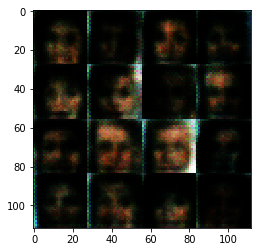

Epoch 1/8... Discriminator Loss: 0.4287 ... Generator Loss: 4.3047
Epoch 1/8... Discriminator Loss: 2.0999 ... Generator Loss: 4.6037
Epoch 1/8... Discriminator Loss: 0.4800 ... Generator Loss: 1.7576
Epoch 1/8... Discriminator Loss: 1.2605 ... Generator Loss: 0.5779
Epoch 1/8... Discriminator Loss: 1.1858 ... Generator Loss: 0.5900
Epoch 1/8... Discriminator Loss: 0.9131 ... Generator Loss: 0.8255
Epoch 1/8... Discriminator Loss: 0.5638 ... Generator Loss: 1.3133
Epoch 1/8... Discriminator Loss: 1.5800 ... Generator Loss: 0.3931
Epoch 1/8... Discriminator Loss: 0.4032 ... Generator Loss: 3.2285
Epoch 1/8... Discriminator Loss: 0.9633 ... Generator Loss: 0.9552


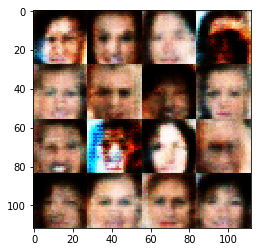

Epoch 1/8... Discriminator Loss: 0.7842 ... Generator Loss: 1.1732
Epoch 1/8... Discriminator Loss: 0.5271 ... Generator Loss: 1.9792
Epoch 1/8... Discriminator Loss: 0.6447 ... Generator Loss: 2.0744
Epoch 1/8... Discriminator Loss: 3.0360 ... Generator Loss: 0.2001
Epoch 1/8... Discriminator Loss: 0.3944 ... Generator Loss: 3.2068
Epoch 1/8... Discriminator Loss: 1.3088 ... Generator Loss: 0.5459
Epoch 1/8... Discriminator Loss: 0.5752 ... Generator Loss: 1.8580
Epoch 1/8... Discriminator Loss: 0.4401 ... Generator Loss: 2.0309
Epoch 1/8... Discriminator Loss: 3.3067 ... Generator Loss: 4.1606
Epoch 1/8... Discriminator Loss: 1.5048 ... Generator Loss: 0.4489


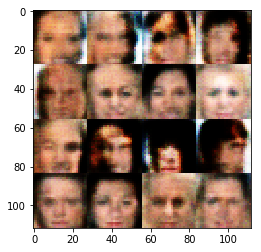

Epoch 1/8... Discriminator Loss: 1.0214 ... Generator Loss: 0.8498
Epoch 1/8... Discriminator Loss: 0.6532 ... Generator Loss: 1.4476
Epoch 1/8... Discriminator Loss: 1.8320 ... Generator Loss: 2.6100
Epoch 1/8... Discriminator Loss: 0.6895 ... Generator Loss: 1.2210
Epoch 1/8... Discriminator Loss: 0.4824 ... Generator Loss: 3.2571
Epoch 1/8... Discriminator Loss: 0.6218 ... Generator Loss: 1.6652
Epoch 1/8... Discriminator Loss: 0.7234 ... Generator Loss: 1.3398
Epoch 1/8... Discriminator Loss: 2.8989 ... Generator Loss: 0.2451
Epoch 1/8... Discriminator Loss: 0.6663 ... Generator Loss: 1.1831
Epoch 1/8... Discriminator Loss: 1.0872 ... Generator Loss: 0.7845


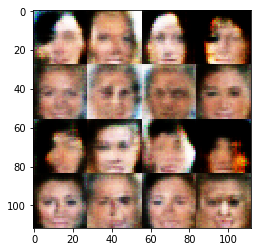

Epoch 1/8... Discriminator Loss: 2.1073 ... Generator Loss: 2.9515
Epoch 1/8... Discriminator Loss: 0.9706 ... Generator Loss: 0.7220
Epoch 1/8... Discriminator Loss: 1.1945 ... Generator Loss: 0.5839
Epoch 1/8... Discriminator Loss: 1.3867 ... Generator Loss: 0.4669
Epoch 1/8... Discriminator Loss: 0.8723 ... Generator Loss: 4.1989
Epoch 1/8... Discriminator Loss: 0.6222 ... Generator Loss: 1.2262
Epoch 1/8... Discriminator Loss: 0.8483 ... Generator Loss: 2.1796
Epoch 1/8... Discriminator Loss: 0.7508 ... Generator Loss: 1.2188
Epoch 1/8... Discriminator Loss: 0.4853 ... Generator Loss: 2.6178
Epoch 1/8... Discriminator Loss: 0.3721 ... Generator Loss: 2.2884


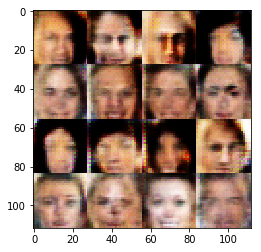

Epoch 1/8... Discriminator Loss: 2.5842 ... Generator Loss: 2.8109
Epoch 1/8... Discriminator Loss: 1.3385 ... Generator Loss: 2.1509
Epoch 1/8... Discriminator Loss: 1.0655 ... Generator Loss: 0.7563
Epoch 1/8... Discriminator Loss: 1.3731 ... Generator Loss: 0.5917
Epoch 1/8... Discriminator Loss: 1.5358 ... Generator Loss: 0.4095
Epoch 1/8... Discriminator Loss: 0.6454 ... Generator Loss: 2.3209
Epoch 1/8... Discriminator Loss: 0.6420 ... Generator Loss: 1.4284
Epoch 1/8... Discriminator Loss: 1.4010 ... Generator Loss: 0.5071
Epoch 1/8... Discriminator Loss: 2.4064 ... Generator Loss: 0.2201
Epoch 1/8... Discriminator Loss: 0.6983 ... Generator Loss: 1.1948


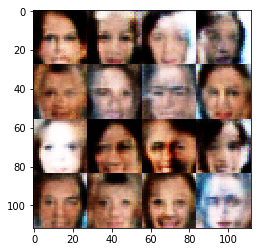

Epoch 1/8... Discriminator Loss: 1.4494 ... Generator Loss: 0.4721
Epoch 1/8... Discriminator Loss: 0.5901 ... Generator Loss: 1.4050
Epoch 1/8... Discriminator Loss: 0.7808 ... Generator Loss: 0.9927
Epoch 1/8... Discriminator Loss: 3.8428 ... Generator Loss: 0.1469
Epoch 1/8... Discriminator Loss: 0.7462 ... Generator Loss: 1.2368
Epoch 1/8... Discriminator Loss: 0.7818 ... Generator Loss: 0.9686
Epoch 1/8... Discriminator Loss: 1.3475 ... Generator Loss: 0.4884
Epoch 1/8... Discriminator Loss: 0.5547 ... Generator Loss: 3.8519
Epoch 1/8... Discriminator Loss: 0.5844 ... Generator Loss: 1.5734
Epoch 1/8... Discriminator Loss: 0.4502 ... Generator Loss: 3.2526


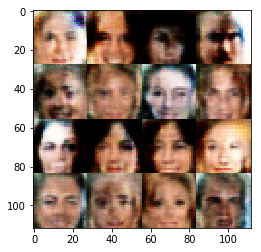

Epoch 1/8... Discriminator Loss: 0.5243 ... Generator Loss: 3.2576
Epoch 1/8... Discriminator Loss: 1.7448 ... Generator Loss: 1.8635
Epoch 1/8... Discriminator Loss: 0.5122 ... Generator Loss: 1.7850
Epoch 1/8... Discriminator Loss: 3.1575 ... Generator Loss: 3.1102
Epoch 1/8... Discriminator Loss: 0.9167 ... Generator Loss: 0.7746
Epoch 1/8... Discriminator Loss: 0.4080 ... Generator Loss: 3.8882
Epoch 1/8... Discriminator Loss: 0.3300 ... Generator Loss: 4.1040
Epoch 1/8... Discriminator Loss: 1.1364 ... Generator Loss: 0.8880
Epoch 1/8... Discriminator Loss: 0.6573 ... Generator Loss: 1.6989
Epoch 1/8... Discriminator Loss: 1.0068 ... Generator Loss: 0.7455


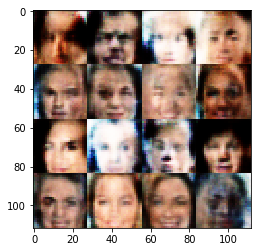

Epoch 1/8... Discriminator Loss: 0.9003 ... Generator Loss: 0.9800
Epoch 1/8... Discriminator Loss: 0.5024 ... Generator Loss: 1.8236
Epoch 1/8... Discriminator Loss: 2.3342 ... Generator Loss: 0.2326
Epoch 1/8... Discriminator Loss: 1.4522 ... Generator Loss: 0.9180
Epoch 1/8... Discriminator Loss: 1.3910 ... Generator Loss: 0.8511
Epoch 1/8... Discriminator Loss: 1.3528 ... Generator Loss: 0.7663
Epoch 1/8... Discriminator Loss: 1.2315 ... Generator Loss: 0.9601
Epoch 1/8... Discriminator Loss: 1.1420 ... Generator Loss: 1.0989
Epoch 1/8... Discriminator Loss: 1.3358 ... Generator Loss: 1.2816
Epoch 1/8... Discriminator Loss: 0.5121 ... Generator Loss: 1.5899


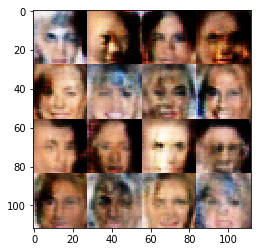

Epoch 1/8... Discriminator Loss: 0.5953 ... Generator Loss: 1.3071
Epoch 1/8... Discriminator Loss: 1.7454 ... Generator Loss: 2.3235
Epoch 1/8... Discriminator Loss: 1.2818 ... Generator Loss: 0.5391
Epoch 1/8... Discriminator Loss: 0.6296 ... Generator Loss: 1.6043
Epoch 1/8... Discriminator Loss: 0.9573 ... Generator Loss: 2.6895
Epoch 1/8... Discriminator Loss: 0.4539 ... Generator Loss: 2.6334
Epoch 1/8... Discriminator Loss: 1.7258 ... Generator Loss: 2.0033
Epoch 1/8... Discriminator Loss: 0.5668 ... Generator Loss: 2.0958
Epoch 1/8... Discriminator Loss: 1.5042 ... Generator Loss: 0.4164
Epoch 1/8... Discriminator Loss: 1.4083 ... Generator Loss: 1.8545


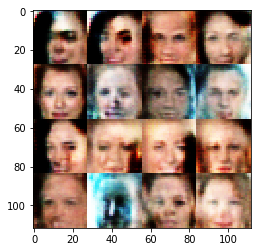

Epoch 1/8... Discriminator Loss: 0.5355 ... Generator Loss: 1.6764
Epoch 1/8... Discriminator Loss: 0.7580 ... Generator Loss: 1.3498
Epoch 1/8... Discriminator Loss: 2.5727 ... Generator Loss: 0.2845
Epoch 1/8... Discriminator Loss: 0.6845 ... Generator Loss: 1.1955
Epoch 1/8... Discriminator Loss: 0.5778 ... Generator Loss: 1.5606
Epoch 1/8... Discriminator Loss: 1.7711 ... Generator Loss: 0.3733
Epoch 1/8... Discriminator Loss: 0.8598 ... Generator Loss: 2.8327
Epoch 1/8... Discriminator Loss: 1.2111 ... Generator Loss: 0.6658
Epoch 1/8... Discriminator Loss: 1.0775 ... Generator Loss: 0.7909
Epoch 1/8... Discriminator Loss: 0.6769 ... Generator Loss: 2.7590


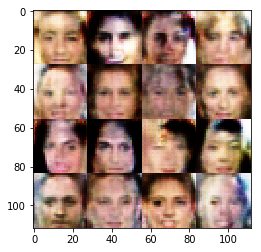

Epoch 1/8... Discriminator Loss: 1.0071 ... Generator Loss: 1.5130
Epoch 1/8... Discriminator Loss: 0.6896 ... Generator Loss: 1.3680
Epoch 1/8... Discriminator Loss: 1.0482 ... Generator Loss: 0.6673
Epoch 1/8... Discriminator Loss: 0.5294 ... Generator Loss: 2.2089
Epoch 1/8... Discriminator Loss: 1.1336 ... Generator Loss: 0.5916
Epoch 1/8... Discriminator Loss: 1.3223 ... Generator Loss: 0.5928
Epoch 1/8... Discriminator Loss: 0.8475 ... Generator Loss: 2.1497
Epoch 1/8... Discriminator Loss: 1.1284 ... Generator Loss: 0.6583
Epoch 1/8... Discriminator Loss: 0.9756 ... Generator Loss: 1.7438
Epoch 1/8... Discriminator Loss: 1.6953 ... Generator Loss: 2.2067


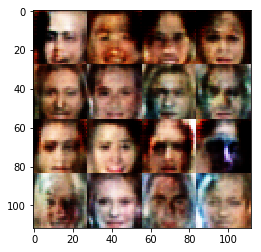

Epoch 1/8... Discriminator Loss: 1.0623 ... Generator Loss: 1.8515
Epoch 1/8... Discriminator Loss: 1.0149 ... Generator Loss: 0.9262
Epoch 1/8... Discriminator Loss: 1.1966 ... Generator Loss: 0.9335
Epoch 1/8... Discriminator Loss: 1.3680 ... Generator Loss: 0.5460
Epoch 1/8... Discriminator Loss: 1.5525 ... Generator Loss: 0.4141
Epoch 1/8... Discriminator Loss: 1.0668 ... Generator Loss: 0.8132
Epoch 1/8... Discriminator Loss: 0.9411 ... Generator Loss: 0.8324
Epoch 1/8... Discriminator Loss: 0.7507 ... Generator Loss: 1.5938
Epoch 1/8... Discriminator Loss: 1.2898 ... Generator Loss: 2.2685
Epoch 1/8... Discriminator Loss: 0.6944 ... Generator Loss: 2.5060


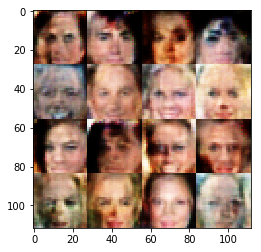

Epoch 1/8... Discriminator Loss: 2.5045 ... Generator Loss: 2.7271
Epoch 1/8... Discriminator Loss: 1.3516 ... Generator Loss: 0.6533
Epoch 1/8... Discriminator Loss: 0.9114 ... Generator Loss: 1.1224
Epoch 1/8... Discriminator Loss: 0.5888 ... Generator Loss: 2.5147
Epoch 1/8... Discriminator Loss: 0.6194 ... Generator Loss: 1.3543
Epoch 1/8... Discriminator Loss: 1.7687 ... Generator Loss: 0.3369
Epoch 1/8... Discriminator Loss: 1.0301 ... Generator Loss: 1.1106
Epoch 1/8... Discriminator Loss: 0.8676 ... Generator Loss: 1.0782
Epoch 1/8... Discriminator Loss: 0.9544 ... Generator Loss: 0.8712
Epoch 1/8... Discriminator Loss: 1.0665 ... Generator Loss: 0.6690


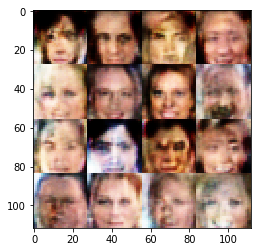

Epoch 1/8... Discriminator Loss: 1.2796 ... Generator Loss: 0.7579
Epoch 1/8... Discriminator Loss: 1.5332 ... Generator Loss: 0.4878
Epoch 1/8... Discriminator Loss: 0.8950 ... Generator Loss: 0.8685
Epoch 1/8... Discriminator Loss: 1.2251 ... Generator Loss: 0.7036
Epoch 1/8... Discriminator Loss: 0.5179 ... Generator Loss: 2.0648
Epoch 1/8... Discriminator Loss: 1.5698 ... Generator Loss: 0.5201
Epoch 1/8... Discriminator Loss: 1.0888 ... Generator Loss: 1.2571
Epoch 1/8... Discriminator Loss: 0.6170 ... Generator Loss: 2.1196
Epoch 1/8... Discriminator Loss: 1.0211 ... Generator Loss: 0.9153
Epoch 1/8... Discriminator Loss: 0.5877 ... Generator Loss: 1.2213


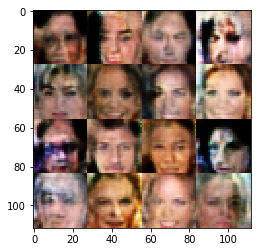

Epoch 1/8... Discriminator Loss: 0.8403 ... Generator Loss: 1.1068
Epoch 1/8... Discriminator Loss: 0.8542 ... Generator Loss: 1.0427
Epoch 1/8... Discriminator Loss: 1.3640 ... Generator Loss: 0.4645
Epoch 1/8... Discriminator Loss: 0.6959 ... Generator Loss: 1.7292
Epoch 1/8... Discriminator Loss: 1.2367 ... Generator Loss: 0.5856
Epoch 1/8... Discriminator Loss: 1.2087 ... Generator Loss: 0.5949
Epoch 1/8... Discriminator Loss: 0.9434 ... Generator Loss: 2.8836
Epoch 1/8... Discriminator Loss: 0.9908 ... Generator Loss: 1.2736
Epoch 1/8... Discriminator Loss: 0.7849 ... Generator Loss: 2.1942
Epoch 1/8... Discriminator Loss: 1.3077 ... Generator Loss: 0.8309


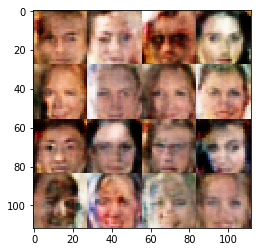

Epoch 1/8... Discriminator Loss: 1.2033 ... Generator Loss: 3.0973
Epoch 1/8... Discriminator Loss: 0.8021 ... Generator Loss: 0.8779
Epoch 1/8... Discriminator Loss: 0.7944 ... Generator Loss: 1.3563
Epoch 1/8... Discriminator Loss: 1.1477 ... Generator Loss: 1.3400
Epoch 1/8... Discriminator Loss: 1.5228 ... Generator Loss: 0.4620
Epoch 1/8... Discriminator Loss: 1.4762 ... Generator Loss: 0.4395
Epoch 1/8... Discriminator Loss: 0.5708 ... Generator Loss: 2.4130
Epoch 1/8... Discriminator Loss: 1.5518 ... Generator Loss: 1.6834
Epoch 1/8... Discriminator Loss: 1.3863 ... Generator Loss: 0.5774
Epoch 1/8... Discriminator Loss: 0.8302 ... Generator Loss: 1.6467


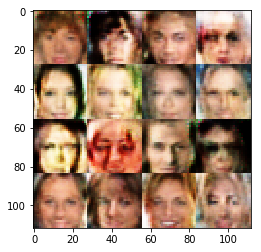

Epoch 1/8... Discriminator Loss: 1.0234 ... Generator Loss: 0.8085
Epoch 1/8... Discriminator Loss: 0.6744 ... Generator Loss: 1.4107
Epoch 1/8... Discriminator Loss: 2.4007 ... Generator Loss: 2.2392
Epoch 1/8... Discriminator Loss: 1.0371 ... Generator Loss: 1.3092
Epoch 1/8... Discriminator Loss: 1.0046 ... Generator Loss: 0.8738
Epoch 1/8... Discriminator Loss: 1.3979 ... Generator Loss: 0.4649
Epoch 1/8... Discriminator Loss: 1.4054 ... Generator Loss: 1.8676
Epoch 1/8... Discriminator Loss: 0.9883 ... Generator Loss: 0.8371
Epoch 1/8... Discriminator Loss: 1.2612 ... Generator Loss: 1.5971
Epoch 1/8... Discriminator Loss: 1.4326 ... Generator Loss: 1.7524


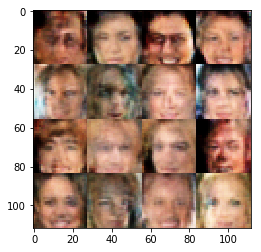

Epoch 1/8... Discriminator Loss: 1.7035 ... Generator Loss: 2.2744
Epoch 1/8... Discriminator Loss: 0.5373 ... Generator Loss: 2.1809
Epoch 1/8... Discriminator Loss: 0.4949 ... Generator Loss: 1.8776
Epoch 1/8... Discriminator Loss: 0.4230 ... Generator Loss: 2.9112
Epoch 1/8... Discriminator Loss: 0.3009 ... Generator Loss: 3.3310
Epoch 1/8... Discriminator Loss: 0.5375 ... Generator Loss: 2.0571
Epoch 1/8... Discriminator Loss: 0.9328 ... Generator Loss: 1.3490
Epoch 1/8... Discriminator Loss: 1.2404 ... Generator Loss: 0.7279
Epoch 1/8... Discriminator Loss: 0.9998 ... Generator Loss: 0.7806
Epoch 1/8... Discriminator Loss: 1.2349 ... Generator Loss: 0.7726


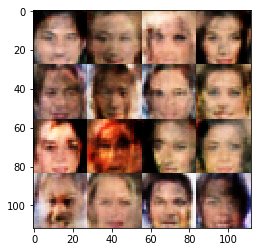

Epoch 1/8... Discriminator Loss: 1.3173 ... Generator Loss: 0.7252
Epoch 1/8... Discriminator Loss: 1.3813 ... Generator Loss: 1.5457
Epoch 1/8... Discriminator Loss: 1.1885 ... Generator Loss: 0.7616
Epoch 1/8... Discriminator Loss: 1.4936 ... Generator Loss: 0.9848
Epoch 1/8... Discriminator Loss: 0.8748 ... Generator Loss: 0.9308
Epoch 1/8... Discriminator Loss: 1.2076 ... Generator Loss: 0.9836
Epoch 1/8... Discriminator Loss: 0.8123 ... Generator Loss: 1.3145
Epoch 1/8... Discriminator Loss: 0.9922 ... Generator Loss: 1.1993
Epoch 1/8... Discriminator Loss: 1.2476 ... Generator Loss: 0.6750
Epoch 1/8... Discriminator Loss: 1.3847 ... Generator Loss: 0.5179


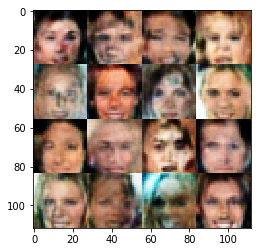

Epoch 1/8... Discriminator Loss: 1.3863 ... Generator Loss: 0.9830
Epoch 1/8... Discriminator Loss: 0.9682 ... Generator Loss: 0.8314
Epoch 1/8... Discriminator Loss: 1.2350 ... Generator Loss: 0.6566
Epoch 1/8... Discriminator Loss: 1.3902 ... Generator Loss: 0.4740
Epoch 1/8... Discriminator Loss: 2.1944 ... Generator Loss: 0.2563
Epoch 1/8... Discriminator Loss: 0.9193 ... Generator Loss: 1.0581
Epoch 1/8... Discriminator Loss: 1.1145 ... Generator Loss: 2.4813
Epoch 1/8... Discriminator Loss: 1.1183 ... Generator Loss: 0.8908
Epoch 1/8... Discriminator Loss: 1.3864 ... Generator Loss: 0.8145
Epoch 1/8... Discriminator Loss: 1.6303 ... Generator Loss: 1.5594


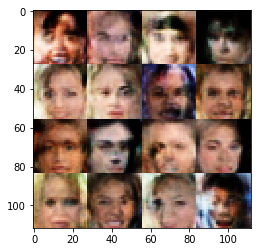

Epoch 1/8... Discriminator Loss: 1.2601 ... Generator Loss: 1.0197
Epoch 1/8... Discriminator Loss: 1.6143 ... Generator Loss: 0.4589
Epoch 1/8... Discriminator Loss: 0.8452 ... Generator Loss: 1.8121
Epoch 1/8... Discriminator Loss: 1.5852 ... Generator Loss: 1.9582
Epoch 1/8... Discriminator Loss: 1.6968 ... Generator Loss: 1.8593
Epoch 1/8... Discriminator Loss: 0.9440 ... Generator Loss: 1.3002
Epoch 1/8... Discriminator Loss: 1.4625 ... Generator Loss: 1.1232
Epoch 1/8... Discriminator Loss: 1.2299 ... Generator Loss: 0.6926
Epoch 1/8... Discriminator Loss: 1.2418 ... Generator Loss: 1.4199
Epoch 1/8... Discriminator Loss: 1.6438 ... Generator Loss: 1.6541


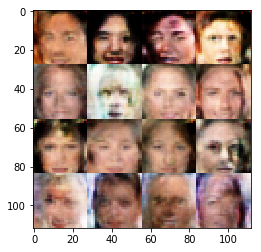

Epoch 1/8... Discriminator Loss: 1.0093 ... Generator Loss: 1.0077
Epoch 1/8... Discriminator Loss: 1.2804 ... Generator Loss: 0.5778
Epoch 1/8... Discriminator Loss: 1.2885 ... Generator Loss: 0.6077
Epoch 1/8... Discriminator Loss: 0.8599 ... Generator Loss: 1.4441
Epoch 1/8... Discriminator Loss: 0.7961 ... Generator Loss: 1.3893
Epoch 1/8... Discriminator Loss: 1.2916 ... Generator Loss: 1.5041
Epoch 1/8... Discriminator Loss: 0.7707 ... Generator Loss: 1.8672
Epoch 1/8... Discriminator Loss: 0.8663 ... Generator Loss: 1.4110
Epoch 1/8... Discriminator Loss: 1.2204 ... Generator Loss: 1.4457
Epoch 1/8... Discriminator Loss: 0.9228 ... Generator Loss: 0.9563


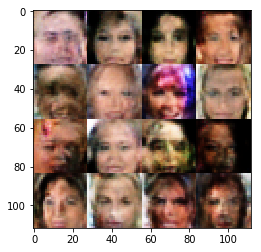

Epoch 1/8... Discriminator Loss: 1.2876 ... Generator Loss: 0.6936
Epoch 1/8... Discriminator Loss: 0.8653 ... Generator Loss: 1.0940
Epoch 1/8... Discriminator Loss: 1.1706 ... Generator Loss: 0.9492
Epoch 1/8... Discriminator Loss: 1.0120 ... Generator Loss: 0.8615
Epoch 1/8... Discriminator Loss: 1.1673 ... Generator Loss: 0.9342
Epoch 1/8... Discriminator Loss: 0.9493 ... Generator Loss: 2.6383
Epoch 1/8... Discriminator Loss: 1.0045 ... Generator Loss: 1.3159
Epoch 1/8... Discriminator Loss: 2.3558 ... Generator Loss: 2.2152
Epoch 1/8... Discriminator Loss: 1.0994 ... Generator Loss: 0.6961
Epoch 1/8... Discriminator Loss: 1.2075 ... Generator Loss: 0.8850


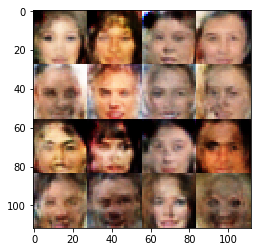

Epoch 1/8... Discriminator Loss: 0.9328 ... Generator Loss: 1.1289
Epoch 1/8... Discriminator Loss: 1.9554 ... Generator Loss: 0.2962
Epoch 1/8... Discriminator Loss: 1.0267 ... Generator Loss: 0.8504
Epoch 1/8... Discriminator Loss: 1.1143 ... Generator Loss: 0.9317
Epoch 1/8... Discriminator Loss: 1.2218 ... Generator Loss: 0.7221
Epoch 1/8... Discriminator Loss: 1.6147 ... Generator Loss: 0.3946
Epoch 1/8... Discriminator Loss: 1.4372 ... Generator Loss: 0.4390
Epoch 1/8... Discriminator Loss: 0.7996 ... Generator Loss: 1.0297
Epoch 1/8... Discriminator Loss: 1.4126 ... Generator Loss: 2.0579
Epoch 1/8... Discriminator Loss: 1.3867 ... Generator Loss: 1.3346


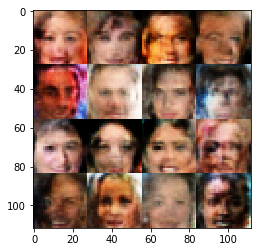

Epoch 1/8... Discriminator Loss: 1.3068 ... Generator Loss: 0.5748
Epoch 1/8... Discriminator Loss: 1.2996 ... Generator Loss: 1.5747
Epoch 1/8... Discriminator Loss: 1.3766 ... Generator Loss: 0.4539
Epoch 1/8... Discriminator Loss: 1.2990 ... Generator Loss: 0.6360
Epoch 1/8... Discriminator Loss: 1.3350 ... Generator Loss: 0.9136
Epoch 1/8... Discriminator Loss: 1.5396 ... Generator Loss: 1.7239
Epoch 1/8... Discriminator Loss: 0.8511 ... Generator Loss: 0.9734
Epoch 1/8... Discriminator Loss: 1.4728 ... Generator Loss: 1.9087
Epoch 1/8... Discriminator Loss: 0.9217 ... Generator Loss: 1.0275
Epoch 1/8... Discriminator Loss: 0.6808 ... Generator Loss: 1.8469


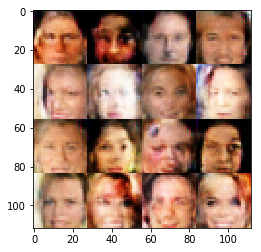

Epoch 1/8... Discriminator Loss: 0.8806 ... Generator Loss: 1.3630
Epoch 1/8... Discriminator Loss: 1.3753 ... Generator Loss: 1.1671
Epoch 1/8... Discriminator Loss: 1.3004 ... Generator Loss: 1.4861
Epoch 1/8... Discriminator Loss: 1.0241 ... Generator Loss: 0.9056
Epoch 1/8... Discriminator Loss: 1.4491 ... Generator Loss: 0.4212
Epoch 1/8... Discriminator Loss: 1.4338 ... Generator Loss: 0.4135
Epoch 1/8... Discriminator Loss: 1.6404 ... Generator Loss: 0.3545
Epoch 1/8... Discriminator Loss: 1.2322 ... Generator Loss: 0.6278
Epoch 1/8... Discriminator Loss: 1.5324 ... Generator Loss: 0.4283
Epoch 1/8... Discriminator Loss: 1.5360 ... Generator Loss: 1.7352


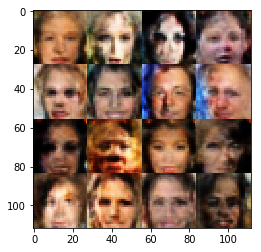

Epoch 1/8... Discriminator Loss: 1.8999 ... Generator Loss: 2.3209
Epoch 1/8... Discriminator Loss: 0.8681 ... Generator Loss: 1.6200
Epoch 1/8... Discriminator Loss: 1.5991 ... Generator Loss: 1.7514
Epoch 1/8... Discriminator Loss: 0.9276 ... Generator Loss: 1.2426
Epoch 1/8... Discriminator Loss: 1.2201 ... Generator Loss: 0.8301
Epoch 1/8... Discriminator Loss: 0.8548 ... Generator Loss: 1.3604
Epoch 1/8... Discriminator Loss: 0.9557 ... Generator Loss: 1.2334
Epoch 1/8... Discriminator Loss: 1.4738 ... Generator Loss: 2.3301
Epoch 1/8... Discriminator Loss: 1.0747 ... Generator Loss: 1.7786
Epoch 1/8... Discriminator Loss: 1.3164 ... Generator Loss: 0.5593


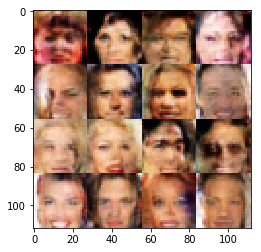

Epoch 1/8... Discriminator Loss: 1.3075 ... Generator Loss: 0.5525
Epoch 1/8... Discriminator Loss: 1.1191 ... Generator Loss: 0.6393
Epoch 1/8... Discriminator Loss: 1.4195 ... Generator Loss: 0.3761
Epoch 1/8... Discriminator Loss: 1.1638 ... Generator Loss: 1.9013
Epoch 1/8... Discriminator Loss: 0.5745 ... Generator Loss: 1.5645
Epoch 1/8... Discriminator Loss: 1.2470 ... Generator Loss: 1.4675
Epoch 1/8... Discriminator Loss: 1.0499 ... Generator Loss: 0.7930
Epoch 1/8... Discriminator Loss: 1.5996 ... Generator Loss: 0.2924
Epoch 1/8... Discriminator Loss: 1.3459 ... Generator Loss: 0.5044
Epoch 1/8... Discriminator Loss: 0.9609 ... Generator Loss: 0.9157


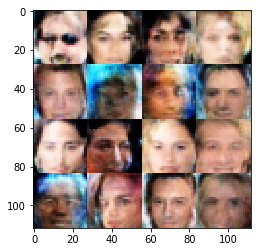

Epoch 1/8... Discriminator Loss: 1.0440 ... Generator Loss: 0.6200
Epoch 1/8... Discriminator Loss: 0.6680 ... Generator Loss: 1.3590
Epoch 1/8... Discriminator Loss: 0.6941 ... Generator Loss: 1.6955
Epoch 1/8... Discriminator Loss: 0.7072 ... Generator Loss: 1.0899
Epoch 1/8... Discriminator Loss: 1.2914 ... Generator Loss: 0.6046
Epoch 1/8... Discriminator Loss: 1.3512 ... Generator Loss: 1.6253
Epoch 1/8... Discriminator Loss: 0.7962 ... Generator Loss: 1.0049
Epoch 1/8... Discriminator Loss: 1.0550 ... Generator Loss: 0.7560
Epoch 1/8... Discriminator Loss: 1.3742 ... Generator Loss: 1.2646
Epoch 1/8... Discriminator Loss: 0.8568 ... Generator Loss: 1.0413


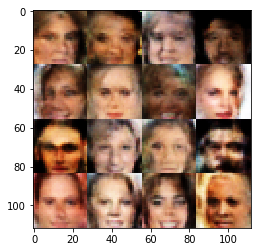

Epoch 1/8... Discriminator Loss: 1.4703 ... Generator Loss: 1.7136
Epoch 1/8... Discriminator Loss: 1.0241 ... Generator Loss: 0.9877
Epoch 1/8... Discriminator Loss: 0.9315 ... Generator Loss: 2.0672
Epoch 1/8... Discriminator Loss: 1.0351 ... Generator Loss: 1.1869
Epoch 1/8... Discriminator Loss: 1.0469 ... Generator Loss: 0.7012
Epoch 1/8... Discriminator Loss: 1.0801 ... Generator Loss: 1.2452


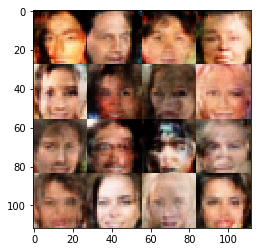

Epoch 2/8... Discriminator Loss: 0.8500 ... Generator Loss: 1.2022
Epoch 2/8... Discriminator Loss: 0.8174 ... Generator Loss: 2.5875
Epoch 2/8... Discriminator Loss: 0.9058 ... Generator Loss: 2.1453
Epoch 2/8... Discriminator Loss: 1.5760 ... Generator Loss: 0.3529


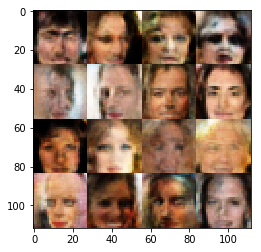

Epoch 2/8... Discriminator Loss: 1.0376 ... Generator Loss: 1.9605
Epoch 2/8... Discriminator Loss: 0.8900 ... Generator Loss: 1.1358
Epoch 2/8... Discriminator Loss: 1.5506 ... Generator Loss: 1.5253
Epoch 2/8... Discriminator Loss: 0.6387 ... Generator Loss: 1.9081
Epoch 2/8... Discriminator Loss: 1.4293 ... Generator Loss: 2.0223
Epoch 2/8... Discriminator Loss: 0.8413 ... Generator Loss: 1.5774
Epoch 2/8... Discriminator Loss: 0.7710 ... Generator Loss: 1.8500
Epoch 2/8... Discriminator Loss: 0.8843 ... Generator Loss: 1.0362
Epoch 2/8... Discriminator Loss: 0.9301 ... Generator Loss: 1.1815
Epoch 2/8... Discriminator Loss: 1.7004 ... Generator Loss: 2.2090


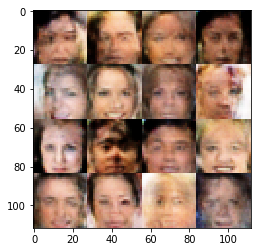

Epoch 2/8... Discriminator Loss: 1.2051 ... Generator Loss: 0.6679
Epoch 2/8... Discriminator Loss: 1.3039 ... Generator Loss: 0.4829
Epoch 2/8... Discriminator Loss: 0.8862 ... Generator Loss: 1.8820
Epoch 2/8... Discriminator Loss: 0.9377 ... Generator Loss: 0.9387
Epoch 2/8... Discriminator Loss: 1.3807 ... Generator Loss: 0.5560
Epoch 2/8... Discriminator Loss: 0.7139 ... Generator Loss: 1.3045
Epoch 2/8... Discriminator Loss: 1.0303 ... Generator Loss: 1.0605
Epoch 2/8... Discriminator Loss: 1.4833 ... Generator Loss: 1.1404
Epoch 2/8... Discriminator Loss: 0.9261 ... Generator Loss: 1.6347
Epoch 2/8... Discriminator Loss: 2.1348 ... Generator Loss: 2.5717


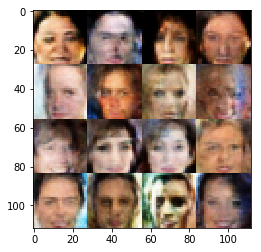

Epoch 2/8... Discriminator Loss: 1.0790 ... Generator Loss: 0.8273
Epoch 2/8... Discriminator Loss: 0.9512 ... Generator Loss: 0.8485
Epoch 2/8... Discriminator Loss: 1.4056 ... Generator Loss: 1.7165
Epoch 2/8... Discriminator Loss: 1.1923 ... Generator Loss: 0.6986
Epoch 2/8... Discriminator Loss: 0.8590 ... Generator Loss: 0.9725
Epoch 2/8... Discriminator Loss: 1.6355 ... Generator Loss: 0.4143
Epoch 2/8... Discriminator Loss: 1.1363 ... Generator Loss: 0.6536
Epoch 2/8... Discriminator Loss: 1.3425 ... Generator Loss: 1.0872
Epoch 2/8... Discriminator Loss: 1.0219 ... Generator Loss: 0.9132
Epoch 2/8... Discriminator Loss: 1.2635 ... Generator Loss: 0.6715


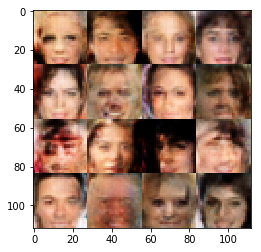

Epoch 2/8... Discriminator Loss: 1.0820 ... Generator Loss: 0.7203
Epoch 2/8... Discriminator Loss: 1.7896 ... Generator Loss: 2.2139
Epoch 2/8... Discriminator Loss: 0.6609 ... Generator Loss: 1.4880
Epoch 2/8... Discriminator Loss: 1.2395 ... Generator Loss: 1.2204
Epoch 2/8... Discriminator Loss: 1.1530 ... Generator Loss: 0.6055
Epoch 2/8... Discriminator Loss: 1.0832 ... Generator Loss: 0.6849
Epoch 2/8... Discriminator Loss: 0.8518 ... Generator Loss: 0.8951
Epoch 2/8... Discriminator Loss: 1.2080 ... Generator Loss: 0.7776
Epoch 2/8... Discriminator Loss: 0.9443 ... Generator Loss: 1.4067
Epoch 2/8... Discriminator Loss: 1.3894 ... Generator Loss: 1.3637


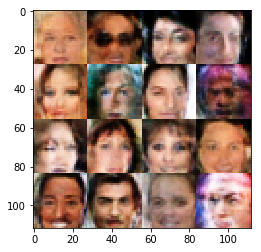

Epoch 2/8... Discriminator Loss: 1.0301 ... Generator Loss: 0.6764
Epoch 2/8... Discriminator Loss: 1.2727 ... Generator Loss: 0.5776
Epoch 2/8... Discriminator Loss: 0.9286 ... Generator Loss: 1.1063
Epoch 2/8... Discriminator Loss: 1.3812 ... Generator Loss: 0.4212
Epoch 2/8... Discriminator Loss: 1.0248 ... Generator Loss: 1.0000
Epoch 2/8... Discriminator Loss: 1.0299 ... Generator Loss: 1.0760
Epoch 2/8... Discriminator Loss: 1.2860 ... Generator Loss: 0.5188
Epoch 2/8... Discriminator Loss: 1.8015 ... Generator Loss: 0.3388
Epoch 2/8... Discriminator Loss: 0.8768 ... Generator Loss: 0.8813
Epoch 2/8... Discriminator Loss: 1.1983 ... Generator Loss: 0.6536


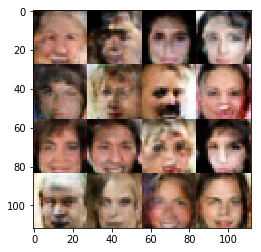

Epoch 2/8... Discriminator Loss: 2.2749 ... Generator Loss: 0.2506
Epoch 2/8... Discriminator Loss: 1.1173 ... Generator Loss: 0.6514
Epoch 2/8... Discriminator Loss: 1.3347 ... Generator Loss: 0.5244
Epoch 2/8... Discriminator Loss: 1.1111 ... Generator Loss: 1.2266
Epoch 2/8... Discriminator Loss: 1.3792 ... Generator Loss: 1.3973
Epoch 2/8... Discriminator Loss: 1.2935 ... Generator Loss: 1.3627
Epoch 2/8... Discriminator Loss: 0.4834 ... Generator Loss: 2.1359
Epoch 2/8... Discriminator Loss: 0.7359 ... Generator Loss: 1.1985
Epoch 2/8... Discriminator Loss: 0.5105 ... Generator Loss: 1.5215
Epoch 2/8... Discriminator Loss: 1.9897 ... Generator Loss: 0.3088


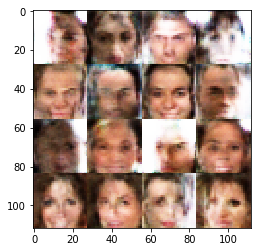

Epoch 2/8... Discriminator Loss: 1.1030 ... Generator Loss: 0.7480
Epoch 2/8... Discriminator Loss: 0.6121 ... Generator Loss: 1.8766
Epoch 2/8... Discriminator Loss: 1.5415 ... Generator Loss: 0.4818
Epoch 2/8... Discriminator Loss: 1.2966 ... Generator Loss: 0.6695
Epoch 2/8... Discriminator Loss: 0.5620 ... Generator Loss: 1.4313
Epoch 2/8... Discriminator Loss: 0.6441 ... Generator Loss: 1.1665
Epoch 2/8... Discriminator Loss: 0.8074 ... Generator Loss: 1.4214
Epoch 2/8... Discriminator Loss: 1.0138 ... Generator Loss: 1.8126
Epoch 2/8... Discriminator Loss: 1.1131 ... Generator Loss: 1.3586
Epoch 2/8... Discriminator Loss: 0.6008 ... Generator Loss: 1.5325


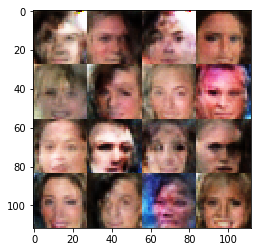

Epoch 2/8... Discriminator Loss: 0.9809 ... Generator Loss: 0.7820
Epoch 2/8... Discriminator Loss: 0.8982 ... Generator Loss: 3.4180
Epoch 2/8... Discriminator Loss: 0.4935 ... Generator Loss: 2.8101
Epoch 2/8... Discriminator Loss: 2.0470 ... Generator Loss: 1.2089
Epoch 2/8... Discriminator Loss: 0.7204 ... Generator Loss: 1.7136
Epoch 2/8... Discriminator Loss: 0.5743 ... Generator Loss: 1.6454
Epoch 2/8... Discriminator Loss: 1.0747 ... Generator Loss: 1.3221
Epoch 2/8... Discriminator Loss: 1.4165 ... Generator Loss: 1.8907
Epoch 2/8... Discriminator Loss: 0.7993 ... Generator Loss: 1.0318
Epoch 2/8... Discriminator Loss: 3.1804 ... Generator Loss: 3.1686


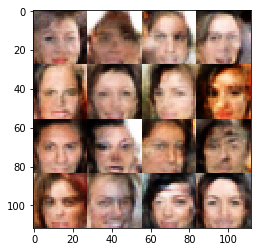

Epoch 2/8... Discriminator Loss: 0.8186 ... Generator Loss: 1.7049
Epoch 2/8... Discriminator Loss: 1.2194 ... Generator Loss: 1.7081
Epoch 2/8... Discriminator Loss: 0.3986 ... Generator Loss: 2.9866
Epoch 2/8... Discriminator Loss: 0.6199 ... Generator Loss: 1.4919
Epoch 2/8... Discriminator Loss: 0.3866 ... Generator Loss: 2.6315
Epoch 2/8... Discriminator Loss: 0.5410 ... Generator Loss: 2.9694
Epoch 2/8... Discriminator Loss: 0.8214 ... Generator Loss: 2.8328
Epoch 2/8... Discriminator Loss: 0.7505 ... Generator Loss: 1.9563
Epoch 2/8... Discriminator Loss: 0.6768 ... Generator Loss: 1.4266
Epoch 2/8... Discriminator Loss: 1.4779 ... Generator Loss: 0.4888


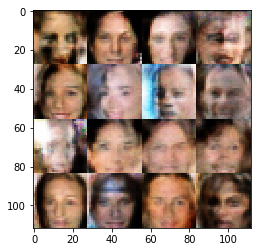

Epoch 2/8... Discriminator Loss: 1.0371 ... Generator Loss: 1.9622
Epoch 2/8... Discriminator Loss: 0.5528 ... Generator Loss: 1.4749
Epoch 2/8... Discriminator Loss: 1.5972 ... Generator Loss: 1.1030
Epoch 2/8... Discriminator Loss: 1.4180 ... Generator Loss: 1.9979
Epoch 2/8... Discriminator Loss: 0.5391 ... Generator Loss: 2.8606
Epoch 2/8... Discriminator Loss: 0.4604 ... Generator Loss: 2.6741
Epoch 2/8... Discriminator Loss: 0.3356 ... Generator Loss: 3.3535
Epoch 2/8... Discriminator Loss: 0.4667 ... Generator Loss: 1.7480
Epoch 2/8... Discriminator Loss: 1.6723 ... Generator Loss: 0.4659
Epoch 2/8... Discriminator Loss: 1.7224 ... Generator Loss: 0.4026


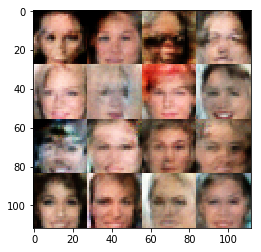

Epoch 2/8... Discriminator Loss: 1.1561 ... Generator Loss: 0.7838
Epoch 2/8... Discriminator Loss: 1.0832 ... Generator Loss: 0.6640
Epoch 2/8... Discriminator Loss: 1.4768 ... Generator Loss: 0.4589
Epoch 2/8... Discriminator Loss: 0.9915 ... Generator Loss: 1.1854
Epoch 2/8... Discriminator Loss: 1.5190 ... Generator Loss: 0.4338
Epoch 2/8... Discriminator Loss: 1.3852 ... Generator Loss: 1.5365
Epoch 2/8... Discriminator Loss: 1.5041 ... Generator Loss: 0.5961
Epoch 2/8... Discriminator Loss: 1.2080 ... Generator Loss: 0.6227
Epoch 2/8... Discriminator Loss: 0.9550 ... Generator Loss: 1.4356
Epoch 2/8... Discriminator Loss: 1.0293 ... Generator Loss: 1.2853


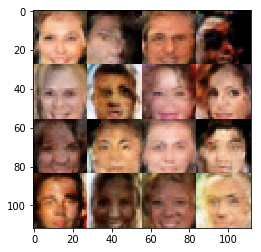

Epoch 2/8... Discriminator Loss: 1.1712 ... Generator Loss: 0.8546
Epoch 2/8... Discriminator Loss: 0.9317 ... Generator Loss: 0.8475
Epoch 2/8... Discriminator Loss: 0.7473 ... Generator Loss: 1.9622
Epoch 2/8... Discriminator Loss: 1.8188 ... Generator Loss: 2.0538
Epoch 2/8... Discriminator Loss: 1.1348 ... Generator Loss: 0.8909
Epoch 2/8... Discriminator Loss: 1.2420 ... Generator Loss: 1.6399
Epoch 2/8... Discriminator Loss: 1.3412 ... Generator Loss: 1.9377
Epoch 2/8... Discriminator Loss: 1.0391 ... Generator Loss: 0.8222
Epoch 2/8... Discriminator Loss: 1.0348 ... Generator Loss: 1.0925
Epoch 2/8... Discriminator Loss: 1.0719 ... Generator Loss: 0.9492


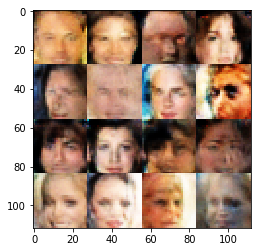

Epoch 2/8... Discriminator Loss: 0.8849 ... Generator Loss: 1.1905
Epoch 2/8... Discriminator Loss: 1.3820 ... Generator Loss: 1.3944
Epoch 2/8... Discriminator Loss: 0.8806 ... Generator Loss: 1.7617
Epoch 2/8... Discriminator Loss: 1.0841 ... Generator Loss: 0.6358
Epoch 2/8... Discriminator Loss: 1.2792 ... Generator Loss: 0.6823
Epoch 2/8... Discriminator Loss: 1.5154 ... Generator Loss: 1.4871
Epoch 2/8... Discriminator Loss: 1.7834 ... Generator Loss: 0.3021
Epoch 2/8... Discriminator Loss: 1.3126 ... Generator Loss: 0.5664
Epoch 2/8... Discriminator Loss: 0.6456 ... Generator Loss: 2.2542
Epoch 2/8... Discriminator Loss: 1.3282 ... Generator Loss: 0.6293


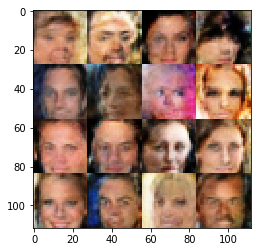

Epoch 2/8... Discriminator Loss: 1.1779 ... Generator Loss: 1.0483
Epoch 2/8... Discriminator Loss: 1.6012 ... Generator Loss: 1.7380
Epoch 2/8... Discriminator Loss: 1.1441 ... Generator Loss: 0.9807
Epoch 2/8... Discriminator Loss: 1.1315 ... Generator Loss: 0.7795
Epoch 2/8... Discriminator Loss: 1.4102 ... Generator Loss: 0.4820
Epoch 2/8... Discriminator Loss: 1.0128 ... Generator Loss: 0.9523
Epoch 2/8... Discriminator Loss: 2.5720 ... Generator Loss: 0.1887
Epoch 2/8... Discriminator Loss: 1.1351 ... Generator Loss: 0.7394
Epoch 2/8... Discriminator Loss: 1.2492 ... Generator Loss: 1.2891
Epoch 2/8... Discriminator Loss: 1.0895 ... Generator Loss: 1.1385


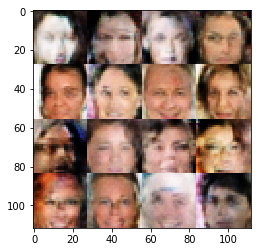

Epoch 2/8... Discriminator Loss: 1.1155 ... Generator Loss: 0.7232
Epoch 2/8... Discriminator Loss: 1.3407 ... Generator Loss: 0.5432
Epoch 2/8... Discriminator Loss: 1.1562 ... Generator Loss: 1.3590
Epoch 2/8... Discriminator Loss: 0.8795 ... Generator Loss: 1.5252
Epoch 2/8... Discriminator Loss: 1.4519 ... Generator Loss: 0.4057
Epoch 2/8... Discriminator Loss: 1.0761 ... Generator Loss: 0.6503
Epoch 2/8... Discriminator Loss: 1.1416 ... Generator Loss: 0.8890
Epoch 2/8... Discriminator Loss: 1.5566 ... Generator Loss: 0.6138
Epoch 2/8... Discriminator Loss: 1.0339 ... Generator Loss: 1.4121
Epoch 2/8... Discriminator Loss: 1.1253 ... Generator Loss: 0.6375


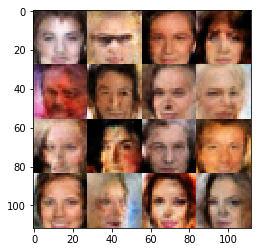

Epoch 2/8... Discriminator Loss: 1.0349 ... Generator Loss: 0.9474
Epoch 2/8... Discriminator Loss: 1.3761 ... Generator Loss: 0.5437
Epoch 2/8... Discriminator Loss: 1.0553 ... Generator Loss: 0.9636
Epoch 2/8... Discriminator Loss: 1.1640 ... Generator Loss: 0.8624
Epoch 2/8... Discriminator Loss: 0.9701 ... Generator Loss: 0.7768
Epoch 2/8... Discriminator Loss: 1.2339 ... Generator Loss: 1.0995
Epoch 2/8... Discriminator Loss: 1.3291 ... Generator Loss: 0.8360
Epoch 2/8... Discriminator Loss: 1.3125 ... Generator Loss: 0.5166
Epoch 2/8... Discriminator Loss: 0.7262 ... Generator Loss: 1.3890
Epoch 2/8... Discriminator Loss: 1.1972 ... Generator Loss: 0.8750


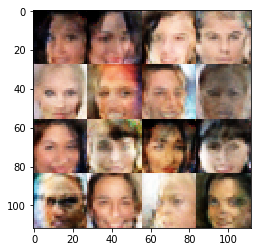

Epoch 2/8... Discriminator Loss: 1.1088 ... Generator Loss: 0.6662
Epoch 2/8... Discriminator Loss: 1.6828 ... Generator Loss: 0.3791
Epoch 2/8... Discriminator Loss: 1.1350 ... Generator Loss: 0.6725
Epoch 2/8... Discriminator Loss: 1.5470 ... Generator Loss: 1.7049
Epoch 2/8... Discriminator Loss: 1.2923 ... Generator Loss: 0.5783
Epoch 2/8... Discriminator Loss: 1.7319 ... Generator Loss: 1.8906
Epoch 2/8... Discriminator Loss: 0.8436 ... Generator Loss: 0.9209
Epoch 2/8... Discriminator Loss: 0.9913 ... Generator Loss: 1.0564
Epoch 2/8... Discriminator Loss: 1.1381 ... Generator Loss: 0.8574
Epoch 2/8... Discriminator Loss: 1.4875 ... Generator Loss: 2.0180


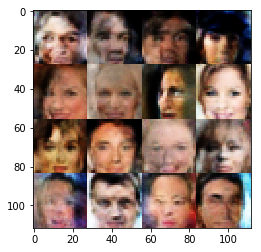

Epoch 2/8... Discriminator Loss: 1.3977 ... Generator Loss: 1.9623
Epoch 2/8... Discriminator Loss: 1.1629 ... Generator Loss: 1.3339
Epoch 2/8... Discriminator Loss: 0.8229 ... Generator Loss: 1.0815
Epoch 2/8... Discriminator Loss: 0.8116 ... Generator Loss: 0.9084
Epoch 2/8... Discriminator Loss: 1.2701 ... Generator Loss: 0.6912
Epoch 2/8... Discriminator Loss: 1.2066 ... Generator Loss: 1.0087
Epoch 2/8... Discriminator Loss: 0.7215 ... Generator Loss: 1.0301
Epoch 2/8... Discriminator Loss: 1.2532 ... Generator Loss: 1.1798
Epoch 2/8... Discriminator Loss: 1.5431 ... Generator Loss: 0.4410
Epoch 2/8... Discriminator Loss: 1.5935 ... Generator Loss: 0.3822


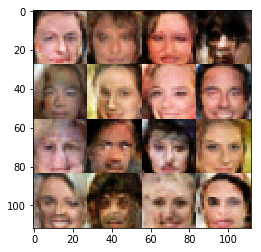

Epoch 2/8... Discriminator Loss: 1.3090 ... Generator Loss: 0.6284
Epoch 2/8... Discriminator Loss: 1.5238 ... Generator Loss: 0.3872
Epoch 2/8... Discriminator Loss: 0.8142 ... Generator Loss: 1.4136
Epoch 2/8... Discriminator Loss: 1.2241 ... Generator Loss: 1.1226
Epoch 2/8... Discriminator Loss: 1.5998 ... Generator Loss: 0.5239
Epoch 2/8... Discriminator Loss: 1.3068 ... Generator Loss: 0.6245
Epoch 2/8... Discriminator Loss: 1.4367 ... Generator Loss: 1.3165
Epoch 2/8... Discriminator Loss: 1.1965 ... Generator Loss: 1.0735
Epoch 2/8... Discriminator Loss: 1.1808 ... Generator Loss: 0.6481
Epoch 2/8... Discriminator Loss: 1.1538 ... Generator Loss: 0.7651


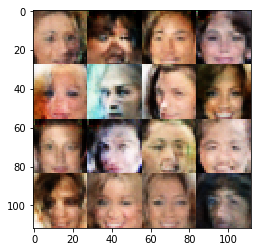

Epoch 2/8... Discriminator Loss: 1.0643 ... Generator Loss: 0.8192
Epoch 2/8... Discriminator Loss: 1.3056 ... Generator Loss: 1.7548
Epoch 2/8... Discriminator Loss: 1.2197 ... Generator Loss: 0.6045
Epoch 2/8... Discriminator Loss: 1.4438 ... Generator Loss: 0.4601
Epoch 2/8... Discriminator Loss: 1.2398 ... Generator Loss: 0.5730
Epoch 2/8... Discriminator Loss: 1.0257 ... Generator Loss: 0.9598
Epoch 2/8... Discriminator Loss: 1.2822 ... Generator Loss: 1.1130
Epoch 2/8... Discriminator Loss: 1.6545 ... Generator Loss: 0.3805
Epoch 2/8... Discriminator Loss: 0.9156 ... Generator Loss: 0.9948
Epoch 2/8... Discriminator Loss: 1.2677 ... Generator Loss: 0.6018


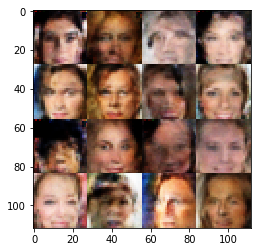

Epoch 2/8... Discriminator Loss: 1.2252 ... Generator Loss: 1.4112
Epoch 2/8... Discriminator Loss: 1.0336 ... Generator Loss: 2.0155
Epoch 2/8... Discriminator Loss: 1.0676 ... Generator Loss: 1.3162
Epoch 2/8... Discriminator Loss: 0.9999 ... Generator Loss: 1.0916
Epoch 2/8... Discriminator Loss: 1.2170 ... Generator Loss: 0.9766
Epoch 2/8... Discriminator Loss: 1.1656 ... Generator Loss: 0.7038
Epoch 2/8... Discriminator Loss: 0.8735 ... Generator Loss: 0.9685
Epoch 2/8... Discriminator Loss: 1.2338 ... Generator Loss: 0.7595
Epoch 2/8... Discriminator Loss: 1.2468 ... Generator Loss: 0.6413
Epoch 2/8... Discriminator Loss: 1.5868 ... Generator Loss: 0.4046


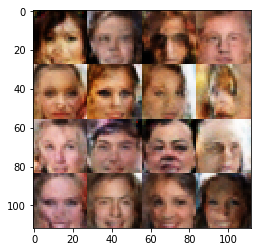

Epoch 2/8... Discriminator Loss: 1.0906 ... Generator Loss: 0.5852
Epoch 2/8... Discriminator Loss: 1.3107 ... Generator Loss: 0.5564
Epoch 2/8... Discriminator Loss: 1.1792 ... Generator Loss: 1.3311
Epoch 2/8... Discriminator Loss: 0.9529 ... Generator Loss: 1.0435
Epoch 2/8... Discriminator Loss: 1.6295 ... Generator Loss: 2.1788
Epoch 2/8... Discriminator Loss: 1.2515 ... Generator Loss: 0.6541
Epoch 2/8... Discriminator Loss: 0.9934 ... Generator Loss: 0.9420
Epoch 2/8... Discriminator Loss: 0.8451 ... Generator Loss: 1.1255
Epoch 2/8... Discriminator Loss: 1.4697 ... Generator Loss: 0.5140
Epoch 2/8... Discriminator Loss: 1.2805 ... Generator Loss: 0.7134


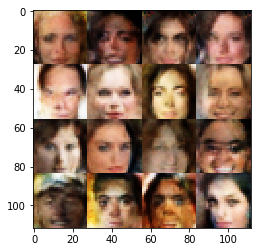

Epoch 2/8... Discriminator Loss: 1.1073 ... Generator Loss: 0.7584
Epoch 2/8... Discriminator Loss: 1.7841 ... Generator Loss: 0.3339
Epoch 2/8... Discriminator Loss: 1.2838 ... Generator Loss: 0.5671
Epoch 2/8... Discriminator Loss: 0.8555 ... Generator Loss: 1.1636
Epoch 2/8... Discriminator Loss: 1.0320 ... Generator Loss: 1.1669
Epoch 2/8... Discriminator Loss: 1.3841 ... Generator Loss: 1.1455
Epoch 2/8... Discriminator Loss: 0.7144 ... Generator Loss: 1.6786
Epoch 2/8... Discriminator Loss: 1.2121 ... Generator Loss: 1.4361
Epoch 2/8... Discriminator Loss: 0.8351 ... Generator Loss: 1.7928
Epoch 2/8... Discriminator Loss: 1.2813 ... Generator Loss: 1.4743


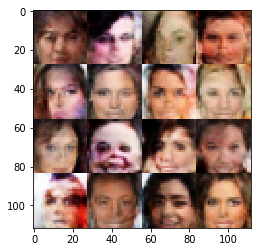

Epoch 2/8... Discriminator Loss: 1.3706 ... Generator Loss: 1.0631
Epoch 2/8... Discriminator Loss: 1.1071 ... Generator Loss: 0.7541
Epoch 2/8... Discriminator Loss: 1.3759 ... Generator Loss: 1.4076
Epoch 2/8... Discriminator Loss: 1.2896 ... Generator Loss: 0.5657
Epoch 2/8... Discriminator Loss: 1.1200 ... Generator Loss: 1.0517
Epoch 2/8... Discriminator Loss: 1.3340 ... Generator Loss: 1.3338
Epoch 2/8... Discriminator Loss: 1.0392 ... Generator Loss: 1.0237
Epoch 2/8... Discriminator Loss: 1.2146 ... Generator Loss: 0.6177
Epoch 2/8... Discriminator Loss: 1.1442 ... Generator Loss: 0.8023
Epoch 2/8... Discriminator Loss: 1.2173 ... Generator Loss: 1.0558


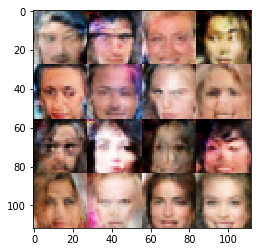

Epoch 2/8... Discriminator Loss: 1.3891 ... Generator Loss: 0.4710
Epoch 2/8... Discriminator Loss: 1.4037 ... Generator Loss: 0.4779
Epoch 2/8... Discriminator Loss: 0.9061 ... Generator Loss: 0.9898
Epoch 2/8... Discriminator Loss: 1.1630 ... Generator Loss: 1.2655
Epoch 2/8... Discriminator Loss: 1.1668 ... Generator Loss: 0.9776
Epoch 2/8... Discriminator Loss: 1.3377 ... Generator Loss: 0.5023
Epoch 2/8... Discriminator Loss: 1.0541 ... Generator Loss: 0.7861
Epoch 2/8... Discriminator Loss: 1.1816 ... Generator Loss: 0.6363
Epoch 2/8... Discriminator Loss: 1.4127 ... Generator Loss: 1.3024
Epoch 2/8... Discriminator Loss: 1.1553 ... Generator Loss: 0.8507


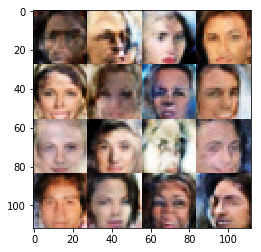

Epoch 2/8... Discriminator Loss: 1.0402 ... Generator Loss: 1.7811
Epoch 2/8... Discriminator Loss: 1.1857 ... Generator Loss: 0.7203
Epoch 2/8... Discriminator Loss: 0.6467 ... Generator Loss: 1.7552
Epoch 2/8... Discriminator Loss: 1.4849 ... Generator Loss: 0.4578
Epoch 2/8... Discriminator Loss: 1.0478 ... Generator Loss: 1.1858
Epoch 2/8... Discriminator Loss: 1.1361 ... Generator Loss: 1.0725
Epoch 2/8... Discriminator Loss: 1.3588 ... Generator Loss: 1.4752
Epoch 2/8... Discriminator Loss: 1.1754 ... Generator Loss: 0.7780
Epoch 2/8... Discriminator Loss: 1.6456 ... Generator Loss: 1.6187
Epoch 2/8... Discriminator Loss: 1.1903 ... Generator Loss: 0.6977


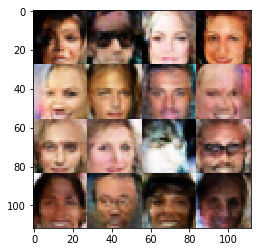

Epoch 2/8... Discriminator Loss: 1.5159 ... Generator Loss: 0.3641
Epoch 2/8... Discriminator Loss: 0.7213 ... Generator Loss: 2.1783
Epoch 2/8... Discriminator Loss: 1.4713 ... Generator Loss: 1.1415
Epoch 2/8... Discriminator Loss: 0.9039 ... Generator Loss: 2.1417
Epoch 2/8... Discriminator Loss: 1.2672 ... Generator Loss: 1.3314
Epoch 2/8... Discriminator Loss: 1.4244 ... Generator Loss: 0.5277
Epoch 2/8... Discriminator Loss: 0.8855 ... Generator Loss: 1.6871
Epoch 2/8... Discriminator Loss: 1.9041 ... Generator Loss: 0.3141
Epoch 2/8... Discriminator Loss: 0.9641 ... Generator Loss: 1.1992
Epoch 2/8... Discriminator Loss: 1.5529 ... Generator Loss: 1.2430


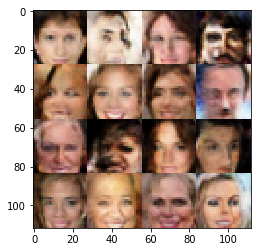

Epoch 2/8... Discriminator Loss: 1.1766 ... Generator Loss: 1.2430
Epoch 2/8... Discriminator Loss: 1.2143 ... Generator Loss: 0.7192
Epoch 2/8... Discriminator Loss: 1.2185 ... Generator Loss: 0.7180
Epoch 2/8... Discriminator Loss: 1.0137 ... Generator Loss: 1.1937
Epoch 2/8... Discriminator Loss: 1.4200 ... Generator Loss: 1.1238
Epoch 2/8... Discriminator Loss: 0.8395 ... Generator Loss: 1.2478
Epoch 2/8... Discriminator Loss: 1.2360 ... Generator Loss: 1.0869
Epoch 2/8... Discriminator Loss: 0.8792 ... Generator Loss: 1.0413
Epoch 2/8... Discriminator Loss: 1.3046 ... Generator Loss: 0.6984
Epoch 2/8... Discriminator Loss: 1.6759 ... Generator Loss: 1.7068


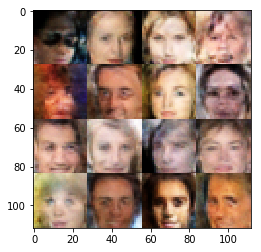

Epoch 2/8... Discriminator Loss: 1.4724 ... Generator Loss: 1.2827
Epoch 2/8... Discriminator Loss: 1.2360 ... Generator Loss: 0.7642
Epoch 2/8... Discriminator Loss: 0.9252 ... Generator Loss: 1.6465
Epoch 2/8... Discriminator Loss: 1.1953 ... Generator Loss: 1.1502
Epoch 2/8... Discriminator Loss: 1.2841 ... Generator Loss: 1.0348
Epoch 2/8... Discriminator Loss: 0.9229 ... Generator Loss: 1.0541
Epoch 2/8... Discriminator Loss: 1.0993 ... Generator Loss: 1.2396
Epoch 2/8... Discriminator Loss: 1.3197 ... Generator Loss: 1.7698
Epoch 2/8... Discriminator Loss: 1.3436 ... Generator Loss: 1.0855
Epoch 2/8... Discriminator Loss: 1.1680 ... Generator Loss: 1.4211


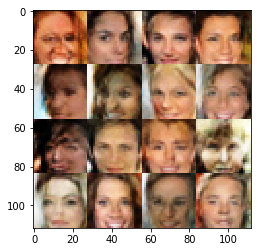

Epoch 2/8... Discriminator Loss: 1.0205 ... Generator Loss: 0.7627
Epoch 2/8... Discriminator Loss: 1.1070 ... Generator Loss: 0.6695
Epoch 2/8... Discriminator Loss: 0.8080 ... Generator Loss: 1.3236
Epoch 2/8... Discriminator Loss: 1.5995 ... Generator Loss: 2.5242
Epoch 2/8... Discriminator Loss: 1.2568 ... Generator Loss: 0.8038
Epoch 2/8... Discriminator Loss: 1.2006 ... Generator Loss: 0.5929
Epoch 2/8... Discriminator Loss: 1.3728 ... Generator Loss: 0.5314
Epoch 2/8... Discriminator Loss: 0.5395 ... Generator Loss: 1.8045
Epoch 2/8... Discriminator Loss: 1.0429 ... Generator Loss: 1.3089
Epoch 2/8... Discriminator Loss: 1.0540 ... Generator Loss: 0.7647


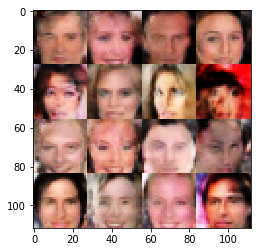

Epoch 2/8... Discriminator Loss: 0.5910 ... Generator Loss: 1.5300
Epoch 2/8... Discriminator Loss: 1.2433 ... Generator Loss: 1.3146
Epoch 2/8... Discriminator Loss: 1.3085 ... Generator Loss: 0.5613
Epoch 2/8... Discriminator Loss: 1.4538 ... Generator Loss: 1.3178
Epoch 2/8... Discriminator Loss: 1.9827 ... Generator Loss: 2.4987
Epoch 2/8... Discriminator Loss: 1.1924 ... Generator Loss: 0.9259
Epoch 2/8... Discriminator Loss: 1.0519 ... Generator Loss: 0.8473
Epoch 2/8... Discriminator Loss: 0.8474 ... Generator Loss: 1.1196
Epoch 2/8... Discriminator Loss: 1.1598 ... Generator Loss: 0.7263
Epoch 2/8... Discriminator Loss: 1.2891 ... Generator Loss: 0.5555


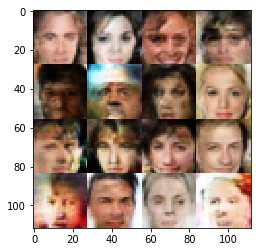

Epoch 2/8... Discriminator Loss: 1.2834 ... Generator Loss: 0.5149
Epoch 2/8... Discriminator Loss: 1.3924 ... Generator Loss: 0.4867
Epoch 2/8... Discriminator Loss: 1.2292 ... Generator Loss: 0.9755


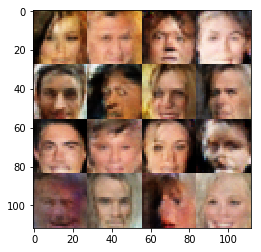

Epoch 3/8... Discriminator Loss: 0.8427 ... Generator Loss: 0.9989
Epoch 3/8... Discriminator Loss: 1.7232 ... Generator Loss: 1.7063
Epoch 3/8... Discriminator Loss: 1.2319 ... Generator Loss: 0.9200
Epoch 3/8... Discriminator Loss: 1.6530 ... Generator Loss: 0.4155
Epoch 3/8... Discriminator Loss: 0.8688 ... Generator Loss: 1.1575
Epoch 3/8... Discriminator Loss: 0.8977 ... Generator Loss: 1.2916
Epoch 3/8... Discriminator Loss: 0.7743 ... Generator Loss: 1.2560


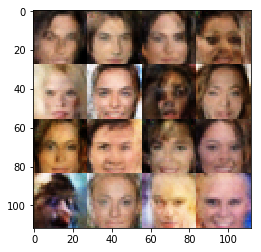

Epoch 3/8... Discriminator Loss: 1.5201 ... Generator Loss: 1.3903
Epoch 3/8... Discriminator Loss: 1.2336 ... Generator Loss: 0.8075
Epoch 3/8... Discriminator Loss: 1.4292 ... Generator Loss: 0.7085
Epoch 3/8... Discriminator Loss: 1.2313 ... Generator Loss: 0.6752
Epoch 3/8... Discriminator Loss: 1.3994 ... Generator Loss: 0.8424
Epoch 3/8... Discriminator Loss: 1.1809 ... Generator Loss: 0.9366
Epoch 3/8... Discriminator Loss: 1.1989 ... Generator Loss: 1.2041
Epoch 3/8... Discriminator Loss: 1.3023 ... Generator Loss: 0.5026
Epoch 3/8... Discriminator Loss: 1.2357 ... Generator Loss: 0.7186
Epoch 3/8... Discriminator Loss: 0.6384 ... Generator Loss: 1.9042


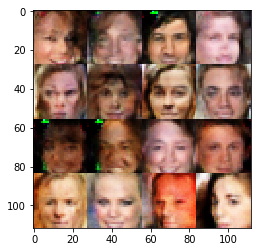

Epoch 3/8... Discriminator Loss: 1.4385 ... Generator Loss: 2.1880
Epoch 3/8... Discriminator Loss: 1.2058 ... Generator Loss: 1.6116
Epoch 3/8... Discriminator Loss: 1.1835 ... Generator Loss: 0.9417
Epoch 3/8... Discriminator Loss: 1.0148 ... Generator Loss: 1.0805
Epoch 3/8... Discriminator Loss: 1.5446 ... Generator Loss: 1.3662
Epoch 3/8... Discriminator Loss: 0.8172 ... Generator Loss: 1.1741
Epoch 3/8... Discriminator Loss: 0.8174 ... Generator Loss: 1.2909
Epoch 3/8... Discriminator Loss: 0.9376 ... Generator Loss: 1.2951
Epoch 3/8... Discriminator Loss: 1.5786 ... Generator Loss: 0.3926
Epoch 3/8... Discriminator Loss: 1.2090 ... Generator Loss: 1.1838


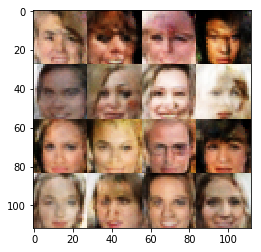

Epoch 3/8... Discriminator Loss: 1.2634 ... Generator Loss: 1.0048
Epoch 3/8... Discriminator Loss: 0.9784 ... Generator Loss: 1.1229
Epoch 3/8... Discriminator Loss: 1.3321 ... Generator Loss: 1.2370
Epoch 3/8... Discriminator Loss: 1.1808 ... Generator Loss: 0.8909
Epoch 3/8... Discriminator Loss: 1.3759 ... Generator Loss: 0.5017
Epoch 3/8... Discriminator Loss: 1.2898 ... Generator Loss: 0.9134
Epoch 3/8... Discriminator Loss: 1.2871 ... Generator Loss: 1.1092
Epoch 3/8... Discriminator Loss: 1.9125 ... Generator Loss: 0.2728
Epoch 3/8... Discriminator Loss: 1.4081 ... Generator Loss: 1.0375
Epoch 3/8... Discriminator Loss: 0.9270 ... Generator Loss: 1.2660


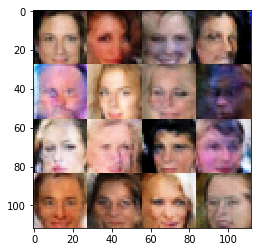

Epoch 3/8... Discriminator Loss: 0.8739 ... Generator Loss: 1.2043
Epoch 3/8... Discriminator Loss: 1.7520 ... Generator Loss: 2.0378
Epoch 3/8... Discriminator Loss: 1.1880 ... Generator Loss: 0.9480
Epoch 3/8... Discriminator Loss: 1.2495 ... Generator Loss: 1.1610
Epoch 3/8... Discriminator Loss: 1.0031 ... Generator Loss: 0.9727
Epoch 3/8... Discriminator Loss: 1.1759 ... Generator Loss: 0.7380
Epoch 3/8... Discriminator Loss: 1.5149 ... Generator Loss: 0.4063
Epoch 3/8... Discriminator Loss: 0.8439 ... Generator Loss: 1.1910
Epoch 3/8... Discriminator Loss: 1.4338 ... Generator Loss: 0.5118
Epoch 3/8... Discriminator Loss: 1.0852 ... Generator Loss: 0.7929


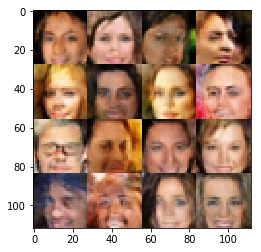

Epoch 3/8... Discriminator Loss: 1.3314 ... Generator Loss: 1.1399
Epoch 3/8... Discriminator Loss: 1.2703 ... Generator Loss: 1.0566
Epoch 3/8... Discriminator Loss: 1.2201 ... Generator Loss: 1.1705
Epoch 3/8... Discriminator Loss: 1.1797 ... Generator Loss: 0.9786
Epoch 3/8... Discriminator Loss: 1.2329 ... Generator Loss: 0.9582
Epoch 3/8... Discriminator Loss: 1.4914 ... Generator Loss: 1.2406
Epoch 3/8... Discriminator Loss: 1.2958 ... Generator Loss: 1.1952
Epoch 3/8... Discriminator Loss: 1.1129 ... Generator Loss: 1.3809
Epoch 3/8... Discriminator Loss: 1.4420 ... Generator Loss: 1.6287
Epoch 3/8... Discriminator Loss: 1.0660 ... Generator Loss: 0.9667


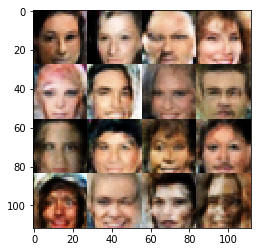

Epoch 3/8... Discriminator Loss: 1.3219 ... Generator Loss: 0.5717
Epoch 3/8... Discriminator Loss: 1.0575 ... Generator Loss: 1.2213
Epoch 3/8... Discriminator Loss: 1.2150 ... Generator Loss: 1.3293
Epoch 3/8... Discriminator Loss: 1.8246 ... Generator Loss: 1.8433
Epoch 3/8... Discriminator Loss: 1.2854 ... Generator Loss: 1.2631
Epoch 3/8... Discriminator Loss: 1.0774 ... Generator Loss: 1.1650
Epoch 3/8... Discriminator Loss: 1.3590 ... Generator Loss: 0.4985
Epoch 3/8... Discriminator Loss: 1.0786 ... Generator Loss: 0.8654
Epoch 3/8... Discriminator Loss: 1.0756 ... Generator Loss: 1.3056
Epoch 3/8... Discriminator Loss: 0.6988 ... Generator Loss: 1.5306


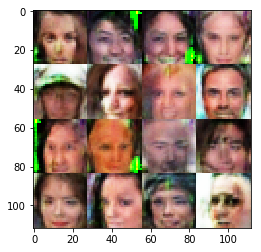

Epoch 3/8... Discriminator Loss: 0.3217 ... Generator Loss: 2.8586
Epoch 3/8... Discriminator Loss: 0.4406 ... Generator Loss: 1.8089
Epoch 3/8... Discriminator Loss: 0.9630 ... Generator Loss: 1.2156
Epoch 3/8... Discriminator Loss: 0.7894 ... Generator Loss: 1.9850
Epoch 3/8... Discriminator Loss: 0.3793 ... Generator Loss: 3.3837
Epoch 3/8... Discriminator Loss: 1.0362 ... Generator Loss: 1.1917
Epoch 3/8... Discriminator Loss: 1.1822 ... Generator Loss: 0.6193
Epoch 3/8... Discriminator Loss: 0.8061 ... Generator Loss: 1.2347
Epoch 3/8... Discriminator Loss: 1.5597 ... Generator Loss: 0.4128
Epoch 3/8... Discriminator Loss: 0.3758 ... Generator Loss: 2.3765


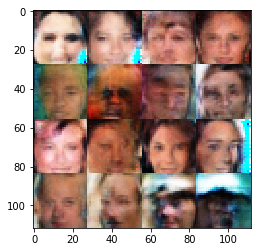

Epoch 3/8... Discriminator Loss: 0.3050 ... Generator Loss: 2.6559
Epoch 3/8... Discriminator Loss: 0.4494 ... Generator Loss: 2.4998
Epoch 3/8... Discriminator Loss: 0.8754 ... Generator Loss: 1.6492
Epoch 3/8... Discriminator Loss: 0.6791 ... Generator Loss: 2.2300
Epoch 3/8... Discriminator Loss: 1.0844 ... Generator Loss: 1.9573
Epoch 3/8... Discriminator Loss: 1.9417 ... Generator Loss: 2.3087
Epoch 3/8... Discriminator Loss: 1.2815 ... Generator Loss: 1.4949
Epoch 3/8... Discriminator Loss: 1.3267 ... Generator Loss: 1.4371
Epoch 3/8... Discriminator Loss: 1.4119 ... Generator Loss: 0.4836
Epoch 3/8... Discriminator Loss: 0.8439 ... Generator Loss: 1.0885


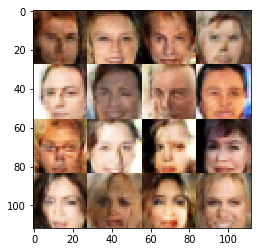

Epoch 3/8... Discriminator Loss: 0.8768 ... Generator Loss: 1.4666
Epoch 3/8... Discriminator Loss: 1.9660 ... Generator Loss: 0.3259
Epoch 3/8... Discriminator Loss: 0.9837 ... Generator Loss: 0.8488
Epoch 3/8... Discriminator Loss: 0.8133 ... Generator Loss: 1.9064
Epoch 3/8... Discriminator Loss: 0.9524 ... Generator Loss: 0.9310
Epoch 3/8... Discriminator Loss: 0.5020 ... Generator Loss: 1.9967
Epoch 3/8... Discriminator Loss: 0.9578 ... Generator Loss: 0.7640
Epoch 3/8... Discriminator Loss: 0.9261 ... Generator Loss: 1.0601
Epoch 3/8... Discriminator Loss: 0.8520 ... Generator Loss: 1.3082
Epoch 3/8... Discriminator Loss: 1.6615 ... Generator Loss: 0.5429


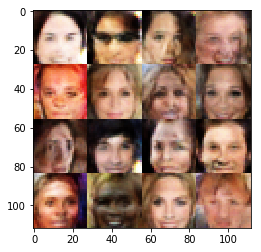

Epoch 3/8... Discriminator Loss: 0.8550 ... Generator Loss: 1.6112
Epoch 3/8... Discriminator Loss: 1.0725 ... Generator Loss: 0.7767
Epoch 3/8... Discriminator Loss: 0.9091 ... Generator Loss: 1.3175
Epoch 3/8... Discriminator Loss: 0.4287 ... Generator Loss: 2.2582
Epoch 3/8... Discriminator Loss: 0.8434 ... Generator Loss: 2.0898
Epoch 3/8... Discriminator Loss: 1.1222 ... Generator Loss: 1.1001
Epoch 3/8... Discriminator Loss: 1.4671 ... Generator Loss: 0.4538
Epoch 3/8... Discriminator Loss: 1.7239 ... Generator Loss: 0.3442
Epoch 3/8... Discriminator Loss: 0.5331 ... Generator Loss: 2.2230
Epoch 3/8... Discriminator Loss: 0.8549 ... Generator Loss: 0.8287


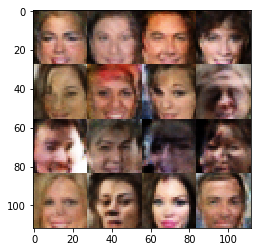

Epoch 3/8... Discriminator Loss: 1.3700 ... Generator Loss: 0.5183
Epoch 3/8... Discriminator Loss: 0.7875 ... Generator Loss: 2.5873
Epoch 3/8... Discriminator Loss: 1.2537 ... Generator Loss: 0.8789
Epoch 3/8... Discriminator Loss: 0.5599 ... Generator Loss: 1.5416
Epoch 3/8... Discriminator Loss: 2.2504 ... Generator Loss: 3.0537
Epoch 3/8... Discriminator Loss: 0.9920 ... Generator Loss: 0.8793
Epoch 3/8... Discriminator Loss: 0.9523 ... Generator Loss: 0.7732
Epoch 3/8... Discriminator Loss: 1.7074 ... Generator Loss: 0.3573
Epoch 3/8... Discriminator Loss: 0.3678 ... Generator Loss: 2.4659
Epoch 3/8... Discriminator Loss: 0.4098 ... Generator Loss: 2.5252


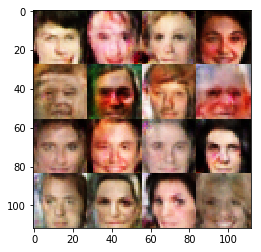

Epoch 3/8... Discriminator Loss: 0.4606 ... Generator Loss: 2.0101
Epoch 3/8... Discriminator Loss: 0.4526 ... Generator Loss: 2.8488
Epoch 3/8... Discriminator Loss: 0.5737 ... Generator Loss: 1.5297
Epoch 3/8... Discriminator Loss: 1.2546 ... Generator Loss: 0.9672
Epoch 3/8... Discriminator Loss: 1.1725 ... Generator Loss: 1.1140
Epoch 3/8... Discriminator Loss: 1.4788 ... Generator Loss: 0.5517
Epoch 3/8... Discriminator Loss: 1.4211 ... Generator Loss: 1.2486
Epoch 3/8... Discriminator Loss: 1.4271 ... Generator Loss: 1.8441
Epoch 3/8... Discriminator Loss: 1.1754 ... Generator Loss: 0.8431
Epoch 3/8... Discriminator Loss: 0.9245 ... Generator Loss: 1.6782


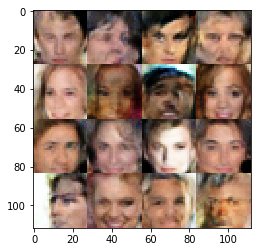

Epoch 3/8... Discriminator Loss: 1.3054 ... Generator Loss: 1.0095
Epoch 3/8... Discriminator Loss: 1.1679 ... Generator Loss: 0.9100
Epoch 3/8... Discriminator Loss: 1.1935 ... Generator Loss: 0.8986
Epoch 3/8... Discriminator Loss: 1.2838 ... Generator Loss: 0.8134
Epoch 3/8... Discriminator Loss: 1.3165 ... Generator Loss: 1.0227
Epoch 3/8... Discriminator Loss: 1.1695 ... Generator Loss: 0.6497
Epoch 3/8... Discriminator Loss: 1.3646 ... Generator Loss: 0.6932
Epoch 3/8... Discriminator Loss: 1.1857 ... Generator Loss: 0.7881
Epoch 3/8... Discriminator Loss: 1.1599 ... Generator Loss: 0.8928
Epoch 3/8... Discriminator Loss: 1.1784 ... Generator Loss: 0.7086


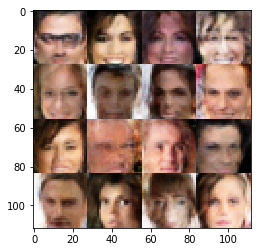

Epoch 3/8... Discriminator Loss: 1.0519 ... Generator Loss: 0.7730
Epoch 3/8... Discriminator Loss: 0.9834 ... Generator Loss: 1.1554
Epoch 3/8... Discriminator Loss: 1.1570 ... Generator Loss: 1.3927
Epoch 3/8... Discriminator Loss: 1.1597 ... Generator Loss: 0.9575
Epoch 3/8... Discriminator Loss: 1.2619 ... Generator Loss: 1.0999
Epoch 3/8... Discriminator Loss: 1.4716 ... Generator Loss: 0.4575
Epoch 3/8... Discriminator Loss: 1.2082 ... Generator Loss: 1.2172
Epoch 3/8... Discriminator Loss: 0.9191 ... Generator Loss: 0.9971
Epoch 3/8... Discriminator Loss: 1.5491 ... Generator Loss: 1.4024
Epoch 3/8... Discriminator Loss: 1.1984 ... Generator Loss: 0.8882


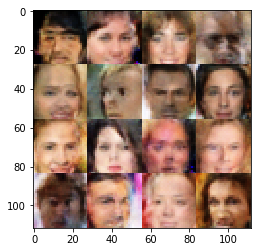

Epoch 3/8... Discriminator Loss: 1.3645 ... Generator Loss: 1.1953
Epoch 3/8... Discriminator Loss: 1.1708 ... Generator Loss: 0.8272
Epoch 3/8... Discriminator Loss: 0.8057 ... Generator Loss: 1.2493
Epoch 3/8... Discriminator Loss: 1.1607 ... Generator Loss: 1.6647
Epoch 3/8... Discriminator Loss: 1.1265 ... Generator Loss: 0.6996
Epoch 3/8... Discriminator Loss: 1.2773 ... Generator Loss: 0.6721
Epoch 3/8... Discriminator Loss: 1.1783 ... Generator Loss: 1.0885
Epoch 3/8... Discriminator Loss: 1.4738 ... Generator Loss: 2.3936
Epoch 3/8... Discriminator Loss: 1.3196 ... Generator Loss: 0.6161
Epoch 3/8... Discriminator Loss: 1.2603 ... Generator Loss: 0.8853


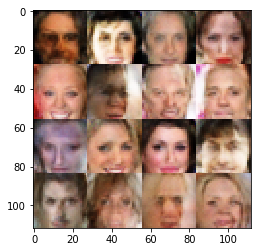

Epoch 3/8... Discriminator Loss: 1.3166 ... Generator Loss: 0.8316
Epoch 3/8... Discriminator Loss: 1.3221 ... Generator Loss: 0.5628
Epoch 3/8... Discriminator Loss: 1.0939 ... Generator Loss: 1.2215
Epoch 3/8... Discriminator Loss: 1.2754 ... Generator Loss: 1.2719
Epoch 3/8... Discriminator Loss: 1.5510 ... Generator Loss: 1.5883
Epoch 3/8... Discriminator Loss: 0.9777 ... Generator Loss: 1.4701
Epoch 3/8... Discriminator Loss: 1.2497 ... Generator Loss: 0.6232
Epoch 3/8... Discriminator Loss: 1.3336 ... Generator Loss: 0.5692
Epoch 3/8... Discriminator Loss: 1.1236 ... Generator Loss: 0.8129
Epoch 3/8... Discriminator Loss: 1.3281 ... Generator Loss: 0.8706


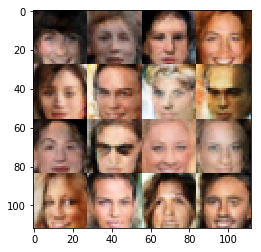

Epoch 3/8... Discriminator Loss: 1.3408 ... Generator Loss: 0.5367
Epoch 3/8... Discriminator Loss: 1.2815 ... Generator Loss: 0.6165
Epoch 3/8... Discriminator Loss: 1.2736 ... Generator Loss: 0.6931
Epoch 3/8... Discriminator Loss: 1.1334 ... Generator Loss: 0.8928
Epoch 3/8... Discriminator Loss: 1.4828 ... Generator Loss: 0.4130
Epoch 3/8... Discriminator Loss: 1.6657 ... Generator Loss: 0.4526
Epoch 3/8... Discriminator Loss: 1.2272 ... Generator Loss: 0.7358
Epoch 3/8... Discriminator Loss: 1.1756 ... Generator Loss: 0.7190
Epoch 3/8... Discriminator Loss: 1.2693 ... Generator Loss: 0.5127
Epoch 3/8... Discriminator Loss: 1.3114 ... Generator Loss: 1.3421


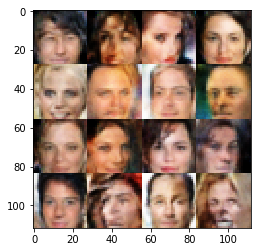

Epoch 3/8... Discriminator Loss: 1.1988 ... Generator Loss: 0.8979
Epoch 3/8... Discriminator Loss: 1.2922 ... Generator Loss: 0.6146
Epoch 3/8... Discriminator Loss: 1.3581 ... Generator Loss: 1.3811
Epoch 3/8... Discriminator Loss: 1.2638 ... Generator Loss: 0.7686
Epoch 3/8... Discriminator Loss: 1.0746 ... Generator Loss: 0.5895
Epoch 3/8... Discriminator Loss: 1.2280 ... Generator Loss: 1.2292
Epoch 3/8... Discriminator Loss: 1.0270 ... Generator Loss: 0.8952
Epoch 3/8... Discriminator Loss: 1.2284 ... Generator Loss: 0.6151
Epoch 3/8... Discriminator Loss: 1.1337 ... Generator Loss: 1.2827
Epoch 3/8... Discriminator Loss: 1.3306 ... Generator Loss: 0.8541


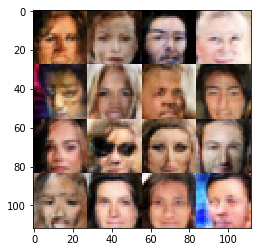

Epoch 3/8... Discriminator Loss: 1.0831 ... Generator Loss: 0.9817
Epoch 3/8... Discriminator Loss: 1.4369 ... Generator Loss: 1.3817
Epoch 3/8... Discriminator Loss: 1.1436 ... Generator Loss: 1.1433
Epoch 3/8... Discriminator Loss: 0.9670 ... Generator Loss: 1.6751
Epoch 3/8... Discriminator Loss: 1.2869 ... Generator Loss: 0.7837
Epoch 3/8... Discriminator Loss: 1.2561 ... Generator Loss: 0.6870
Epoch 3/8... Discriminator Loss: 0.9775 ... Generator Loss: 1.0975
Epoch 3/8... Discriminator Loss: 1.3074 ... Generator Loss: 0.5849
Epoch 3/8... Discriminator Loss: 0.9848 ... Generator Loss: 1.0404
Epoch 3/8... Discriminator Loss: 1.2630 ... Generator Loss: 0.5537


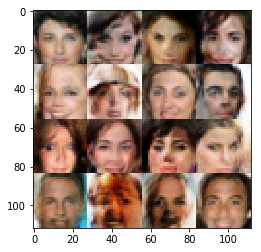

Epoch 3/8... Discriminator Loss: 1.1156 ... Generator Loss: 0.9860
Epoch 3/8... Discriminator Loss: 1.2894 ... Generator Loss: 0.9432
Epoch 3/8... Discriminator Loss: 1.3203 ... Generator Loss: 0.9863
Epoch 3/8... Discriminator Loss: 1.1917 ... Generator Loss: 1.0820
Epoch 3/8... Discriminator Loss: 1.1523 ... Generator Loss: 1.2029
Epoch 3/8... Discriminator Loss: 1.4655 ... Generator Loss: 0.4884
Epoch 3/8... Discriminator Loss: 1.5135 ... Generator Loss: 0.4493
Epoch 3/8... Discriminator Loss: 1.1593 ... Generator Loss: 0.7245
Epoch 3/8... Discriminator Loss: 1.2103 ... Generator Loss: 1.0132
Epoch 3/8... Discriminator Loss: 1.2804 ... Generator Loss: 0.5795


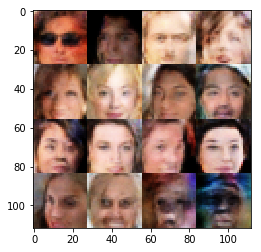

Epoch 3/8... Discriminator Loss: 1.4002 ... Generator Loss: 1.2902
Epoch 3/8... Discriminator Loss: 1.0617 ... Generator Loss: 1.1127
Epoch 3/8... Discriminator Loss: 1.2594 ... Generator Loss: 1.0924
Epoch 3/8... Discriminator Loss: 1.0750 ... Generator Loss: 1.5897
Epoch 3/8... Discriminator Loss: 1.0737 ... Generator Loss: 0.8266
Epoch 3/8... Discriminator Loss: 1.2489 ... Generator Loss: 0.6716
Epoch 3/8... Discriminator Loss: 1.4509 ... Generator Loss: 1.3784
Epoch 3/8... Discriminator Loss: 1.2491 ... Generator Loss: 0.6376
Epoch 3/8... Discriminator Loss: 1.1982 ... Generator Loss: 0.6585
Epoch 3/8... Discriminator Loss: 1.0548 ... Generator Loss: 0.7811


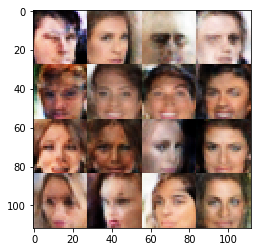

Epoch 3/8... Discriminator Loss: 1.3326 ... Generator Loss: 1.2922
Epoch 3/8... Discriminator Loss: 1.2166 ... Generator Loss: 0.6832
Epoch 3/8... Discriminator Loss: 1.2190 ... Generator Loss: 0.8110
Epoch 3/8... Discriminator Loss: 1.2349 ... Generator Loss: 0.6936
Epoch 3/8... Discriminator Loss: 1.2379 ... Generator Loss: 0.7350
Epoch 3/8... Discriminator Loss: 1.0379 ... Generator Loss: 1.1029
Epoch 3/8... Discriminator Loss: 1.2555 ... Generator Loss: 0.5217
Epoch 3/8... Discriminator Loss: 1.3185 ... Generator Loss: 0.5007
Epoch 3/8... Discriminator Loss: 1.2898 ... Generator Loss: 0.7974
Epoch 3/8... Discriminator Loss: 1.2152 ... Generator Loss: 1.1009


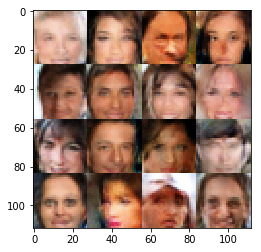

Epoch 3/8... Discriminator Loss: 1.3387 ... Generator Loss: 0.5609
Epoch 3/8... Discriminator Loss: 0.8878 ... Generator Loss: 1.8302
Epoch 3/8... Discriminator Loss: 1.2624 ... Generator Loss: 0.7237
Epoch 3/8... Discriminator Loss: 1.1821 ... Generator Loss: 0.7351
Epoch 3/8... Discriminator Loss: 1.2541 ... Generator Loss: 0.9690
Epoch 3/8... Discriminator Loss: 0.9488 ... Generator Loss: 1.0826
Epoch 3/8... Discriminator Loss: 1.4730 ... Generator Loss: 1.4516
Epoch 3/8... Discriminator Loss: 1.4661 ... Generator Loss: 0.4781
Epoch 3/8... Discriminator Loss: 1.1915 ... Generator Loss: 0.7204
Epoch 3/8... Discriminator Loss: 1.2718 ... Generator Loss: 0.5770


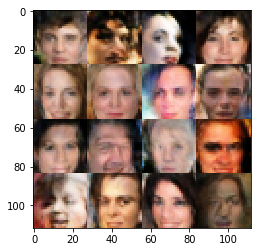

Epoch 3/8... Discriminator Loss: 0.9952 ... Generator Loss: 0.8829
Epoch 3/8... Discriminator Loss: 1.2147 ... Generator Loss: 0.6110
Epoch 3/8... Discriminator Loss: 1.2376 ... Generator Loss: 0.6461
Epoch 3/8... Discriminator Loss: 1.2263 ... Generator Loss: 0.7631
Epoch 3/8... Discriminator Loss: 1.3193 ... Generator Loss: 0.5661
Epoch 3/8... Discriminator Loss: 1.5132 ... Generator Loss: 1.4712
Epoch 3/8... Discriminator Loss: 1.1297 ... Generator Loss: 0.7847
Epoch 3/8... Discriminator Loss: 1.3398 ... Generator Loss: 0.5866
Epoch 3/8... Discriminator Loss: 1.3282 ... Generator Loss: 0.9078
Epoch 3/8... Discriminator Loss: 1.3065 ... Generator Loss: 0.9201


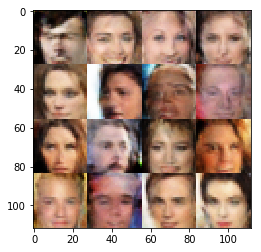

Epoch 3/8... Discriminator Loss: 1.3253 ... Generator Loss: 1.3493
Epoch 3/8... Discriminator Loss: 1.0651 ... Generator Loss: 0.7853
Epoch 3/8... Discriminator Loss: 1.2715 ... Generator Loss: 0.9494
Epoch 3/8... Discriminator Loss: 1.1188 ... Generator Loss: 0.8194
Epoch 3/8... Discriminator Loss: 1.2789 ... Generator Loss: 0.6329
Epoch 3/8... Discriminator Loss: 1.1957 ... Generator Loss: 0.7286
Epoch 3/8... Discriminator Loss: 1.3479 ... Generator Loss: 1.0166
Epoch 3/8... Discriminator Loss: 1.4727 ... Generator Loss: 1.1289
Epoch 3/8... Discriminator Loss: 1.0981 ... Generator Loss: 0.9113
Epoch 3/8... Discriminator Loss: 1.3560 ... Generator Loss: 1.0624


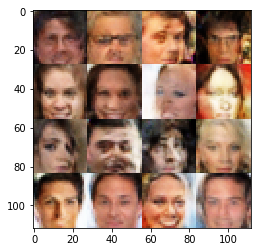

Epoch 3/8... Discriminator Loss: 0.9936 ... Generator Loss: 1.1291
Epoch 3/8... Discriminator Loss: 1.0887 ... Generator Loss: 1.1851
Epoch 3/8... Discriminator Loss: 1.2252 ... Generator Loss: 1.1399
Epoch 3/8... Discriminator Loss: 1.4038 ... Generator Loss: 1.2880
Epoch 3/8... Discriminator Loss: 1.2417 ... Generator Loss: 0.7014
Epoch 3/8... Discriminator Loss: 1.2072 ... Generator Loss: 0.7557
Epoch 3/8... Discriminator Loss: 1.3678 ... Generator Loss: 0.6353
Epoch 3/8... Discriminator Loss: 1.2077 ... Generator Loss: 1.0338
Epoch 3/8... Discriminator Loss: 1.4763 ... Generator Loss: 0.9645
Epoch 3/8... Discriminator Loss: 1.1905 ... Generator Loss: 0.9935


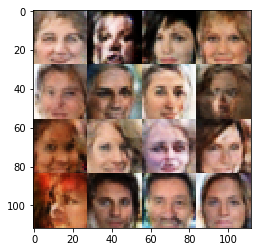

Epoch 3/8... Discriminator Loss: 1.2673 ... Generator Loss: 0.9218
Epoch 3/8... Discriminator Loss: 1.0389 ... Generator Loss: 1.0902
Epoch 3/8... Discriminator Loss: 1.3487 ... Generator Loss: 0.9935
Epoch 3/8... Discriminator Loss: 1.1577 ... Generator Loss: 1.0574
Epoch 3/8... Discriminator Loss: 1.2813 ... Generator Loss: 0.8143
Epoch 3/8... Discriminator Loss: 1.3231 ... Generator Loss: 0.5215
Epoch 3/8... Discriminator Loss: 1.0430 ... Generator Loss: 0.8224
Epoch 3/8... Discriminator Loss: 1.0885 ... Generator Loss: 0.7390
Epoch 3/8... Discriminator Loss: 0.9484 ... Generator Loss: 1.1241
Epoch 3/8... Discriminator Loss: 1.2159 ... Generator Loss: 0.7905


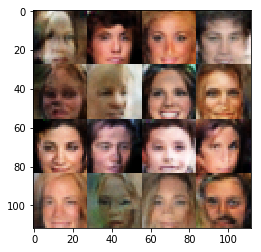

Epoch 3/8... Discriminator Loss: 1.2881 ... Generator Loss: 0.5952
Epoch 3/8... Discriminator Loss: 1.2347 ... Generator Loss: 0.5910
Epoch 3/8... Discriminator Loss: 1.3186 ... Generator Loss: 0.5527
Epoch 3/8... Discriminator Loss: 1.1686 ... Generator Loss: 0.9463
Epoch 3/8... Discriminator Loss: 1.3752 ... Generator Loss: 1.4113
Epoch 3/8... Discriminator Loss: 1.2671 ... Generator Loss: 0.8331
Epoch 3/8... Discriminator Loss: 1.3566 ... Generator Loss: 0.5298
Epoch 3/8... Discriminator Loss: 1.2293 ... Generator Loss: 0.8365
Epoch 3/8... Discriminator Loss: 1.3146 ... Generator Loss: 0.5304
Epoch 3/8... Discriminator Loss: 1.1656 ... Generator Loss: 0.8528


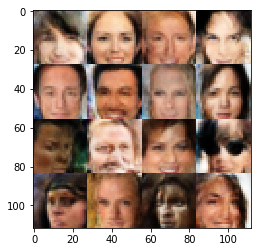

Epoch 3/8... Discriminator Loss: 1.1666 ... Generator Loss: 0.7220
Epoch 3/8... Discriminator Loss: 1.2519 ... Generator Loss: 1.0930
Epoch 3/8... Discriminator Loss: 1.2455 ... Generator Loss: 0.5991
Epoch 3/8... Discriminator Loss: 1.1412 ... Generator Loss: 0.7804
Epoch 3/8... Discriminator Loss: 1.2778 ... Generator Loss: 0.6411
Epoch 3/8... Discriminator Loss: 1.2094 ... Generator Loss: 0.8096
Epoch 3/8... Discriminator Loss: 1.3426 ... Generator Loss: 0.6721
Epoch 3/8... Discriminator Loss: 1.2906 ... Generator Loss: 1.0444
Epoch 3/8... Discriminator Loss: 1.3565 ... Generator Loss: 0.5476
Epoch 3/8... Discriminator Loss: 1.2755 ... Generator Loss: 0.7920


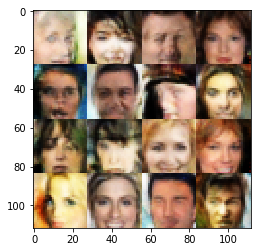

Epoch 3/8... Discriminator Loss: 1.2816 ... Generator Loss: 1.2893
Epoch 3/8... Discriminator Loss: 1.3608 ... Generator Loss: 0.6776
Epoch 3/8... Discriminator Loss: 1.2917 ... Generator Loss: 0.6148
Epoch 3/8... Discriminator Loss: 1.2710 ... Generator Loss: 1.2933
Epoch 3/8... Discriminator Loss: 1.2211 ... Generator Loss: 0.6876
Epoch 3/8... Discriminator Loss: 1.2093 ... Generator Loss: 0.9138
Epoch 3/8... Discriminator Loss: 1.1203 ... Generator Loss: 0.8213
Epoch 3/8... Discriminator Loss: 1.1539 ... Generator Loss: 0.9726
Epoch 3/8... Discriminator Loss: 1.5395 ... Generator Loss: 1.1828
Epoch 3/8... Discriminator Loss: 1.2249 ... Generator Loss: 0.8872


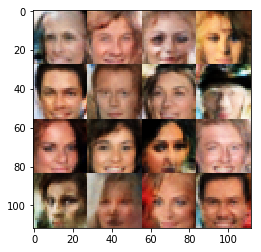

Epoch 3/8... Discriminator Loss: 1.2806 ... Generator Loss: 0.8225
Epoch 3/8... Discriminator Loss: 1.3669 ... Generator Loss: 0.5297
Epoch 3/8... Discriminator Loss: 1.3396 ... Generator Loss: 0.5051
Epoch 3/8... Discriminator Loss: 1.1750 ... Generator Loss: 0.7946
Epoch 3/8... Discriminator Loss: 1.3120 ... Generator Loss: 1.0898
Epoch 3/8... Discriminator Loss: 1.0071 ... Generator Loss: 0.8627
Epoch 3/8... Discriminator Loss: 1.1840 ... Generator Loss: 0.7467
Epoch 3/8... Discriminator Loss: 1.4899 ... Generator Loss: 0.4293
Epoch 3/8... Discriminator Loss: 1.1830 ... Generator Loss: 0.7909


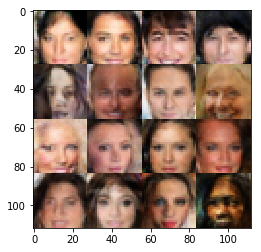

Epoch 4/8... Discriminator Loss: 1.3208 ... Generator Loss: 0.5838


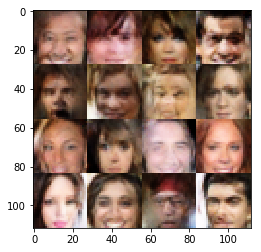

Epoch 4/8... Discriminator Loss: 1.2462 ... Generator Loss: 0.6095
Epoch 4/8... Discriminator Loss: 1.3982 ... Generator Loss: 0.9739
Epoch 4/8... Discriminator Loss: 1.1747 ... Generator Loss: 1.1866
Epoch 4/8... Discriminator Loss: 1.0874 ... Generator Loss: 0.9288
Epoch 4/8... Discriminator Loss: 1.1752 ... Generator Loss: 0.7947
Epoch 4/8... Discriminator Loss: 1.4060 ... Generator Loss: 0.4737
Epoch 4/8... Discriminator Loss: 1.2450 ... Generator Loss: 0.6510
Epoch 4/8... Discriminator Loss: 1.1267 ... Generator Loss: 0.7309
Epoch 4/8... Discriminator Loss: 1.3361 ... Generator Loss: 1.0147
Epoch 4/8... Discriminator Loss: 1.1091 ... Generator Loss: 0.9713


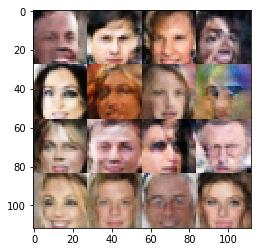

Epoch 4/8... Discriminator Loss: 1.2596 ... Generator Loss: 0.6117
Epoch 4/8... Discriminator Loss: 1.3381 ... Generator Loss: 0.4563
Epoch 4/8... Discriminator Loss: 1.3072 ... Generator Loss: 0.5702
Epoch 4/8... Discriminator Loss: 0.9414 ... Generator Loss: 1.2411
Epoch 4/8... Discriminator Loss: 1.2626 ... Generator Loss: 0.7915
Epoch 4/8... Discriminator Loss: 1.3666 ... Generator Loss: 0.9852
Epoch 4/8... Discriminator Loss: 1.0379 ... Generator Loss: 1.0272
Epoch 4/8... Discriminator Loss: 1.3914 ... Generator Loss: 0.4554
Epoch 4/8... Discriminator Loss: 1.3255 ... Generator Loss: 0.4743
Epoch 4/8... Discriminator Loss: 1.1339 ... Generator Loss: 0.9204


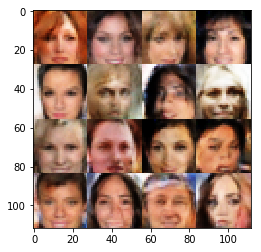

Epoch 4/8... Discriminator Loss: 0.8515 ... Generator Loss: 1.0568
Epoch 4/8... Discriminator Loss: 1.2753 ... Generator Loss: 0.7173
Epoch 4/8... Discriminator Loss: 1.4009 ... Generator Loss: 1.1765
Epoch 4/8... Discriminator Loss: 1.3729 ... Generator Loss: 0.5884
Epoch 4/8... Discriminator Loss: 1.2407 ... Generator Loss: 0.6786
Epoch 4/8... Discriminator Loss: 1.0983 ... Generator Loss: 0.7536
Epoch 4/8... Discriminator Loss: 1.0912 ... Generator Loss: 0.7630
Epoch 4/8... Discriminator Loss: 1.2019 ... Generator Loss: 0.7134
Epoch 4/8... Discriminator Loss: 1.4789 ... Generator Loss: 0.4632
Epoch 4/8... Discriminator Loss: 1.5006 ... Generator Loss: 0.4227


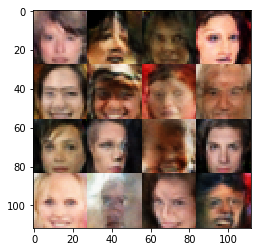

Epoch 4/8... Discriminator Loss: 1.2055 ... Generator Loss: 0.7963
Epoch 4/8... Discriminator Loss: 1.2839 ... Generator Loss: 0.6111
Epoch 4/8... Discriminator Loss: 1.2616 ... Generator Loss: 0.7724
Epoch 4/8... Discriminator Loss: 1.3558 ... Generator Loss: 0.4975
Epoch 4/8... Discriminator Loss: 1.3341 ... Generator Loss: 0.5384
Epoch 4/8... Discriminator Loss: 1.2306 ... Generator Loss: 0.6415
Epoch 4/8... Discriminator Loss: 1.0827 ... Generator Loss: 0.8449
Epoch 4/8... Discriminator Loss: 0.9377 ... Generator Loss: 1.0088
Epoch 4/8... Discriminator Loss: 1.0636 ... Generator Loss: 0.8909
Epoch 4/8... Discriminator Loss: 1.4134 ... Generator Loss: 1.4590


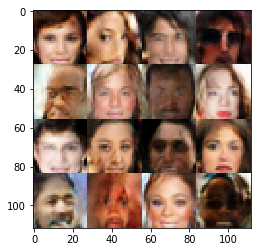

Epoch 4/8... Discriminator Loss: 1.2276 ... Generator Loss: 0.6533
Epoch 4/8... Discriminator Loss: 1.2940 ... Generator Loss: 1.1902
Epoch 4/8... Discriminator Loss: 1.2729 ... Generator Loss: 1.2724
Epoch 4/8... Discriminator Loss: 1.1326 ... Generator Loss: 0.7980
Epoch 4/8... Discriminator Loss: 1.2658 ... Generator Loss: 0.8562
Epoch 4/8... Discriminator Loss: 1.2235 ... Generator Loss: 0.6307
Epoch 4/8... Discriminator Loss: 1.1090 ... Generator Loss: 0.8694
Epoch 4/8... Discriminator Loss: 1.1052 ... Generator Loss: 1.0131
Epoch 4/8... Discriminator Loss: 0.9864 ... Generator Loss: 1.0497
Epoch 4/8... Discriminator Loss: 1.3174 ... Generator Loss: 1.1292


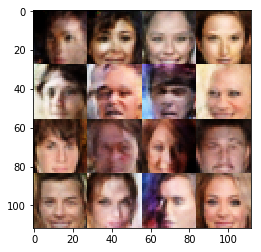

Epoch 4/8... Discriminator Loss: 1.0814 ... Generator Loss: 0.9775
Epoch 4/8... Discriminator Loss: 1.1349 ... Generator Loss: 0.9735
Epoch 4/8... Discriminator Loss: 1.4986 ... Generator Loss: 0.4471
Epoch 4/8... Discriminator Loss: 1.2464 ... Generator Loss: 0.6581
Epoch 4/8... Discriminator Loss: 1.1709 ... Generator Loss: 1.2755
Epoch 4/8... Discriminator Loss: 1.3712 ... Generator Loss: 0.5487
Epoch 4/8... Discriminator Loss: 1.2348 ... Generator Loss: 0.6697
Epoch 4/8... Discriminator Loss: 1.3801 ... Generator Loss: 0.5776
Epoch 4/8... Discriminator Loss: 1.1556 ... Generator Loss: 1.0864
Epoch 4/8... Discriminator Loss: 1.1616 ... Generator Loss: 0.7505


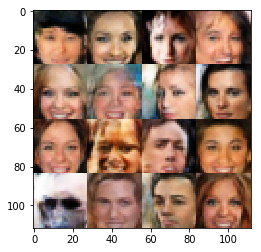

Epoch 4/8... Discriminator Loss: 1.3004 ... Generator Loss: 0.6604
Epoch 4/8... Discriminator Loss: 1.2834 ... Generator Loss: 1.2568
Epoch 4/8... Discriminator Loss: 1.1023 ... Generator Loss: 0.8107
Epoch 4/8... Discriminator Loss: 1.1814 ... Generator Loss: 0.7831
Epoch 4/8... Discriminator Loss: 1.4293 ... Generator Loss: 0.4209
Epoch 4/8... Discriminator Loss: 1.2503 ... Generator Loss: 0.7780
Epoch 4/8... Discriminator Loss: 1.3240 ... Generator Loss: 0.5622
Epoch 4/8... Discriminator Loss: 1.0240 ... Generator Loss: 0.9177
Epoch 4/8... Discriminator Loss: 1.3465 ... Generator Loss: 0.6583
Epoch 4/8... Discriminator Loss: 1.0869 ... Generator Loss: 1.4971


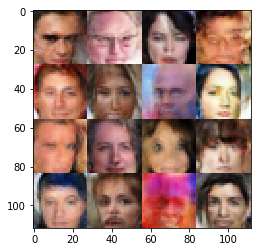

Epoch 4/8... Discriminator Loss: 1.3008 ... Generator Loss: 0.5675
Epoch 4/8... Discriminator Loss: 1.1224 ... Generator Loss: 0.6873
Epoch 4/8... Discriminator Loss: 1.1296 ... Generator Loss: 0.9349
Epoch 4/8... Discriminator Loss: 1.2352 ... Generator Loss: 0.6404
Epoch 4/8... Discriminator Loss: 1.2324 ... Generator Loss: 1.0848
Epoch 4/8... Discriminator Loss: 1.2809 ... Generator Loss: 0.8339
Epoch 4/8... Discriminator Loss: 1.0954 ... Generator Loss: 0.8396
Epoch 4/8... Discriminator Loss: 1.3731 ... Generator Loss: 0.5442
Epoch 4/8... Discriminator Loss: 1.2660 ... Generator Loss: 0.6495
Epoch 4/8... Discriminator Loss: 1.0716 ... Generator Loss: 0.8130


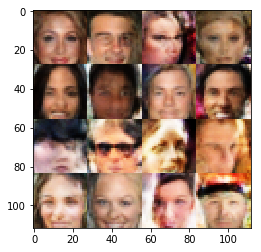

Epoch 4/8... Discriminator Loss: 1.3522 ... Generator Loss: 1.0777
Epoch 4/8... Discriminator Loss: 1.3075 ... Generator Loss: 0.9334
Epoch 4/8... Discriminator Loss: 1.1358 ... Generator Loss: 1.9534
Epoch 4/8... Discriminator Loss: 1.2229 ... Generator Loss: 0.7510
Epoch 4/8... Discriminator Loss: 1.1982 ... Generator Loss: 0.7246
Epoch 4/8... Discriminator Loss: 1.2294 ... Generator Loss: 0.7178
Epoch 4/8... Discriminator Loss: 1.3633 ... Generator Loss: 0.4591
Epoch 4/8... Discriminator Loss: 1.4620 ... Generator Loss: 0.4958
Epoch 4/8... Discriminator Loss: 1.3167 ... Generator Loss: 0.8473
Epoch 4/8... Discriminator Loss: 1.2769 ... Generator Loss: 1.0146


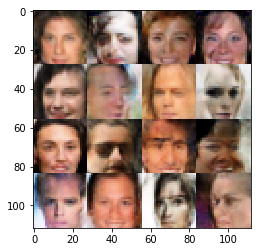

Epoch 4/8... Discriminator Loss: 1.1194 ... Generator Loss: 1.1101
Epoch 4/8... Discriminator Loss: 1.6863 ... Generator Loss: 1.3842
Epoch 4/8... Discriminator Loss: 1.2988 ... Generator Loss: 0.5724
Epoch 4/8... Discriminator Loss: 1.4971 ... Generator Loss: 0.4312
Epoch 4/8... Discriminator Loss: 1.2626 ... Generator Loss: 1.1134
Epoch 4/8... Discriminator Loss: 1.3898 ... Generator Loss: 0.5034
Epoch 4/8... Discriminator Loss: 1.3641 ... Generator Loss: 0.5513
Epoch 4/8... Discriminator Loss: 1.4777 ... Generator Loss: 0.4589
Epoch 4/8... Discriminator Loss: 1.2382 ... Generator Loss: 0.8173
Epoch 4/8... Discriminator Loss: 1.5555 ... Generator Loss: 0.4283


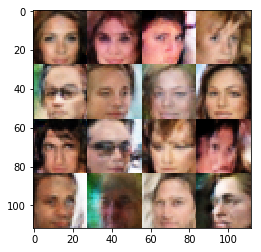

Epoch 4/8... Discriminator Loss: 1.2815 ... Generator Loss: 0.8670
Epoch 4/8... Discriminator Loss: 1.2052 ... Generator Loss: 0.6622
Epoch 4/8... Discriminator Loss: 1.1385 ... Generator Loss: 0.8720
Epoch 4/8... Discriminator Loss: 1.2707 ... Generator Loss: 0.8629
Epoch 4/8... Discriminator Loss: 0.9031 ... Generator Loss: 1.9105
Epoch 4/8... Discriminator Loss: 1.2091 ... Generator Loss: 0.8069
Epoch 4/8... Discriminator Loss: 1.1363 ... Generator Loss: 1.0825
Epoch 4/8... Discriminator Loss: 1.2256 ... Generator Loss: 0.8434
Epoch 4/8... Discriminator Loss: 1.1133 ... Generator Loss: 0.8910
Epoch 4/8... Discriminator Loss: 1.2607 ... Generator Loss: 0.9027


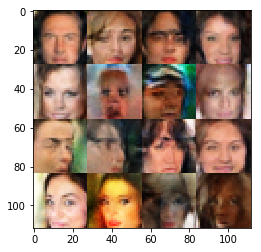

Epoch 4/8... Discriminator Loss: 1.2726 ... Generator Loss: 0.6463
Epoch 4/8... Discriminator Loss: 1.2268 ... Generator Loss: 0.7872
Epoch 4/8... Discriminator Loss: 1.1025 ... Generator Loss: 1.5908
Epoch 4/8... Discriminator Loss: 1.3306 ... Generator Loss: 0.8554
Epoch 4/8... Discriminator Loss: 1.2275 ... Generator Loss: 0.9485
Epoch 4/8... Discriminator Loss: 1.1396 ... Generator Loss: 0.8082
Epoch 4/8... Discriminator Loss: 1.1684 ... Generator Loss: 0.7495
Epoch 4/8... Discriminator Loss: 1.1904 ... Generator Loss: 0.8203
Epoch 4/8... Discriminator Loss: 1.4230 ... Generator Loss: 0.4873
Epoch 4/8... Discriminator Loss: 1.2467 ... Generator Loss: 1.0537


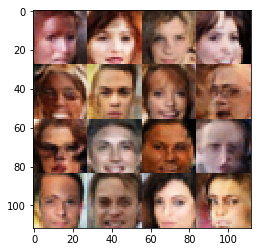

Epoch 4/8... Discriminator Loss: 1.4587 ... Generator Loss: 1.2960
Epoch 4/8... Discriminator Loss: 1.3499 ... Generator Loss: 0.8262
Epoch 4/8... Discriminator Loss: 0.9900 ... Generator Loss: 1.0765
Epoch 4/8... Discriminator Loss: 1.1300 ... Generator Loss: 0.8358
Epoch 4/8... Discriminator Loss: 1.2195 ... Generator Loss: 0.5945
Epoch 4/8... Discriminator Loss: 1.1536 ... Generator Loss: 1.0357
Epoch 4/8... Discriminator Loss: 1.2953 ... Generator Loss: 0.6157
Epoch 4/8... Discriminator Loss: 1.1123 ... Generator Loss: 0.7576
Epoch 4/8... Discriminator Loss: 1.0684 ... Generator Loss: 0.8002
Epoch 4/8... Discriminator Loss: 1.2744 ... Generator Loss: 0.5696


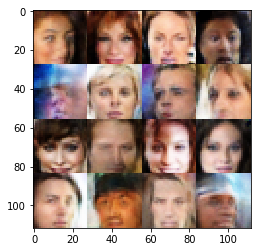

Epoch 4/8... Discriminator Loss: 1.2362 ... Generator Loss: 0.6777
Epoch 4/8... Discriminator Loss: 1.2110 ... Generator Loss: 0.7515
Epoch 4/8... Discriminator Loss: 1.2252 ... Generator Loss: 0.8231
Epoch 4/8... Discriminator Loss: 1.4637 ... Generator Loss: 0.4840
Epoch 4/8... Discriminator Loss: 1.3773 ... Generator Loss: 0.5493
Epoch 4/8... Discriminator Loss: 0.9822 ... Generator Loss: 1.0176
Epoch 4/8... Discriminator Loss: 1.1902 ... Generator Loss: 0.7158
Epoch 4/8... Discriminator Loss: 1.2124 ... Generator Loss: 0.9730
Epoch 4/8... Discriminator Loss: 1.3341 ... Generator Loss: 0.5241
Epoch 4/8... Discriminator Loss: 1.2762 ... Generator Loss: 0.6349


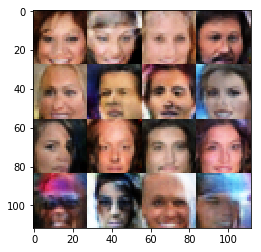

Epoch 4/8... Discriminator Loss: 1.1598 ... Generator Loss: 0.7796
Epoch 4/8... Discriminator Loss: 1.1094 ... Generator Loss: 0.8615
Epoch 4/8... Discriminator Loss: 1.0284 ... Generator Loss: 0.9159
Epoch 4/8... Discriminator Loss: 1.3708 ... Generator Loss: 0.4830
Epoch 4/8... Discriminator Loss: 0.9290 ... Generator Loss: 1.0260
Epoch 4/8... Discriminator Loss: 1.3448 ... Generator Loss: 0.6089
Epoch 4/8... Discriminator Loss: 1.3437 ... Generator Loss: 1.3476
Epoch 4/8... Discriminator Loss: 1.2104 ... Generator Loss: 0.6943
Epoch 4/8... Discriminator Loss: 1.1794 ... Generator Loss: 0.7265
Epoch 4/8... Discriminator Loss: 1.4937 ... Generator Loss: 0.4590


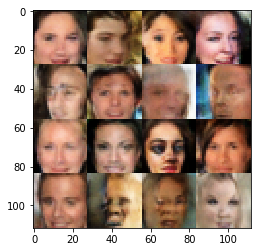

Epoch 4/8... Discriminator Loss: 1.2346 ... Generator Loss: 0.8195
Epoch 4/8... Discriminator Loss: 1.1375 ... Generator Loss: 0.9621
Epoch 4/8... Discriminator Loss: 1.0768 ... Generator Loss: 0.8294
Epoch 4/8... Discriminator Loss: 1.3793 ... Generator Loss: 1.2034
Epoch 4/8... Discriminator Loss: 1.2188 ... Generator Loss: 0.7167
Epoch 4/8... Discriminator Loss: 1.2551 ... Generator Loss: 0.7185
Epoch 4/8... Discriminator Loss: 1.1714 ... Generator Loss: 0.8862
Epoch 4/8... Discriminator Loss: 1.1216 ... Generator Loss: 0.7564
Epoch 4/8... Discriminator Loss: 1.2236 ... Generator Loss: 0.6743
Epoch 4/8... Discriminator Loss: 1.4611 ... Generator Loss: 0.9104


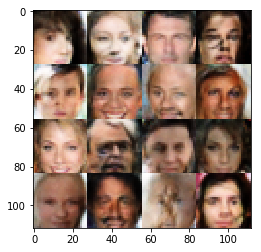

Epoch 4/8... Discriminator Loss: 1.3886 ... Generator Loss: 1.2737
Epoch 4/8... Discriminator Loss: 1.0949 ... Generator Loss: 0.8095
Epoch 4/8... Discriminator Loss: 1.1149 ... Generator Loss: 0.7545
Epoch 4/8... Discriminator Loss: 1.2691 ... Generator Loss: 1.0200
Epoch 4/8... Discriminator Loss: 1.3521 ... Generator Loss: 1.0346
Epoch 4/8... Discriminator Loss: 1.0544 ... Generator Loss: 0.9602
Epoch 4/8... Discriminator Loss: 1.3635 ... Generator Loss: 0.5049
Epoch 4/8... Discriminator Loss: 1.1157 ... Generator Loss: 0.7714
Epoch 4/8... Discriminator Loss: 1.4078 ... Generator Loss: 0.4937
Epoch 4/8... Discriminator Loss: 1.2292 ... Generator Loss: 0.9012


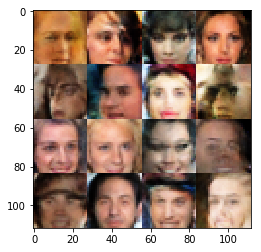

Epoch 4/8... Discriminator Loss: 1.2352 ... Generator Loss: 0.9384
Epoch 4/8... Discriminator Loss: 1.0393 ... Generator Loss: 1.0210
Epoch 4/8... Discriminator Loss: 1.1698 ... Generator Loss: 1.0443
Epoch 4/8... Discriminator Loss: 1.2237 ... Generator Loss: 1.1195
Epoch 4/8... Discriminator Loss: 1.1453 ... Generator Loss: 0.7726
Epoch 4/8... Discriminator Loss: 1.3919 ... Generator Loss: 0.5427
Epoch 4/8... Discriminator Loss: 1.1779 ... Generator Loss: 0.7817
Epoch 4/8... Discriminator Loss: 1.3334 ... Generator Loss: 0.5364
Epoch 4/8... Discriminator Loss: 1.3092 ... Generator Loss: 0.5682
Epoch 4/8... Discriminator Loss: 1.2607 ... Generator Loss: 0.5791


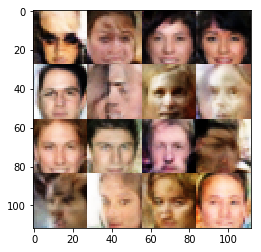

Epoch 4/8... Discriminator Loss: 1.1176 ... Generator Loss: 0.8456
Epoch 4/8... Discriminator Loss: 1.0843 ... Generator Loss: 0.9349
Epoch 4/8... Discriminator Loss: 1.0736 ... Generator Loss: 0.9003
Epoch 4/8... Discriminator Loss: 1.1886 ... Generator Loss: 0.8029
Epoch 4/8... Discriminator Loss: 1.0216 ... Generator Loss: 1.1173
Epoch 4/8... Discriminator Loss: 1.2005 ... Generator Loss: 1.2308
Epoch 4/8... Discriminator Loss: 1.2242 ... Generator Loss: 0.5861
Epoch 4/8... Discriminator Loss: 1.2850 ... Generator Loss: 0.6468
Epoch 4/8... Discriminator Loss: 1.5625 ... Generator Loss: 0.4127
Epoch 4/8... Discriminator Loss: 1.3790 ... Generator Loss: 0.5148


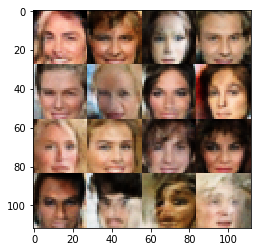

Epoch 4/8... Discriminator Loss: 1.2593 ... Generator Loss: 0.6895
Epoch 4/8... Discriminator Loss: 1.2539 ... Generator Loss: 0.8058
Epoch 4/8... Discriminator Loss: 1.1723 ... Generator Loss: 0.9877
Epoch 4/8... Discriminator Loss: 1.4423 ... Generator Loss: 1.1930
Epoch 4/8... Discriminator Loss: 1.3353 ... Generator Loss: 0.5301
Epoch 4/8... Discriminator Loss: 1.1775 ... Generator Loss: 0.8750
Epoch 4/8... Discriminator Loss: 1.1690 ... Generator Loss: 0.8913
Epoch 4/8... Discriminator Loss: 1.3149 ... Generator Loss: 1.1086
Epoch 4/8... Discriminator Loss: 1.4265 ... Generator Loss: 0.4832
Epoch 4/8... Discriminator Loss: 1.0548 ... Generator Loss: 0.9680


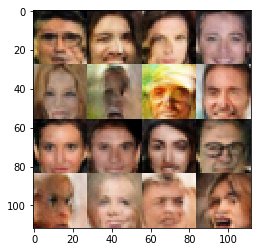

Epoch 4/8... Discriminator Loss: 1.1856 ... Generator Loss: 0.7550
Epoch 4/8... Discriminator Loss: 1.2061 ... Generator Loss: 0.8377
Epoch 4/8... Discriminator Loss: 1.2766 ... Generator Loss: 0.5933
Epoch 4/8... Discriminator Loss: 1.3155 ... Generator Loss: 1.0840
Epoch 4/8... Discriminator Loss: 1.1478 ... Generator Loss: 0.9496
Epoch 4/8... Discriminator Loss: 1.3069 ... Generator Loss: 0.7089
Epoch 4/8... Discriminator Loss: 1.3374 ... Generator Loss: 0.4974
Epoch 4/8... Discriminator Loss: 1.2158 ... Generator Loss: 0.7718
Epoch 4/8... Discriminator Loss: 1.2134 ... Generator Loss: 0.7442
Epoch 4/8... Discriminator Loss: 1.0920 ... Generator Loss: 1.0526


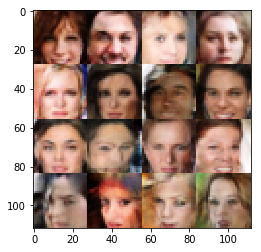

Epoch 4/8... Discriminator Loss: 1.2178 ... Generator Loss: 0.5937
Epoch 4/8... Discriminator Loss: 1.1616 ... Generator Loss: 0.9261
Epoch 4/8... Discriminator Loss: 1.4344 ... Generator Loss: 0.4388
Epoch 4/8... Discriminator Loss: 1.2887 ... Generator Loss: 0.6181
Epoch 4/8... Discriminator Loss: 1.5795 ... Generator Loss: 0.4095
Epoch 4/8... Discriminator Loss: 1.1493 ... Generator Loss: 1.1524
Epoch 4/8... Discriminator Loss: 1.2675 ... Generator Loss: 0.8041
Epoch 4/8... Discriminator Loss: 0.8939 ... Generator Loss: 1.1581
Epoch 4/8... Discriminator Loss: 1.3299 ... Generator Loss: 1.2379
Epoch 4/8... Discriminator Loss: 1.1836 ... Generator Loss: 0.7461


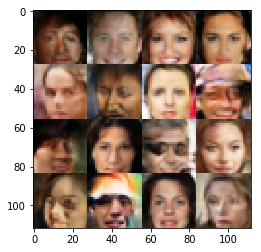

Epoch 4/8... Discriminator Loss: 1.0761 ... Generator Loss: 0.8643
Epoch 4/8... Discriminator Loss: 1.2973 ... Generator Loss: 0.5423
Epoch 4/8... Discriminator Loss: 1.1572 ... Generator Loss: 0.8404
Epoch 4/8... Discriminator Loss: 1.2911 ... Generator Loss: 0.6510
Epoch 4/8... Discriminator Loss: 1.0901 ... Generator Loss: 0.8668
Epoch 4/8... Discriminator Loss: 1.3213 ... Generator Loss: 0.6490
Epoch 4/8... Discriminator Loss: 1.1602 ... Generator Loss: 0.6963
Epoch 4/8... Discriminator Loss: 1.2335 ... Generator Loss: 0.6264
Epoch 4/8... Discriminator Loss: 1.1599 ... Generator Loss: 0.7694
Epoch 4/8... Discriminator Loss: 1.3230 ... Generator Loss: 0.9982


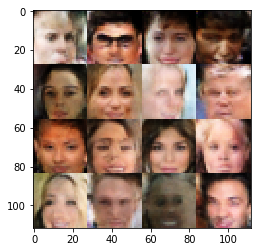

Epoch 4/8... Discriminator Loss: 1.2479 ... Generator Loss: 0.7564
Epoch 4/8... Discriminator Loss: 1.1996 ... Generator Loss: 0.6822
Epoch 4/8... Discriminator Loss: 1.2180 ... Generator Loss: 0.7475
Epoch 4/8... Discriminator Loss: 1.3105 ... Generator Loss: 0.6809
Epoch 4/8... Discriminator Loss: 1.3354 ... Generator Loss: 1.1174
Epoch 4/8... Discriminator Loss: 1.2625 ... Generator Loss: 0.6512
Epoch 4/8... Discriminator Loss: 1.1140 ... Generator Loss: 1.1534
Epoch 4/8... Discriminator Loss: 1.1262 ... Generator Loss: 0.8665
Epoch 4/8... Discriminator Loss: 1.2734 ... Generator Loss: 0.8614
Epoch 4/8... Discriminator Loss: 1.1327 ... Generator Loss: 0.7925


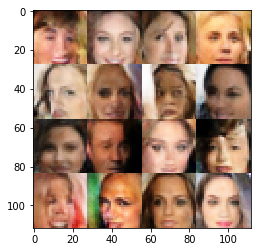

Epoch 4/8... Discriminator Loss: 1.3040 ... Generator Loss: 0.5937
Epoch 4/8... Discriminator Loss: 1.1033 ... Generator Loss: 1.2589
Epoch 4/8... Discriminator Loss: 1.2054 ... Generator Loss: 0.9982
Epoch 4/8... Discriminator Loss: 1.3243 ... Generator Loss: 0.6504
Epoch 4/8... Discriminator Loss: 1.2619 ... Generator Loss: 0.9882
Epoch 4/8... Discriminator Loss: 1.2151 ... Generator Loss: 0.8777
Epoch 4/8... Discriminator Loss: 1.0468 ... Generator Loss: 0.9166
Epoch 4/8... Discriminator Loss: 1.3044 ... Generator Loss: 0.5299
Epoch 4/8... Discriminator Loss: 1.1197 ... Generator Loss: 1.2648
Epoch 4/8... Discriminator Loss: 1.2335 ... Generator Loss: 0.6009


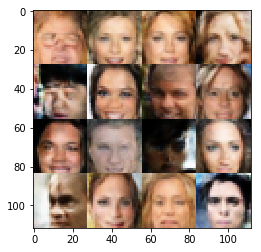

Epoch 4/8... Discriminator Loss: 1.2441 ... Generator Loss: 0.6786
Epoch 4/8... Discriminator Loss: 1.2860 ... Generator Loss: 0.6124
Epoch 4/8... Discriminator Loss: 1.2806 ... Generator Loss: 0.6727
Epoch 4/8... Discriminator Loss: 1.2062 ... Generator Loss: 1.1001
Epoch 4/8... Discriminator Loss: 1.4179 ... Generator Loss: 0.5969
Epoch 4/8... Discriminator Loss: 1.0182 ... Generator Loss: 0.9373
Epoch 4/8... Discriminator Loss: 1.2821 ... Generator Loss: 0.8480
Epoch 4/8... Discriminator Loss: 1.1788 ... Generator Loss: 0.9024
Epoch 4/8... Discriminator Loss: 1.2262 ... Generator Loss: 0.8129
Epoch 4/8... Discriminator Loss: 1.2436 ... Generator Loss: 0.6006


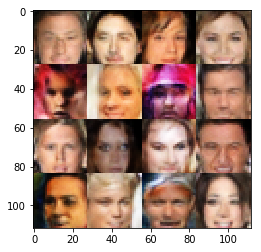

Epoch 4/8... Discriminator Loss: 1.2382 ... Generator Loss: 1.2722
Epoch 4/8... Discriminator Loss: 1.2617 ... Generator Loss: 0.6441
Epoch 4/8... Discriminator Loss: 1.1230 ... Generator Loss: 0.7306
Epoch 4/8... Discriminator Loss: 1.2166 ... Generator Loss: 0.8276
Epoch 4/8... Discriminator Loss: 1.3596 ... Generator Loss: 0.4999
Epoch 4/8... Discriminator Loss: 1.3808 ... Generator Loss: 0.6901
Epoch 4/8... Discriminator Loss: 1.3353 ... Generator Loss: 0.5591
Epoch 4/8... Discriminator Loss: 1.1419 ... Generator Loss: 0.9150
Epoch 4/8... Discriminator Loss: 1.3855 ... Generator Loss: 0.5137
Epoch 4/8... Discriminator Loss: 1.1829 ... Generator Loss: 0.7499


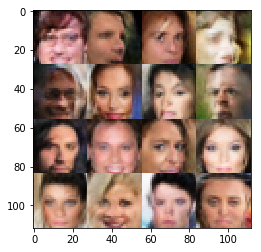

Epoch 4/8... Discriminator Loss: 1.3518 ... Generator Loss: 0.5817
Epoch 4/8... Discriminator Loss: 1.0488 ... Generator Loss: 0.9327
Epoch 4/8... Discriminator Loss: 1.1992 ... Generator Loss: 1.0808
Epoch 4/8... Discriminator Loss: 1.2798 ... Generator Loss: 0.6515
Epoch 4/8... Discriminator Loss: 1.3825 ... Generator Loss: 0.5136
Epoch 4/8... Discriminator Loss: 1.4418 ... Generator Loss: 0.4532
Epoch 4/8... Discriminator Loss: 1.2191 ... Generator Loss: 1.2388
Epoch 4/8... Discriminator Loss: 1.1887 ... Generator Loss: 0.9566
Epoch 4/8... Discriminator Loss: 1.3480 ... Generator Loss: 0.4901
Epoch 4/8... Discriminator Loss: 1.5168 ... Generator Loss: 1.2316


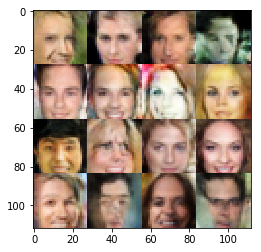

Epoch 4/8... Discriminator Loss: 1.3356 ... Generator Loss: 0.6516
Epoch 4/8... Discriminator Loss: 1.4441 ... Generator Loss: 0.4324
Epoch 4/8... Discriminator Loss: 1.2233 ... Generator Loss: 0.7300
Epoch 4/8... Discriminator Loss: 1.1595 ... Generator Loss: 0.9190
Epoch 4/8... Discriminator Loss: 1.2644 ... Generator Loss: 0.9061
Epoch 4/8... Discriminator Loss: 1.2433 ... Generator Loss: 0.8666
Epoch 4/8... Discriminator Loss: 1.3333 ... Generator Loss: 0.5217
Epoch 4/8... Discriminator Loss: 1.3436 ... Generator Loss: 0.8778
Epoch 4/8... Discriminator Loss: 1.3854 ... Generator Loss: 1.2383
Epoch 4/8... Discriminator Loss: 1.2285 ... Generator Loss: 0.6061


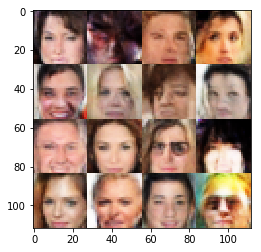

Epoch 4/8... Discriminator Loss: 1.2284 ... Generator Loss: 0.7878
Epoch 4/8... Discriminator Loss: 1.2724 ... Generator Loss: 0.6976
Epoch 4/8... Discriminator Loss: 1.2136 ... Generator Loss: 0.9594
Epoch 4/8... Discriminator Loss: 1.2471 ... Generator Loss: 0.7368
Epoch 4/8... Discriminator Loss: 1.2484 ... Generator Loss: 0.5958
Epoch 4/8... Discriminator Loss: 1.2715 ... Generator Loss: 0.9982
Epoch 4/8... Discriminator Loss: 1.2232 ... Generator Loss: 0.7013
Epoch 4/8... Discriminator Loss: 1.4389 ... Generator Loss: 1.1715
Epoch 4/8... Discriminator Loss: 1.1381 ... Generator Loss: 0.8682
Epoch 4/8... Discriminator Loss: 1.2638 ... Generator Loss: 0.6552


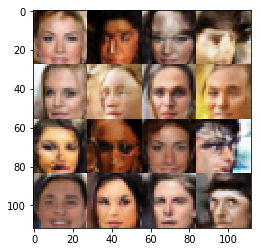

Epoch 4/8... Discriminator Loss: 1.4983 ... Generator Loss: 1.1683
Epoch 4/8... Discriminator Loss: 1.3849 ... Generator Loss: 0.5522
Epoch 4/8... Discriminator Loss: 1.2381 ... Generator Loss: 0.9736
Epoch 4/8... Discriminator Loss: 1.2015 ... Generator Loss: 0.9341
Epoch 4/8... Discriminator Loss: 1.2290 ... Generator Loss: 0.8942
Epoch 4/8... Discriminator Loss: 1.2117 ... Generator Loss: 0.8510
Epoch 4/8... Discriminator Loss: 1.2310 ... Generator Loss: 0.9290
Epoch 4/8... Discriminator Loss: 1.1625 ... Generator Loss: 0.7695
Epoch 4/8... Discriminator Loss: 1.1517 ... Generator Loss: 0.7842
Epoch 4/8... Discriminator Loss: 1.4007 ... Generator Loss: 0.5412


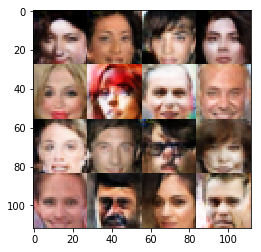

Epoch 4/8... Discriminator Loss: 1.3805 ... Generator Loss: 0.5481
Epoch 4/8... Discriminator Loss: 1.1307 ... Generator Loss: 0.7590
Epoch 4/8... Discriminator Loss: 1.6004 ... Generator Loss: 0.3877
Epoch 4/8... Discriminator Loss: 1.1394 ... Generator Loss: 0.8878
Epoch 4/8... Discriminator Loss: 1.2496 ... Generator Loss: 0.7398
Epoch 4/8... Discriminator Loss: 1.2215 ... Generator Loss: 0.8437


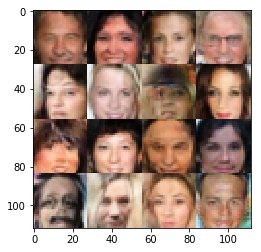

Epoch 5/8... Discriminator Loss: 1.3616 ... Generator Loss: 0.5841
Epoch 5/8... Discriminator Loss: 1.1713 ... Generator Loss: 0.6431
Epoch 5/8... Discriminator Loss: 1.3788 ... Generator Loss: 0.5337
Epoch 5/8... Discriminator Loss: 1.3478 ... Generator Loss: 0.5481


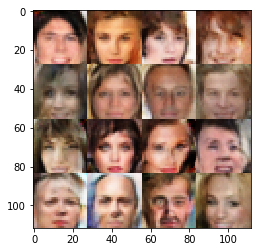

Epoch 5/8... Discriminator Loss: 1.0880 ... Generator Loss: 1.0527
Epoch 5/8... Discriminator Loss: 1.2494 ... Generator Loss: 0.5552
Epoch 5/8... Discriminator Loss: 1.2419 ... Generator Loss: 1.1562
Epoch 5/8... Discriminator Loss: 1.1737 ... Generator Loss: 0.9717
Epoch 5/8... Discriminator Loss: 1.0906 ... Generator Loss: 1.0034
Epoch 5/8... Discriminator Loss: 1.2267 ... Generator Loss: 0.8932
Epoch 5/8... Discriminator Loss: 1.3864 ... Generator Loss: 1.3079
Epoch 5/8... Discriminator Loss: 1.2885 ... Generator Loss: 0.8547
Epoch 5/8... Discriminator Loss: 1.2957 ... Generator Loss: 0.9445
Epoch 5/8... Discriminator Loss: 1.2262 ... Generator Loss: 0.7780


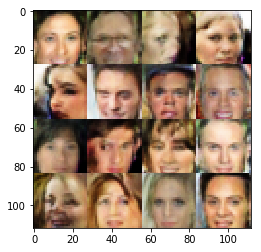

Epoch 5/8... Discriminator Loss: 1.2233 ... Generator Loss: 0.8759
Epoch 5/8... Discriminator Loss: 1.2873 ... Generator Loss: 1.1218
Epoch 5/8... Discriminator Loss: 1.2303 ... Generator Loss: 0.7301
Epoch 5/8... Discriminator Loss: 1.0671 ... Generator Loss: 0.8670
Epoch 5/8... Discriminator Loss: 1.2893 ... Generator Loss: 0.5710
Epoch 5/8... Discriminator Loss: 1.1602 ... Generator Loss: 0.7440
Epoch 5/8... Discriminator Loss: 1.1884 ... Generator Loss: 0.7858
Epoch 5/8... Discriminator Loss: 1.4320 ... Generator Loss: 0.4674
Epoch 5/8... Discriminator Loss: 1.1730 ... Generator Loss: 0.7191
Epoch 5/8... Discriminator Loss: 1.3295 ... Generator Loss: 1.0140


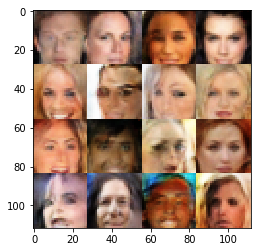

Epoch 5/8... Discriminator Loss: 1.1353 ... Generator Loss: 0.9607
Epoch 5/8... Discriminator Loss: 1.1874 ... Generator Loss: 1.1175
Epoch 5/8... Discriminator Loss: 1.5187 ... Generator Loss: 0.4826
Epoch 5/8... Discriminator Loss: 1.4642 ... Generator Loss: 1.1165
Epoch 5/8... Discriminator Loss: 1.3396 ... Generator Loss: 1.2239
Epoch 5/8... Discriminator Loss: 1.1844 ... Generator Loss: 0.9316
Epoch 5/8... Discriminator Loss: 1.2494 ... Generator Loss: 0.9863
Epoch 5/8... Discriminator Loss: 1.1994 ... Generator Loss: 1.2127
Epoch 5/8... Discriminator Loss: 1.6775 ... Generator Loss: 1.2363
Epoch 5/8... Discriminator Loss: 1.2311 ... Generator Loss: 0.6093


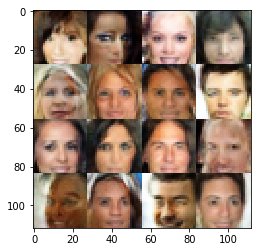

Epoch 5/8... Discriminator Loss: 1.2611 ... Generator Loss: 0.5907
Epoch 5/8... Discriminator Loss: 1.0517 ... Generator Loss: 0.9048
Epoch 5/8... Discriminator Loss: 1.2340 ... Generator Loss: 1.0203
Epoch 5/8... Discriminator Loss: 1.2870 ... Generator Loss: 0.7340
Epoch 5/8... Discriminator Loss: 1.2712 ... Generator Loss: 0.6907
Epoch 5/8... Discriminator Loss: 1.3116 ... Generator Loss: 0.8202
Epoch 5/8... Discriminator Loss: 1.2933 ... Generator Loss: 0.5717
Epoch 5/8... Discriminator Loss: 1.2242 ... Generator Loss: 1.1793
Epoch 5/8... Discriminator Loss: 1.1343 ... Generator Loss: 0.9653
Epoch 5/8... Discriminator Loss: 1.3646 ... Generator Loss: 0.5105


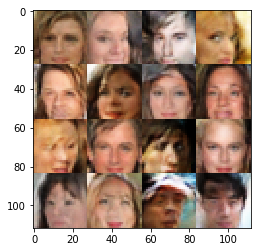

Epoch 5/8... Discriminator Loss: 1.0032 ... Generator Loss: 1.0942
Epoch 5/8... Discriminator Loss: 1.1329 ... Generator Loss: 0.7486
Epoch 5/8... Discriminator Loss: 1.2266 ... Generator Loss: 0.7259
Epoch 5/8... Discriminator Loss: 1.3874 ... Generator Loss: 0.7267
Epoch 5/8... Discriminator Loss: 1.3098 ... Generator Loss: 0.5383
Epoch 5/8... Discriminator Loss: 1.2711 ... Generator Loss: 1.1559
Epoch 5/8... Discriminator Loss: 1.2808 ... Generator Loss: 0.5016
Epoch 5/8... Discriminator Loss: 1.3837 ... Generator Loss: 0.5660
Epoch 5/8... Discriminator Loss: 1.3756 ... Generator Loss: 0.8632
Epoch 5/8... Discriminator Loss: 1.1570 ... Generator Loss: 0.6451


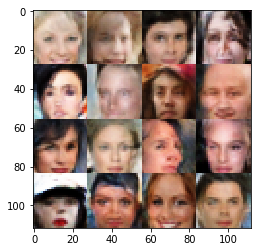

Epoch 5/8... Discriminator Loss: 1.2583 ... Generator Loss: 1.1229
Epoch 5/8... Discriminator Loss: 1.2388 ... Generator Loss: 1.3072
Epoch 5/8... Discriminator Loss: 1.2706 ... Generator Loss: 0.7469
Epoch 5/8... Discriminator Loss: 1.4984 ... Generator Loss: 0.4681
Epoch 5/8... Discriminator Loss: 1.1529 ... Generator Loss: 0.7911
Epoch 5/8... Discriminator Loss: 1.2887 ... Generator Loss: 0.7578
Epoch 5/8... Discriminator Loss: 1.2689 ... Generator Loss: 0.9817
Epoch 5/8... Discriminator Loss: 1.3621 ... Generator Loss: 1.1879
Epoch 5/8... Discriminator Loss: 1.1611 ... Generator Loss: 0.7884
Epoch 5/8... Discriminator Loss: 1.2639 ... Generator Loss: 0.7061


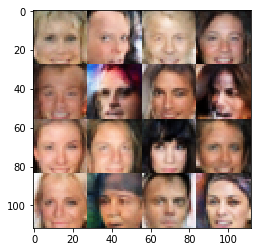

Epoch 5/8... Discriminator Loss: 1.4495 ... Generator Loss: 1.2214
Epoch 5/8... Discriminator Loss: 1.1148 ... Generator Loss: 0.7614
Epoch 5/8... Discriminator Loss: 1.1633 ... Generator Loss: 0.7439
Epoch 5/8... Discriminator Loss: 1.2972 ... Generator Loss: 0.6760
Epoch 5/8... Discriminator Loss: 1.1542 ... Generator Loss: 0.8335
Epoch 5/8... Discriminator Loss: 1.2831 ... Generator Loss: 0.5460
Epoch 5/8... Discriminator Loss: 1.0051 ... Generator Loss: 0.9655
Epoch 5/8... Discriminator Loss: 1.2488 ... Generator Loss: 0.7502
Epoch 5/8... Discriminator Loss: 1.4291 ... Generator Loss: 0.5962
Epoch 5/8... Discriminator Loss: 1.2636 ... Generator Loss: 0.7971


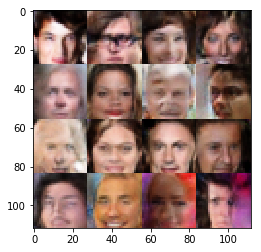

Epoch 5/8... Discriminator Loss: 1.1867 ... Generator Loss: 1.1200
Epoch 5/8... Discriminator Loss: 1.0286 ... Generator Loss: 0.9158
Epoch 5/8... Discriminator Loss: 1.2831 ... Generator Loss: 1.0614
Epoch 5/8... Discriminator Loss: 1.2548 ... Generator Loss: 0.8417
Epoch 5/8... Discriminator Loss: 1.2086 ... Generator Loss: 0.6210
Epoch 5/8... Discriminator Loss: 1.3844 ... Generator Loss: 0.7122
Epoch 5/8... Discriminator Loss: 1.2191 ... Generator Loss: 1.2270
Epoch 5/8... Discriminator Loss: 1.2808 ... Generator Loss: 0.8777
Epoch 5/8... Discriminator Loss: 1.1439 ... Generator Loss: 0.6655
Epoch 5/8... Discriminator Loss: 1.2323 ... Generator Loss: 0.9424


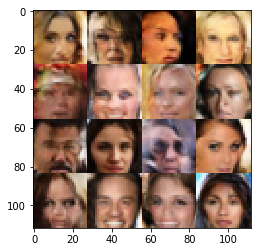

Epoch 5/8... Discriminator Loss: 1.2256 ... Generator Loss: 0.8221
Epoch 5/8... Discriminator Loss: 1.2805 ... Generator Loss: 0.9506
Epoch 5/8... Discriminator Loss: 1.5107 ... Generator Loss: 1.1768
Epoch 5/8... Discriminator Loss: 1.3013 ... Generator Loss: 0.6676
Epoch 5/8... Discriminator Loss: 1.1984 ... Generator Loss: 0.8477
Epoch 5/8... Discriminator Loss: 1.3038 ... Generator Loss: 0.9710
Epoch 5/8... Discriminator Loss: 1.1174 ... Generator Loss: 1.2002
Epoch 5/8... Discriminator Loss: 1.5143 ... Generator Loss: 0.4816
Epoch 5/8... Discriminator Loss: 1.2023 ... Generator Loss: 0.6611
Epoch 5/8... Discriminator Loss: 1.2664 ... Generator Loss: 0.8156


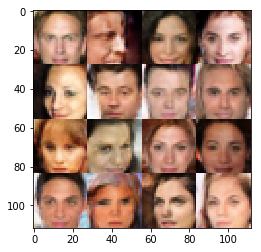

Epoch 5/8... Discriminator Loss: 1.3163 ... Generator Loss: 0.8105
Epoch 5/8... Discriminator Loss: 1.2099 ... Generator Loss: 0.7801
Epoch 5/8... Discriminator Loss: 1.1750 ... Generator Loss: 0.7132
Epoch 5/8... Discriminator Loss: 1.2316 ... Generator Loss: 0.6876
Epoch 5/8... Discriminator Loss: 1.4966 ... Generator Loss: 0.6272
Epoch 5/8... Discriminator Loss: 1.1122 ... Generator Loss: 0.9137
Epoch 5/8... Discriminator Loss: 1.3114 ... Generator Loss: 0.5441
Epoch 5/8... Discriminator Loss: 0.9893 ... Generator Loss: 1.1882
Epoch 5/8... Discriminator Loss: 1.3312 ... Generator Loss: 1.0449
Epoch 5/8... Discriminator Loss: 1.5255 ... Generator Loss: 1.3336


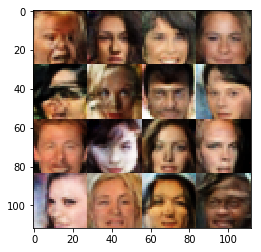

Epoch 5/8... Discriminator Loss: 1.2796 ... Generator Loss: 0.6058
Epoch 5/8... Discriminator Loss: 1.1794 ... Generator Loss: 1.0697
Epoch 5/8... Discriminator Loss: 1.1370 ... Generator Loss: 0.7425
Epoch 5/8... Discriminator Loss: 1.2967 ... Generator Loss: 1.1806
Epoch 5/8... Discriminator Loss: 1.2622 ... Generator Loss: 0.7641
Epoch 5/8... Discriminator Loss: 1.2668 ... Generator Loss: 0.5943
Epoch 5/8... Discriminator Loss: 1.2203 ... Generator Loss: 1.2104
Epoch 5/8... Discriminator Loss: 1.1463 ... Generator Loss: 0.9176
Epoch 5/8... Discriminator Loss: 1.2302 ... Generator Loss: 0.5698
Epoch 5/8... Discriminator Loss: 1.1515 ... Generator Loss: 0.6824


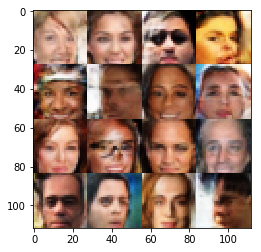

Epoch 5/8... Discriminator Loss: 1.2513 ... Generator Loss: 0.6379
Epoch 5/8... Discriminator Loss: 1.2194 ... Generator Loss: 0.9394
Epoch 5/8... Discriminator Loss: 1.3098 ... Generator Loss: 0.6469
Epoch 5/8... Discriminator Loss: 1.0677 ... Generator Loss: 1.0153
Epoch 5/8... Discriminator Loss: 1.2457 ... Generator Loss: 0.5747
Epoch 5/8... Discriminator Loss: 1.1846 ... Generator Loss: 0.8817
Epoch 5/8... Discriminator Loss: 1.0569 ... Generator Loss: 1.0183
Epoch 5/8... Discriminator Loss: 1.1343 ... Generator Loss: 0.9295
Epoch 5/8... Discriminator Loss: 1.4269 ... Generator Loss: 0.4346
Epoch 5/8... Discriminator Loss: 1.2933 ... Generator Loss: 0.5567


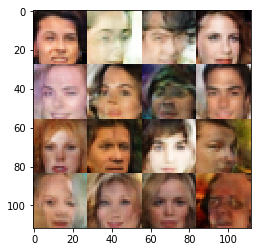

Epoch 5/8... Discriminator Loss: 1.0977 ... Generator Loss: 1.0650
Epoch 5/8... Discriminator Loss: 1.2127 ... Generator Loss: 0.9830
Epoch 5/8... Discriminator Loss: 1.1349 ... Generator Loss: 0.6875
Epoch 5/8... Discriminator Loss: 1.2198 ... Generator Loss: 0.8781
Epoch 5/8... Discriminator Loss: 1.1955 ... Generator Loss: 1.0427
Epoch 5/8... Discriminator Loss: 1.2581 ... Generator Loss: 1.2256
Epoch 5/8... Discriminator Loss: 1.0207 ... Generator Loss: 1.0469
Epoch 5/8... Discriminator Loss: 1.1829 ... Generator Loss: 1.0804
Epoch 5/8... Discriminator Loss: 1.1899 ... Generator Loss: 0.6305
Epoch 5/8... Discriminator Loss: 1.2139 ... Generator Loss: 0.7195


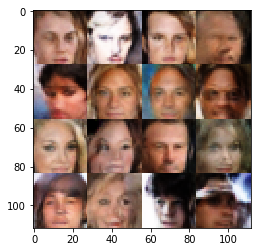

Epoch 5/8... Discriminator Loss: 1.0112 ... Generator Loss: 1.1221
Epoch 5/8... Discriminator Loss: 1.2631 ... Generator Loss: 0.6242
Epoch 5/8... Discriminator Loss: 1.0694 ... Generator Loss: 1.3316
Epoch 5/8... Discriminator Loss: 1.2522 ... Generator Loss: 0.8288
Epoch 5/8... Discriminator Loss: 1.2943 ... Generator Loss: 0.7041
Epoch 5/8... Discriminator Loss: 1.1488 ... Generator Loss: 0.7367
Epoch 5/8... Discriminator Loss: 1.1228 ... Generator Loss: 1.3236
Epoch 5/8... Discriminator Loss: 1.1526 ... Generator Loss: 0.6990
Epoch 5/8... Discriminator Loss: 1.3544 ... Generator Loss: 0.5698
Epoch 5/8... Discriminator Loss: 1.0143 ... Generator Loss: 0.8559


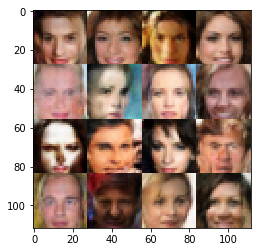

Epoch 5/8... Discriminator Loss: 1.2909 ... Generator Loss: 0.6737
Epoch 5/8... Discriminator Loss: 1.2365 ... Generator Loss: 1.0848
Epoch 5/8... Discriminator Loss: 1.0491 ... Generator Loss: 0.8286
Epoch 5/8... Discriminator Loss: 1.2866 ... Generator Loss: 0.8895
Epoch 5/8... Discriminator Loss: 1.1446 ... Generator Loss: 0.7816
Epoch 5/8... Discriminator Loss: 1.0130 ... Generator Loss: 1.0955
Epoch 5/8... Discriminator Loss: 1.2533 ... Generator Loss: 0.8961
Epoch 5/8... Discriminator Loss: 1.1321 ... Generator Loss: 0.6712
Epoch 5/8... Discriminator Loss: 1.2541 ... Generator Loss: 0.7163
Epoch 5/8... Discriminator Loss: 1.3232 ... Generator Loss: 1.2675


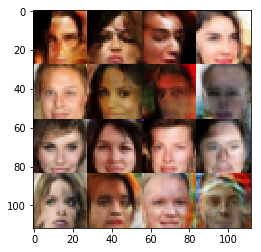

Epoch 5/8... Discriminator Loss: 1.1364 ... Generator Loss: 0.7577
Epoch 5/8... Discriminator Loss: 1.1472 ... Generator Loss: 1.0482
Epoch 5/8... Discriminator Loss: 1.2542 ... Generator Loss: 0.7066
Epoch 5/8... Discriminator Loss: 1.2964 ... Generator Loss: 1.0620
Epoch 5/8... Discriminator Loss: 0.9903 ... Generator Loss: 0.8929
Epoch 5/8... Discriminator Loss: 1.2619 ... Generator Loss: 0.6928
Epoch 5/8... Discriminator Loss: 1.2294 ... Generator Loss: 1.0259
Epoch 5/8... Discriminator Loss: 1.3184 ... Generator Loss: 0.9988
Epoch 5/8... Discriminator Loss: 1.1737 ... Generator Loss: 0.8561
Epoch 5/8... Discriminator Loss: 1.6728 ... Generator Loss: 0.3930


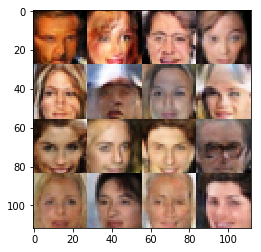

Epoch 5/8... Discriminator Loss: 1.3554 ... Generator Loss: 0.5169
Epoch 5/8... Discriminator Loss: 1.0806 ... Generator Loss: 0.8239
Epoch 5/8... Discriminator Loss: 1.1697 ... Generator Loss: 0.8408
Epoch 5/8... Discriminator Loss: 1.4619 ... Generator Loss: 0.4474
Epoch 5/8... Discriminator Loss: 1.3915 ... Generator Loss: 1.3274
Epoch 5/8... Discriminator Loss: 1.1609 ... Generator Loss: 0.9072
Epoch 5/8... Discriminator Loss: 1.4638 ... Generator Loss: 0.4787
Epoch 5/8... Discriminator Loss: 1.1133 ... Generator Loss: 0.7837
Epoch 5/8... Discriminator Loss: 1.1262 ... Generator Loss: 0.8502
Epoch 5/8... Discriminator Loss: 1.2744 ... Generator Loss: 0.8509


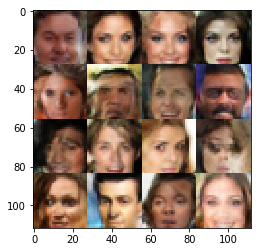

Epoch 5/8... Discriminator Loss: 1.1783 ... Generator Loss: 0.7622
Epoch 5/8... Discriminator Loss: 1.0204 ... Generator Loss: 0.9880
Epoch 5/8... Discriminator Loss: 1.1863 ... Generator Loss: 0.8960
Epoch 5/8... Discriminator Loss: 1.2154 ... Generator Loss: 0.8777
Epoch 5/8... Discriminator Loss: 1.1447 ... Generator Loss: 0.8679
Epoch 5/8... Discriminator Loss: 1.0545 ... Generator Loss: 0.9153
Epoch 5/8... Discriminator Loss: 1.0381 ... Generator Loss: 0.8747
Epoch 5/8... Discriminator Loss: 1.1765 ... Generator Loss: 0.8181
Epoch 5/8... Discriminator Loss: 1.3259 ... Generator Loss: 0.5994
Epoch 5/8... Discriminator Loss: 1.2690 ... Generator Loss: 0.7181


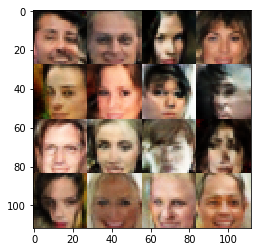

Epoch 5/8... Discriminator Loss: 1.4163 ... Generator Loss: 0.4987
Epoch 5/8... Discriminator Loss: 1.3194 ... Generator Loss: 0.5093
Epoch 5/8... Discriminator Loss: 1.2782 ... Generator Loss: 0.9654
Epoch 5/8... Discriminator Loss: 1.1614 ... Generator Loss: 1.1296
Epoch 5/8... Discriminator Loss: 1.0590 ... Generator Loss: 0.7419
Epoch 5/8... Discriminator Loss: 1.1909 ... Generator Loss: 0.8672
Epoch 5/8... Discriminator Loss: 1.2738 ... Generator Loss: 1.3620
Epoch 5/8... Discriminator Loss: 1.3759 ... Generator Loss: 0.5339
Epoch 5/8... Discriminator Loss: 1.2409 ... Generator Loss: 0.8068
Epoch 5/8... Discriminator Loss: 1.1356 ... Generator Loss: 0.8209


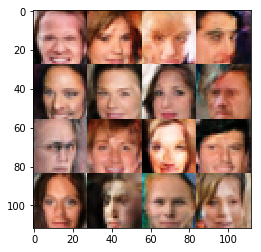

Epoch 5/8... Discriminator Loss: 1.1860 ... Generator Loss: 0.6873
Epoch 5/8... Discriminator Loss: 1.1181 ... Generator Loss: 0.6423
Epoch 5/8... Discriminator Loss: 1.3685 ... Generator Loss: 0.6458
Epoch 5/8... Discriminator Loss: 1.3621 ... Generator Loss: 0.4587
Epoch 5/8... Discriminator Loss: 1.0560 ... Generator Loss: 0.8285
Epoch 5/8... Discriminator Loss: 1.1840 ... Generator Loss: 1.0004
Epoch 5/8... Discriminator Loss: 1.2795 ... Generator Loss: 1.0110
Epoch 5/8... Discriminator Loss: 1.2853 ... Generator Loss: 1.0934
Epoch 5/8... Discriminator Loss: 1.4015 ... Generator Loss: 0.4384
Epoch 5/8... Discriminator Loss: 1.4970 ... Generator Loss: 0.6754


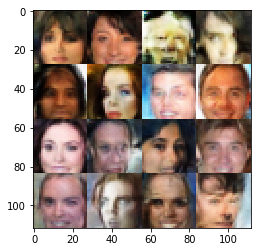

Epoch 5/8... Discriminator Loss: 1.1111 ... Generator Loss: 0.9118
Epoch 5/8... Discriminator Loss: 1.2201 ... Generator Loss: 0.7199
Epoch 5/8... Discriminator Loss: 1.2118 ... Generator Loss: 0.6164
Epoch 5/8... Discriminator Loss: 1.3069 ... Generator Loss: 0.5065
Epoch 5/8... Discriminator Loss: 1.3754 ... Generator Loss: 0.5089
Epoch 5/8... Discriminator Loss: 1.3001 ... Generator Loss: 0.6439
Epoch 5/8... Discriminator Loss: 1.1646 ... Generator Loss: 0.8203
Epoch 5/8... Discriminator Loss: 1.2968 ... Generator Loss: 0.6150
Epoch 5/8... Discriminator Loss: 1.4891 ... Generator Loss: 0.4254
Epoch 5/8... Discriminator Loss: 1.2399 ... Generator Loss: 0.6683


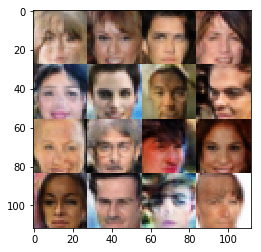

Epoch 5/8... Discriminator Loss: 1.2281 ... Generator Loss: 0.6020
Epoch 5/8... Discriminator Loss: 1.0965 ... Generator Loss: 0.9002
Epoch 5/8... Discriminator Loss: 1.1649 ... Generator Loss: 0.8980
Epoch 5/8... Discriminator Loss: 1.1638 ... Generator Loss: 0.7508
Epoch 5/8... Discriminator Loss: 0.9466 ... Generator Loss: 1.5561
Epoch 5/8... Discriminator Loss: 1.2755 ... Generator Loss: 0.5939
Epoch 5/8... Discriminator Loss: 1.0733 ... Generator Loss: 0.8700
Epoch 5/8... Discriminator Loss: 1.2733 ... Generator Loss: 0.6248
Epoch 5/8... Discriminator Loss: 1.1235 ... Generator Loss: 0.8000
Epoch 5/8... Discriminator Loss: 1.0717 ... Generator Loss: 1.0281


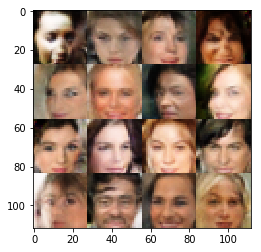

Epoch 5/8... Discriminator Loss: 1.1886 ... Generator Loss: 0.6771
Epoch 5/8... Discriminator Loss: 1.2706 ... Generator Loss: 0.5431
Epoch 5/8... Discriminator Loss: 1.2074 ... Generator Loss: 1.1522
Epoch 5/8... Discriminator Loss: 1.2454 ... Generator Loss: 0.5795
Epoch 5/8... Discriminator Loss: 1.3303 ... Generator Loss: 0.9956
Epoch 5/8... Discriminator Loss: 1.2020 ... Generator Loss: 1.0462
Epoch 5/8... Discriminator Loss: 1.2603 ... Generator Loss: 1.1272
Epoch 5/8... Discriminator Loss: 1.1994 ... Generator Loss: 0.9958
Epoch 5/8... Discriminator Loss: 0.8508 ... Generator Loss: 1.4610
Epoch 5/8... Discriminator Loss: 1.1909 ... Generator Loss: 0.6948


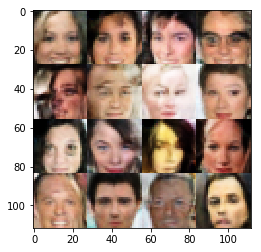

Epoch 5/8... Discriminator Loss: 1.1650 ... Generator Loss: 0.8545
Epoch 5/8... Discriminator Loss: 1.2707 ... Generator Loss: 0.5788
Epoch 5/8... Discriminator Loss: 1.1731 ... Generator Loss: 1.0309
Epoch 5/8... Discriminator Loss: 1.0278 ... Generator Loss: 1.1261
Epoch 5/8... Discriminator Loss: 1.1044 ... Generator Loss: 1.0127
Epoch 5/8... Discriminator Loss: 1.1344 ... Generator Loss: 0.8039
Epoch 5/8... Discriminator Loss: 1.2019 ... Generator Loss: 1.3068
Epoch 5/8... Discriminator Loss: 1.1294 ... Generator Loss: 0.6100
Epoch 5/8... Discriminator Loss: 1.0011 ... Generator Loss: 0.9832
Epoch 5/8... Discriminator Loss: 1.1680 ... Generator Loss: 0.6506


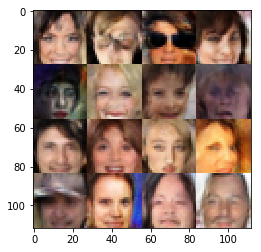

Epoch 5/8... Discriminator Loss: 1.1371 ... Generator Loss: 0.8980
Epoch 5/8... Discriminator Loss: 1.1137 ... Generator Loss: 0.9318
Epoch 5/8... Discriminator Loss: 1.4294 ... Generator Loss: 0.5522
Epoch 5/8... Discriminator Loss: 1.1300 ... Generator Loss: 0.7905
Epoch 5/8... Discriminator Loss: 1.0174 ... Generator Loss: 1.0578
Epoch 5/8... Discriminator Loss: 1.1856 ... Generator Loss: 1.0029
Epoch 5/8... Discriminator Loss: 1.0203 ... Generator Loss: 0.8896
Epoch 5/8... Discriminator Loss: 1.3048 ... Generator Loss: 1.1854
Epoch 5/8... Discriminator Loss: 1.1028 ... Generator Loss: 0.8552
Epoch 5/8... Discriminator Loss: 1.2208 ... Generator Loss: 1.0651


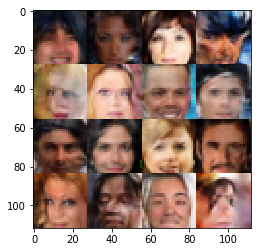

Epoch 5/8... Discriminator Loss: 1.1850 ... Generator Loss: 0.8381
Epoch 5/8... Discriminator Loss: 1.0456 ... Generator Loss: 1.0144
Epoch 5/8... Discriminator Loss: 1.1742 ... Generator Loss: 0.8691
Epoch 5/8... Discriminator Loss: 1.1645 ... Generator Loss: 0.7498
Epoch 5/8... Discriminator Loss: 1.0993 ... Generator Loss: 0.8806
Epoch 5/8... Discriminator Loss: 1.3590 ... Generator Loss: 1.2188
Epoch 5/8... Discriminator Loss: 1.2206 ... Generator Loss: 0.6018
Epoch 5/8... Discriminator Loss: 1.4439 ... Generator Loss: 0.4385
Epoch 5/8... Discriminator Loss: 1.2655 ... Generator Loss: 0.6169
Epoch 5/8... Discriminator Loss: 1.3075 ... Generator Loss: 0.5498


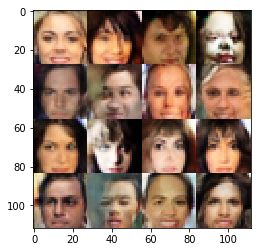

Epoch 5/8... Discriminator Loss: 1.0477 ... Generator Loss: 0.9503
Epoch 5/8... Discriminator Loss: 1.3309 ... Generator Loss: 0.9551
Epoch 5/8... Discriminator Loss: 1.0337 ... Generator Loss: 0.7560
Epoch 5/8... Discriminator Loss: 1.2433 ... Generator Loss: 0.8748
Epoch 5/8... Discriminator Loss: 1.7608 ... Generator Loss: 0.3128
Epoch 5/8... Discriminator Loss: 1.0967 ... Generator Loss: 0.7763
Epoch 5/8... Discriminator Loss: 1.0474 ... Generator Loss: 0.8855
Epoch 5/8... Discriminator Loss: 1.1891 ... Generator Loss: 0.8027
Epoch 5/8... Discriminator Loss: 1.0977 ... Generator Loss: 1.0807
Epoch 5/8... Discriminator Loss: 1.1378 ... Generator Loss: 0.8752


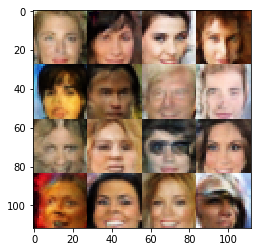

Epoch 5/8... Discriminator Loss: 1.1518 ... Generator Loss: 0.8370
Epoch 5/8... Discriminator Loss: 1.4526 ... Generator Loss: 0.5170
Epoch 5/8... Discriminator Loss: 0.9874 ... Generator Loss: 1.0067
Epoch 5/8... Discriminator Loss: 1.2439 ... Generator Loss: 0.6134
Epoch 5/8... Discriminator Loss: 1.1340 ... Generator Loss: 0.9519
Epoch 5/8... Discriminator Loss: 1.1033 ... Generator Loss: 1.0068
Epoch 5/8... Discriminator Loss: 1.2518 ... Generator Loss: 1.0027
Epoch 5/8... Discriminator Loss: 1.1409 ... Generator Loss: 1.1885
Epoch 5/8... Discriminator Loss: 1.1691 ... Generator Loss: 0.8759
Epoch 5/8... Discriminator Loss: 1.2549 ... Generator Loss: 0.6241


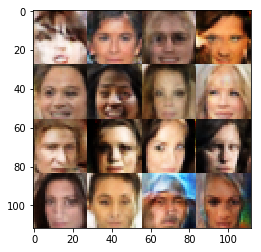

Epoch 5/8... Discriminator Loss: 1.0838 ... Generator Loss: 0.6346
Epoch 5/8... Discriminator Loss: 1.1600 ... Generator Loss: 0.7208
Epoch 5/8... Discriminator Loss: 1.1740 ... Generator Loss: 0.8773
Epoch 5/8... Discriminator Loss: 1.1527 ... Generator Loss: 0.8211
Epoch 5/8... Discriminator Loss: 1.6593 ... Generator Loss: 0.3232
Epoch 5/8... Discriminator Loss: 1.2105 ... Generator Loss: 0.6634
Epoch 5/8... Discriminator Loss: 1.4410 ... Generator Loss: 1.1441
Epoch 5/8... Discriminator Loss: 0.9812 ... Generator Loss: 0.9739
Epoch 5/8... Discriminator Loss: 1.1502 ... Generator Loss: 0.9583
Epoch 5/8... Discriminator Loss: 1.1740 ... Generator Loss: 1.0148


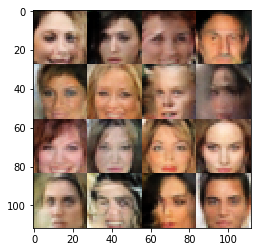

Epoch 5/8... Discriminator Loss: 1.1104 ... Generator Loss: 0.9813
Epoch 5/8... Discriminator Loss: 1.1647 ... Generator Loss: 0.6464
Epoch 5/8... Discriminator Loss: 1.7638 ... Generator Loss: 1.3476
Epoch 5/8... Discriminator Loss: 1.1610 ... Generator Loss: 1.1979
Epoch 5/8... Discriminator Loss: 1.3383 ... Generator Loss: 0.6362
Epoch 5/8... Discriminator Loss: 1.2497 ... Generator Loss: 0.5443
Epoch 5/8... Discriminator Loss: 1.2791 ... Generator Loss: 0.7313
Epoch 5/8... Discriminator Loss: 1.1414 ... Generator Loss: 0.7096
Epoch 5/8... Discriminator Loss: 1.1392 ... Generator Loss: 1.0970
Epoch 5/8... Discriminator Loss: 1.0437 ... Generator Loss: 0.8721


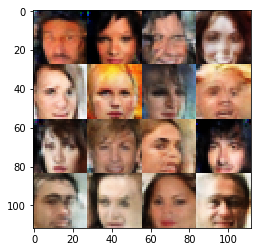

Epoch 5/8... Discriminator Loss: 1.1254 ... Generator Loss: 0.9264
Epoch 5/8... Discriminator Loss: 1.2817 ... Generator Loss: 0.6365
Epoch 5/8... Discriminator Loss: 1.1909 ... Generator Loss: 0.6382
Epoch 5/8... Discriminator Loss: 1.2400 ... Generator Loss: 0.6492
Epoch 5/8... Discriminator Loss: 0.8544 ... Generator Loss: 1.3446
Epoch 5/8... Discriminator Loss: 1.1386 ... Generator Loss: 0.6359
Epoch 5/8... Discriminator Loss: 1.2980 ... Generator Loss: 0.9550
Epoch 5/8... Discriminator Loss: 1.3369 ... Generator Loss: 1.4327
Epoch 5/8... Discriminator Loss: 1.2004 ... Generator Loss: 0.7564
Epoch 5/8... Discriminator Loss: 1.3507 ... Generator Loss: 0.5383


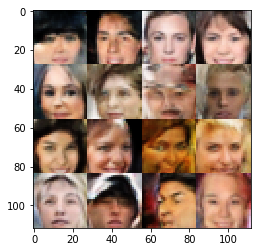

Epoch 5/8... Discriminator Loss: 1.2366 ... Generator Loss: 0.6481
Epoch 5/8... Discriminator Loss: 1.3957 ... Generator Loss: 0.4629


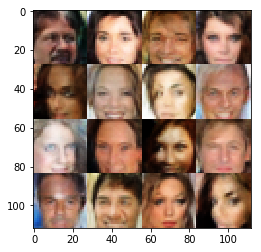

Epoch 6/8... Discriminator Loss: 1.1025 ... Generator Loss: 0.7386
Epoch 6/8... Discriminator Loss: 1.3358 ... Generator Loss: 0.4728
Epoch 6/8... Discriminator Loss: 1.3934 ... Generator Loss: 0.4795
Epoch 6/8... Discriminator Loss: 1.1942 ... Generator Loss: 0.9577
Epoch 6/8... Discriminator Loss: 1.0822 ... Generator Loss: 0.8465
Epoch 6/8... Discriminator Loss: 1.0965 ... Generator Loss: 0.6713
Epoch 6/8... Discriminator Loss: 1.2651 ... Generator Loss: 0.9977
Epoch 6/8... Discriminator Loss: 1.0729 ... Generator Loss: 0.8483


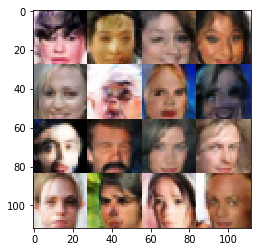

Epoch 6/8... Discriminator Loss: 1.1840 ... Generator Loss: 0.6787
Epoch 6/8... Discriminator Loss: 1.2284 ... Generator Loss: 0.5697
Epoch 6/8... Discriminator Loss: 1.1103 ... Generator Loss: 0.9566
Epoch 6/8... Discriminator Loss: 1.0936 ... Generator Loss: 0.7063
Epoch 6/8... Discriminator Loss: 1.2656 ... Generator Loss: 0.5629
Epoch 6/8... Discriminator Loss: 1.1609 ... Generator Loss: 0.8121
Epoch 6/8... Discriminator Loss: 1.0765 ... Generator Loss: 0.9834
Epoch 6/8... Discriminator Loss: 1.2391 ... Generator Loss: 1.1190
Epoch 6/8... Discriminator Loss: 1.4149 ... Generator Loss: 0.4547
Epoch 6/8... Discriminator Loss: 1.1283 ... Generator Loss: 0.7624


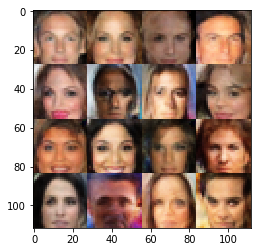

Epoch 6/8... Discriminator Loss: 1.0372 ... Generator Loss: 0.9764
Epoch 6/8... Discriminator Loss: 1.3607 ... Generator Loss: 1.0937
Epoch 6/8... Discriminator Loss: 1.1712 ... Generator Loss: 1.0638
Epoch 6/8... Discriminator Loss: 1.0253 ... Generator Loss: 0.8258
Epoch 6/8... Discriminator Loss: 0.8624 ... Generator Loss: 1.2672
Epoch 6/8... Discriminator Loss: 1.2557 ... Generator Loss: 0.7936
Epoch 6/8... Discriminator Loss: 1.2334 ... Generator Loss: 0.6591
Epoch 6/8... Discriminator Loss: 1.0656 ... Generator Loss: 1.0934
Epoch 6/8... Discriminator Loss: 1.2601 ... Generator Loss: 0.9809
Epoch 6/8... Discriminator Loss: 1.1696 ... Generator Loss: 0.7111


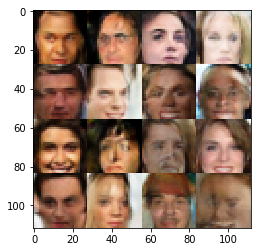

Epoch 6/8... Discriminator Loss: 1.2303 ... Generator Loss: 1.1197
Epoch 6/8... Discriminator Loss: 1.2366 ... Generator Loss: 0.7884
Epoch 6/8... Discriminator Loss: 1.2215 ... Generator Loss: 0.5453
Epoch 6/8... Discriminator Loss: 1.0581 ... Generator Loss: 0.9585
Epoch 6/8... Discriminator Loss: 1.2435 ... Generator Loss: 1.2617
Epoch 6/8... Discriminator Loss: 1.2487 ... Generator Loss: 1.2166
Epoch 6/8... Discriminator Loss: 1.3177 ... Generator Loss: 0.5741
Epoch 6/8... Discriminator Loss: 1.0702 ... Generator Loss: 1.0175
Epoch 6/8... Discriminator Loss: 1.0271 ... Generator Loss: 0.7236
Epoch 6/8... Discriminator Loss: 1.1735 ... Generator Loss: 0.8478


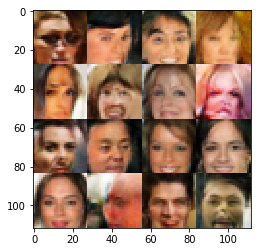

Epoch 6/8... Discriminator Loss: 1.3644 ... Generator Loss: 1.0676
Epoch 6/8... Discriminator Loss: 1.1028 ... Generator Loss: 0.7637
Epoch 6/8... Discriminator Loss: 1.1430 ... Generator Loss: 0.9243
Epoch 6/8... Discriminator Loss: 1.1278 ... Generator Loss: 0.6726
Epoch 6/8... Discriminator Loss: 1.1403 ... Generator Loss: 0.8532
Epoch 6/8... Discriminator Loss: 1.2256 ... Generator Loss: 0.7951
Epoch 6/8... Discriminator Loss: 1.1246 ... Generator Loss: 0.9028
Epoch 6/8... Discriminator Loss: 1.1432 ... Generator Loss: 1.0779
Epoch 6/8... Discriminator Loss: 1.2218 ... Generator Loss: 1.1125
Epoch 6/8... Discriminator Loss: 1.3096 ... Generator Loss: 1.0093


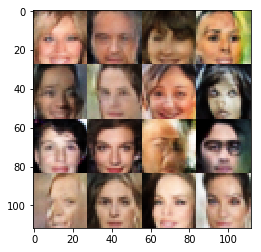

Epoch 6/8... Discriminator Loss: 1.1186 ... Generator Loss: 0.8096
Epoch 6/8... Discriminator Loss: 1.0982 ... Generator Loss: 1.0811
Epoch 6/8... Discriminator Loss: 1.3619 ... Generator Loss: 1.3074
Epoch 6/8... Discriminator Loss: 1.0752 ... Generator Loss: 0.8986
Epoch 6/8... Discriminator Loss: 1.0672 ... Generator Loss: 0.8300
Epoch 6/8... Discriminator Loss: 1.1508 ... Generator Loss: 0.7610
Epoch 6/8... Discriminator Loss: 1.1385 ... Generator Loss: 0.6874
Epoch 6/8... Discriminator Loss: 1.3150 ... Generator Loss: 1.3781
Epoch 6/8... Discriminator Loss: 1.1480 ... Generator Loss: 0.7828
Epoch 6/8... Discriminator Loss: 0.8963 ... Generator Loss: 1.1771


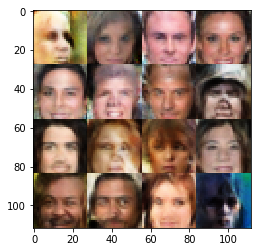

Epoch 6/8... Discriminator Loss: 1.1901 ... Generator Loss: 0.6753
Epoch 6/8... Discriminator Loss: 1.1170 ... Generator Loss: 0.9465
Epoch 6/8... Discriminator Loss: 1.1836 ... Generator Loss: 1.0289
Epoch 6/8... Discriminator Loss: 1.2588 ... Generator Loss: 1.0409
Epoch 6/8... Discriminator Loss: 1.0280 ... Generator Loss: 1.3168
Epoch 6/8... Discriminator Loss: 1.1032 ... Generator Loss: 0.8631
Epoch 6/8... Discriminator Loss: 1.2187 ... Generator Loss: 1.0968
Epoch 6/8... Discriminator Loss: 1.1265 ... Generator Loss: 0.8931
Epoch 6/8... Discriminator Loss: 1.2692 ... Generator Loss: 1.1902
Epoch 6/8... Discriminator Loss: 1.1418 ... Generator Loss: 0.7001


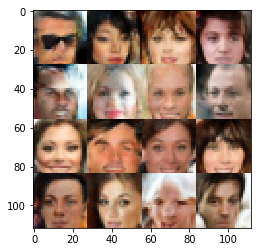

Epoch 6/8... Discriminator Loss: 1.2348 ... Generator Loss: 0.6261
Epoch 6/8... Discriminator Loss: 1.2393 ... Generator Loss: 0.8049
Epoch 6/8... Discriminator Loss: 1.0596 ... Generator Loss: 0.6860
Epoch 6/8... Discriminator Loss: 1.1343 ... Generator Loss: 0.7238
Epoch 6/8... Discriminator Loss: 0.9228 ... Generator Loss: 0.9272
Epoch 6/8... Discriminator Loss: 0.9544 ... Generator Loss: 0.8746
Epoch 6/8... Discriminator Loss: 1.1771 ... Generator Loss: 0.8903
Epoch 6/8... Discriminator Loss: 1.3384 ... Generator Loss: 1.0767
Epoch 6/8... Discriminator Loss: 1.3489 ... Generator Loss: 0.6535
Epoch 6/8... Discriminator Loss: 1.1456 ... Generator Loss: 1.2938


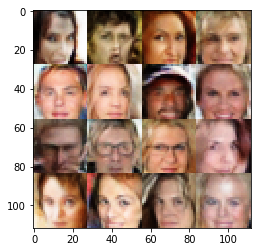

Epoch 6/8... Discriminator Loss: 0.9705 ... Generator Loss: 0.9074
Epoch 6/8... Discriminator Loss: 1.2226 ... Generator Loss: 0.6672
Epoch 6/8... Discriminator Loss: 1.0233 ... Generator Loss: 0.8535
Epoch 6/8... Discriminator Loss: 1.1850 ... Generator Loss: 1.0795
Epoch 6/8... Discriminator Loss: 1.1872 ... Generator Loss: 0.6581
Epoch 6/8... Discriminator Loss: 1.2378 ... Generator Loss: 0.7731
Epoch 6/8... Discriminator Loss: 1.2111 ... Generator Loss: 0.9102
Epoch 6/8... Discriminator Loss: 1.2152 ... Generator Loss: 1.2878
Epoch 6/8... Discriminator Loss: 1.3318 ... Generator Loss: 0.5695
Epoch 6/8... Discriminator Loss: 1.1317 ... Generator Loss: 0.9253


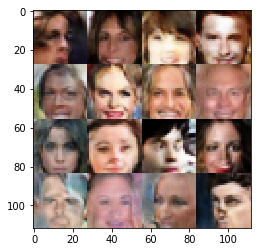

Epoch 6/8... Discriminator Loss: 1.1542 ... Generator Loss: 0.7877
Epoch 6/8... Discriminator Loss: 1.0977 ... Generator Loss: 0.6824
Epoch 6/8... Discriminator Loss: 1.2460 ... Generator Loss: 1.5001
Epoch 6/8... Discriminator Loss: 1.0470 ... Generator Loss: 0.9440
Epoch 6/8... Discriminator Loss: 1.4121 ... Generator Loss: 1.2464
Epoch 6/8... Discriminator Loss: 1.0876 ... Generator Loss: 0.6195
Epoch 6/8... Discriminator Loss: 1.0502 ... Generator Loss: 1.0757
Epoch 6/8... Discriminator Loss: 1.7081 ... Generator Loss: 0.3805
Epoch 6/8... Discriminator Loss: 1.0692 ... Generator Loss: 0.7444
Epoch 6/8... Discriminator Loss: 1.2462 ... Generator Loss: 0.6126


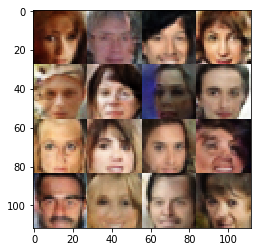

Epoch 6/8... Discriminator Loss: 1.4984 ... Generator Loss: 0.4892
Epoch 6/8... Discriminator Loss: 1.2374 ... Generator Loss: 0.8296
Epoch 6/8... Discriminator Loss: 1.1227 ... Generator Loss: 1.2337
Epoch 6/8... Discriminator Loss: 1.3946 ... Generator Loss: 0.7157
Epoch 6/8... Discriminator Loss: 1.0923 ... Generator Loss: 0.7498
Epoch 6/8... Discriminator Loss: 1.2320 ... Generator Loss: 1.1296
Epoch 6/8... Discriminator Loss: 1.3017 ... Generator Loss: 0.6359
Epoch 6/8... Discriminator Loss: 1.0718 ... Generator Loss: 1.1354
Epoch 6/8... Discriminator Loss: 1.1287 ... Generator Loss: 1.0258
Epoch 6/8... Discriminator Loss: 1.2180 ... Generator Loss: 0.6871


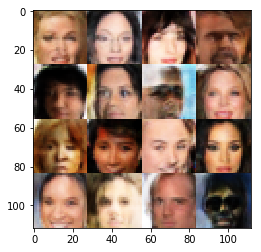

Epoch 6/8... Discriminator Loss: 1.1434 ... Generator Loss: 1.2236
Epoch 6/8... Discriminator Loss: 1.5460 ... Generator Loss: 1.5286
Epoch 6/8... Discriminator Loss: 1.2998 ... Generator Loss: 0.8285
Epoch 6/8... Discriminator Loss: 1.1969 ... Generator Loss: 0.8814
Epoch 6/8... Discriminator Loss: 1.1500 ... Generator Loss: 0.7671
Epoch 6/8... Discriminator Loss: 1.0476 ... Generator Loss: 0.8696
Epoch 6/8... Discriminator Loss: 1.2182 ... Generator Loss: 1.0542
Epoch 6/8... Discriminator Loss: 1.2133 ... Generator Loss: 0.6160
Epoch 6/8... Discriminator Loss: 1.1817 ... Generator Loss: 0.8326
Epoch 6/8... Discriminator Loss: 1.3123 ... Generator Loss: 1.0128


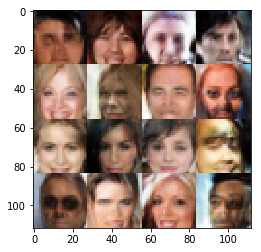

Epoch 6/8... Discriminator Loss: 1.0240 ... Generator Loss: 1.0535
Epoch 6/8... Discriminator Loss: 1.2939 ... Generator Loss: 0.5557
Epoch 6/8... Discriminator Loss: 0.9911 ... Generator Loss: 0.9933
Epoch 6/8... Discriminator Loss: 1.0363 ... Generator Loss: 1.3468
Epoch 6/8... Discriminator Loss: 1.2285 ... Generator Loss: 0.6889
Epoch 6/8... Discriminator Loss: 1.1528 ... Generator Loss: 0.6675
Epoch 6/8... Discriminator Loss: 0.9437 ... Generator Loss: 1.0022
Epoch 6/8... Discriminator Loss: 1.1904 ... Generator Loss: 0.6200
Epoch 6/8... Discriminator Loss: 1.1917 ... Generator Loss: 0.9512
Epoch 6/8... Discriminator Loss: 1.1335 ... Generator Loss: 0.6919


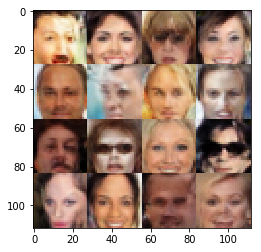

Epoch 6/8... Discriminator Loss: 1.0510 ... Generator Loss: 1.0682
Epoch 6/8... Discriminator Loss: 1.2244 ... Generator Loss: 0.6631
Epoch 6/8... Discriminator Loss: 1.3058 ... Generator Loss: 0.4901
Epoch 6/8... Discriminator Loss: 1.1762 ... Generator Loss: 1.0579
Epoch 6/8... Discriminator Loss: 0.9787 ... Generator Loss: 1.2392
Epoch 6/8... Discriminator Loss: 1.0390 ... Generator Loss: 1.1638
Epoch 6/8... Discriminator Loss: 0.9414 ... Generator Loss: 1.1371
Epoch 6/8... Discriminator Loss: 1.2707 ... Generator Loss: 0.5521
Epoch 6/8... Discriminator Loss: 1.2146 ... Generator Loss: 0.6278
Epoch 6/8... Discriminator Loss: 1.3181 ... Generator Loss: 0.5459


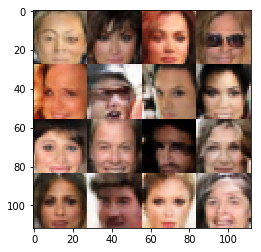

Epoch 6/8... Discriminator Loss: 1.3899 ... Generator Loss: 0.5161
Epoch 6/8... Discriminator Loss: 1.1377 ... Generator Loss: 1.1163
Epoch 6/8... Discriminator Loss: 1.1067 ... Generator Loss: 0.8415
Epoch 6/8... Discriminator Loss: 0.9709 ... Generator Loss: 1.0257
Epoch 6/8... Discriminator Loss: 0.9688 ... Generator Loss: 1.0460
Epoch 6/8... Discriminator Loss: 1.0928 ... Generator Loss: 1.3717
Epoch 6/8... Discriminator Loss: 1.2055 ... Generator Loss: 0.5483
Epoch 6/8... Discriminator Loss: 1.2005 ... Generator Loss: 0.5775
Epoch 6/8... Discriminator Loss: 1.3070 ... Generator Loss: 0.6585
Epoch 6/8... Discriminator Loss: 1.3906 ... Generator Loss: 0.5148


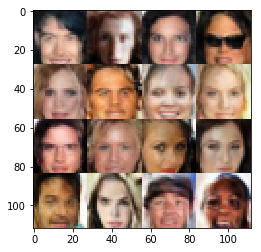

Epoch 6/8... Discriminator Loss: 0.9951 ... Generator Loss: 0.9430
Epoch 6/8... Discriminator Loss: 1.3246 ... Generator Loss: 0.5490
Epoch 6/8... Discriminator Loss: 1.1433 ... Generator Loss: 0.6761
Epoch 6/8... Discriminator Loss: 1.1081 ... Generator Loss: 1.0272
Epoch 6/8... Discriminator Loss: 1.4343 ... Generator Loss: 1.1965
Epoch 6/8... Discriminator Loss: 1.3025 ... Generator Loss: 0.5406
Epoch 6/8... Discriminator Loss: 1.0577 ... Generator Loss: 0.9286
Epoch 6/8... Discriminator Loss: 1.1940 ... Generator Loss: 0.5706
Epoch 6/8... Discriminator Loss: 1.0578 ... Generator Loss: 0.8556
Epoch 6/8... Discriminator Loss: 1.0900 ... Generator Loss: 1.0100


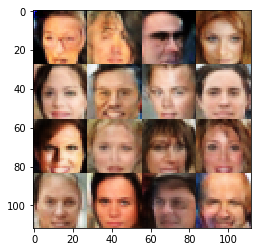

Epoch 6/8... Discriminator Loss: 1.0700 ... Generator Loss: 1.4123
Epoch 6/8... Discriminator Loss: 1.1771 ... Generator Loss: 1.0829
Epoch 6/8... Discriminator Loss: 1.4071 ... Generator Loss: 1.4595
Epoch 6/8... Discriminator Loss: 1.1291 ... Generator Loss: 1.1042
Epoch 6/8... Discriminator Loss: 1.1358 ... Generator Loss: 0.9297
Epoch 6/8... Discriminator Loss: 1.0545 ... Generator Loss: 0.9584
Epoch 6/8... Discriminator Loss: 1.1658 ... Generator Loss: 0.9006
Epoch 6/8... Discriminator Loss: 1.0774 ... Generator Loss: 0.8123
Epoch 6/8... Discriminator Loss: 0.9849 ... Generator Loss: 0.8348
Epoch 6/8... Discriminator Loss: 1.1143 ... Generator Loss: 0.6687


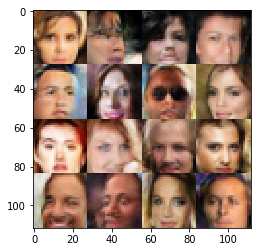

Epoch 6/8... Discriminator Loss: 1.0901 ... Generator Loss: 0.8592
Epoch 6/8... Discriminator Loss: 1.4516 ... Generator Loss: 1.4167
Epoch 6/8... Discriminator Loss: 1.2280 ... Generator Loss: 0.6484
Epoch 6/8... Discriminator Loss: 1.0436 ... Generator Loss: 0.7982
Epoch 6/8... Discriminator Loss: 1.0229 ... Generator Loss: 1.0136
Epoch 6/8... Discriminator Loss: 1.3745 ... Generator Loss: 1.7508
Epoch 6/8... Discriminator Loss: 1.3097 ... Generator Loss: 1.3321
Epoch 6/8... Discriminator Loss: 1.2609 ... Generator Loss: 0.5719
Epoch 6/8... Discriminator Loss: 1.2624 ... Generator Loss: 0.4824
Epoch 6/8... Discriminator Loss: 1.2920 ... Generator Loss: 0.5488


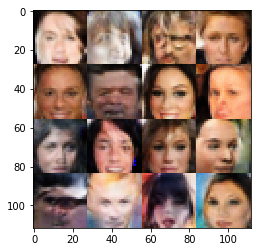

Epoch 6/8... Discriminator Loss: 1.1122 ... Generator Loss: 1.1258
Epoch 6/8... Discriminator Loss: 1.1905 ... Generator Loss: 1.0712
Epoch 6/8... Discriminator Loss: 1.2008 ... Generator Loss: 0.6854
Epoch 6/8... Discriminator Loss: 1.1276 ... Generator Loss: 1.3683
Epoch 6/8... Discriminator Loss: 1.4012 ... Generator Loss: 0.4933
Epoch 6/8... Discriminator Loss: 0.9263 ... Generator Loss: 1.2894
Epoch 6/8... Discriminator Loss: 1.1864 ... Generator Loss: 1.1758
Epoch 6/8... Discriminator Loss: 1.1005 ... Generator Loss: 1.1072
Epoch 6/8... Discriminator Loss: 1.0423 ... Generator Loss: 1.1861
Epoch 6/8... Discriminator Loss: 1.4301 ... Generator Loss: 1.4813


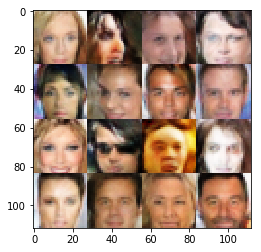

Epoch 6/8... Discriminator Loss: 1.0151 ... Generator Loss: 0.8752
Epoch 6/8... Discriminator Loss: 1.5454 ... Generator Loss: 0.4422
Epoch 6/8... Discriminator Loss: 1.1344 ... Generator Loss: 0.6429
Epoch 6/8... Discriminator Loss: 1.1385 ... Generator Loss: 0.7047
Epoch 6/8... Discriminator Loss: 1.1604 ... Generator Loss: 0.7910
Epoch 6/8... Discriminator Loss: 0.9655 ... Generator Loss: 1.1082
Epoch 6/8... Discriminator Loss: 1.0759 ... Generator Loss: 0.9455
Epoch 6/8... Discriminator Loss: 1.0680 ... Generator Loss: 1.2226
Epoch 6/8... Discriminator Loss: 1.1950 ... Generator Loss: 1.3109
Epoch 6/8... Discriminator Loss: 1.2714 ... Generator Loss: 1.3462


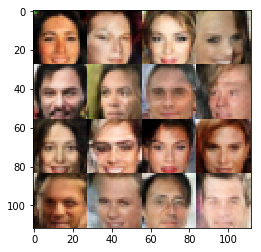

Epoch 6/8... Discriminator Loss: 1.0992 ... Generator Loss: 0.9341
Epoch 6/8... Discriminator Loss: 0.9464 ... Generator Loss: 1.0651
Epoch 6/8... Discriminator Loss: 1.0793 ... Generator Loss: 1.0945
Epoch 6/8... Discriminator Loss: 1.0542 ... Generator Loss: 0.8243
Epoch 6/8... Discriminator Loss: 1.2786 ... Generator Loss: 0.5532
Epoch 6/8... Discriminator Loss: 1.1960 ... Generator Loss: 0.6692
Epoch 6/8... Discriminator Loss: 1.0032 ... Generator Loss: 1.4036
Epoch 6/8... Discriminator Loss: 1.1830 ... Generator Loss: 0.7216
Epoch 6/8... Discriminator Loss: 1.2169 ... Generator Loss: 0.6055
Epoch 6/8... Discriminator Loss: 1.2288 ... Generator Loss: 0.5882


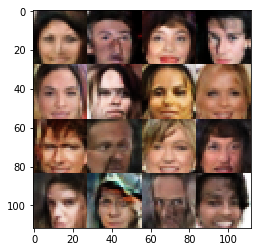

Epoch 6/8... Discriminator Loss: 1.3959 ... Generator Loss: 0.4370
Epoch 6/8... Discriminator Loss: 1.0835 ... Generator Loss: 0.9560
Epoch 6/8... Discriminator Loss: 0.8925 ... Generator Loss: 1.0751
Epoch 6/8... Discriminator Loss: 1.1900 ... Generator Loss: 1.2840
Epoch 6/8... Discriminator Loss: 0.9801 ... Generator Loss: 1.4863
Epoch 6/8... Discriminator Loss: 1.0613 ... Generator Loss: 0.9392
Epoch 6/8... Discriminator Loss: 0.8882 ... Generator Loss: 1.1451
Epoch 6/8... Discriminator Loss: 1.0485 ... Generator Loss: 0.8745
Epoch 6/8... Discriminator Loss: 0.9279 ... Generator Loss: 1.2983
Epoch 6/8... Discriminator Loss: 1.1508 ... Generator Loss: 1.3877


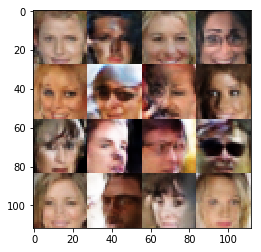

Epoch 6/8... Discriminator Loss: 1.0240 ... Generator Loss: 1.3019
Epoch 6/8... Discriminator Loss: 1.7005 ... Generator Loss: 1.5961
Epoch 6/8... Discriminator Loss: 1.0911 ... Generator Loss: 0.9428
Epoch 6/8... Discriminator Loss: 1.0400 ... Generator Loss: 0.8942
Epoch 6/8... Discriminator Loss: 1.2515 ... Generator Loss: 0.7943
Epoch 6/8... Discriminator Loss: 0.9962 ... Generator Loss: 0.9658
Epoch 6/8... Discriminator Loss: 1.0226 ... Generator Loss: 0.9585
Epoch 6/8... Discriminator Loss: 1.3584 ... Generator Loss: 1.3731
Epoch 6/8... Discriminator Loss: 1.2005 ... Generator Loss: 0.9422
Epoch 6/8... Discriminator Loss: 1.2804 ... Generator Loss: 0.5695


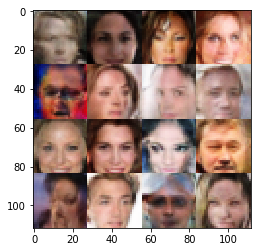

Epoch 6/8... Discriminator Loss: 1.2546 ... Generator Loss: 0.5418
Epoch 6/8... Discriminator Loss: 1.1081 ... Generator Loss: 0.6911
Epoch 6/8... Discriminator Loss: 0.9971 ... Generator Loss: 1.3714
Epoch 6/8... Discriminator Loss: 1.1853 ... Generator Loss: 0.7833
Epoch 6/8... Discriminator Loss: 1.7604 ... Generator Loss: 0.3455
Epoch 6/8... Discriminator Loss: 0.9847 ... Generator Loss: 1.0464
Epoch 6/8... Discriminator Loss: 1.0783 ... Generator Loss: 0.9074
Epoch 6/8... Discriminator Loss: 0.8924 ... Generator Loss: 0.9935
Epoch 6/8... Discriminator Loss: 0.8676 ... Generator Loss: 1.2614
Epoch 6/8... Discriminator Loss: 1.0302 ... Generator Loss: 0.9567


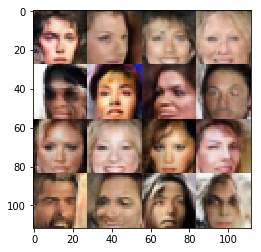

Epoch 6/8... Discriminator Loss: 1.0872 ... Generator Loss: 1.5103
Epoch 6/8... Discriminator Loss: 1.1571 ... Generator Loss: 1.3269
Epoch 6/8... Discriminator Loss: 1.0794 ... Generator Loss: 0.7917
Epoch 6/8... Discriminator Loss: 1.1272 ... Generator Loss: 0.7799
Epoch 6/8... Discriminator Loss: 1.0305 ... Generator Loss: 0.9103
Epoch 6/8... Discriminator Loss: 1.0760 ... Generator Loss: 0.9011
Epoch 6/8... Discriminator Loss: 1.1400 ... Generator Loss: 1.0155
Epoch 6/8... Discriminator Loss: 1.0628 ... Generator Loss: 0.6901
Epoch 6/8... Discriminator Loss: 1.1178 ... Generator Loss: 0.7029
Epoch 6/8... Discriminator Loss: 0.9923 ... Generator Loss: 0.7808


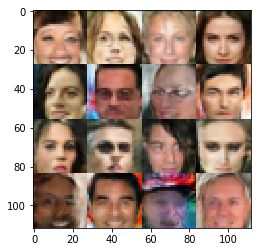

Epoch 6/8... Discriminator Loss: 1.0350 ... Generator Loss: 1.3017
Epoch 6/8... Discriminator Loss: 1.3505 ... Generator Loss: 0.4952
Epoch 6/8... Discriminator Loss: 1.0507 ... Generator Loss: 1.0851
Epoch 6/8... Discriminator Loss: 1.4480 ... Generator Loss: 0.5027
Epoch 6/8... Discriminator Loss: 1.2189 ... Generator Loss: 1.4924
Epoch 6/8... Discriminator Loss: 1.2042 ... Generator Loss: 0.9780
Epoch 6/8... Discriminator Loss: 1.1713 ... Generator Loss: 1.0453
Epoch 6/8... Discriminator Loss: 1.3431 ... Generator Loss: 0.6070
Epoch 6/8... Discriminator Loss: 1.4273 ... Generator Loss: 0.5119
Epoch 6/8... Discriminator Loss: 1.1854 ... Generator Loss: 0.6374


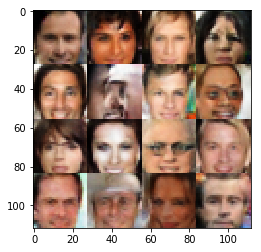

Epoch 6/8... Discriminator Loss: 1.0726 ... Generator Loss: 0.7502
Epoch 6/8... Discriminator Loss: 0.9808 ... Generator Loss: 0.8326
Epoch 6/8... Discriminator Loss: 1.2654 ... Generator Loss: 0.5250
Epoch 6/8... Discriminator Loss: 1.0248 ... Generator Loss: 0.9102
Epoch 6/8... Discriminator Loss: 1.0627 ... Generator Loss: 0.7876
Epoch 6/8... Discriminator Loss: 1.3968 ... Generator Loss: 1.4168
Epoch 6/8... Discriminator Loss: 1.0040 ... Generator Loss: 1.2571
Epoch 6/8... Discriminator Loss: 1.1489 ... Generator Loss: 0.8776
Epoch 6/8... Discriminator Loss: 1.0014 ... Generator Loss: 1.1875
Epoch 6/8... Discriminator Loss: 1.2737 ... Generator Loss: 0.6320


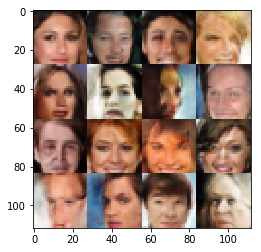

Epoch 6/8... Discriminator Loss: 1.2429 ... Generator Loss: 1.3030
Epoch 6/8... Discriminator Loss: 1.4612 ... Generator Loss: 0.5452
Epoch 6/8... Discriminator Loss: 1.2087 ... Generator Loss: 0.8084
Epoch 6/8... Discriminator Loss: 1.3864 ... Generator Loss: 0.4757
Epoch 6/8... Discriminator Loss: 0.9675 ... Generator Loss: 1.0581
Epoch 6/8... Discriminator Loss: 1.0132 ... Generator Loss: 1.1199
Epoch 6/8... Discriminator Loss: 1.0624 ... Generator Loss: 1.0320
Epoch 6/8... Discriminator Loss: 1.0249 ... Generator Loss: 0.9830
Epoch 6/8... Discriminator Loss: 1.0768 ... Generator Loss: 1.4318
Epoch 6/8... Discriminator Loss: 1.0214 ... Generator Loss: 1.3507


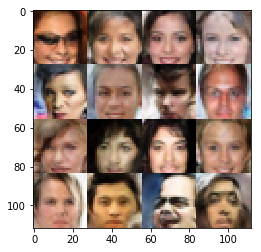

Epoch 6/8... Discriminator Loss: 1.2013 ... Generator Loss: 0.8771
Epoch 6/8... Discriminator Loss: 1.1918 ... Generator Loss: 1.1294
Epoch 6/8... Discriminator Loss: 1.1403 ... Generator Loss: 1.2657
Epoch 6/8... Discriminator Loss: 1.0875 ... Generator Loss: 1.0612
Epoch 6/8... Discriminator Loss: 1.2007 ... Generator Loss: 1.0431
Epoch 6/8... Discriminator Loss: 1.0423 ... Generator Loss: 1.4647
Epoch 6/8... Discriminator Loss: 1.2223 ... Generator Loss: 1.3315
Epoch 6/8... Discriminator Loss: 1.2334 ... Generator Loss: 0.5671
Epoch 6/8... Discriminator Loss: 1.1727 ... Generator Loss: 1.1443
Epoch 6/8... Discriminator Loss: 1.2711 ... Generator Loss: 0.6629


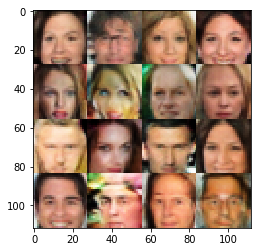

Epoch 6/8... Discriminator Loss: 1.1071 ... Generator Loss: 0.8204
Epoch 6/8... Discriminator Loss: 1.0405 ... Generator Loss: 1.3681
Epoch 6/8... Discriminator Loss: 1.0035 ... Generator Loss: 0.9757
Epoch 6/8... Discriminator Loss: 1.0804 ... Generator Loss: 1.0271
Epoch 6/8... Discriminator Loss: 1.1955 ... Generator Loss: 0.6534
Epoch 6/8... Discriminator Loss: 1.1011 ... Generator Loss: 0.6958
Epoch 6/8... Discriminator Loss: 1.1614 ... Generator Loss: 0.9410
Epoch 6/8... Discriminator Loss: 1.0623 ... Generator Loss: 0.7738
Epoch 6/8... Discriminator Loss: 0.9490 ... Generator Loss: 1.2073
Epoch 6/8... Discriminator Loss: 1.1167 ... Generator Loss: 0.7916


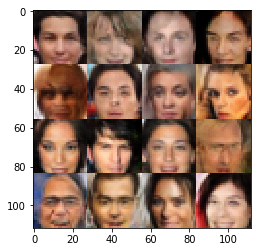

Epoch 6/8... Discriminator Loss: 1.1370 ... Generator Loss: 1.3074
Epoch 6/8... Discriminator Loss: 0.9029 ... Generator Loss: 1.2164
Epoch 6/8... Discriminator Loss: 1.1777 ... Generator Loss: 0.8937
Epoch 6/8... Discriminator Loss: 0.8609 ... Generator Loss: 1.2553
Epoch 6/8... Discriminator Loss: 1.1736 ... Generator Loss: 1.1880
Epoch 6/8... Discriminator Loss: 0.9094 ... Generator Loss: 1.1604
Epoch 6/8... Discriminator Loss: 0.9374 ... Generator Loss: 1.0174
Epoch 6/8... Discriminator Loss: 1.4808 ... Generator Loss: 0.5201


In [ ]:
batch_size  = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.